In [1]:
import sys
import os
import numpy as np
import mat73
import matplotlib.pyplot as plt
import random
import torch
import torch.nn as nn
import torch.optim as optim
import xarray as xr 
import scipy
from numpy.polynomial.polynomial import Polynomial
from torch.utils.data import DataLoader
from sklearn.decomposition import PCA
# from scipy.signal import convolve2d
from scipy.interpolate import RegularGridInterpolator, interp1d, make_interp_spline, splrep, BSpline
from torch.utils.data import random_split
import pickle
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from datetime import datetime, timedelta
from sklearn.cluster import MiniBatchKMeans
import matplotlib.colors as mcolors
import gsw
import seaborn as sns
from scipy.stats import linregress
from scipy.spatial.distance import cdist
import cmocean.cm as ccm
    
# from matplotlib.dates import date2num, num2date
# from sklearn.cluster import MiniBatchKMeans
sys.path.append("/unity/g2/jmiranda/SubsurfaceFields/GEM_SubsurfaceFields/eoas_pyutils/")
from io_utils.coaps_io_data import get_aviso_by_date, get_sst_by_date, get_sss_by_date
sys.path.append("/unity/g2/jmiranda/SubsurfaceFields/GEM_SubsurfaceFields/")


plt.rcParams.update({'font.size': 18})
# Set the seed for reproducibility
load_trained_model = True
gen_paula_profiles = False
seed = 42
torch.manual_seed(seed)
random.seed(seed)
np.random.seed(seed)

coolwhitewarm = mcolors.LinearSegmentedColormap.from_list(name='red_white_blue', 
                                                 colors =[(0, 0, 1), 
                                                          (1, 1., 1), 
                                                          (1, 0, 0)]
                                                 )

def datenum_to_datetime(matlab_datenum):
    # MATLAB's datenum (1) is equivalent to January 1, year 0000, but Python's datetime minimal year is 1
    # There are 366 days for year 0 in MATLAB (it's a leap year in proleptic ISO calendar)
    days_from_year_0_to_year_1 = 366
    python_datetime = datetime.fromordinal(int(matlab_datenum) - days_from_year_0_to_year_1) + timedelta(days=matlab_datenum % 1)
    return python_datetime

def rmse(predictions, targets):
    return np.sqrt(np.nanmean(((predictions - targets) ** 2)))

def bias(predictions, targets):
    return np.nanmean((predictions - targets))

def mad(x):
    '''
    median absolute deviation
    '''
    return np.nanmedian(np.absolute(x - np.nanmedian(x, axis = 1, keepdims=True)), axis = 1)

class TemperatureSalinityDataset(torch.utils.data.Dataset):
    """
    Custom dataset for temperature and salinity profiles.
    
    Attributes:
    - TEMP: Temperature profiles matrix.
    - SAL: Salinity profiles matrix.
    - SSH: Sea Surface Height vector.
    - pca_temp: PCA model for temperature profiles.
    - pca_sal: PCA model for salinity profiles.
    - temp_pcs: Transformed temperature profiles using PCA.
    - sal_pcs: Transformed salinity profiles using PCA.
    """
    def __init__(self, n_components=15, input_params=None, max_depth = 2000, min_depth = 20):
        """
        
        Args:
        - path (str): File path to the dataset.
        - n_components (int): Number of PCA components to retain.
        """
        self.data_path =  "/unity/g2/jmiranda/SubsurfaceFields/Data/ARGO_GoM_20220920.mat"
        self.aviso_folder = "/unity/f1/ozavala/DATA/GOFFISH/AVISO/GoM/"
        self.sst_folder = "/unity/f1/ozavala/DATA/GOFFISH/SST/OISST"
        self.sss_folder = "/Net/work/ozavala/DATA/GOFFISH/SSS/SMAP_Global/"
        
        self.max_depth = max_depth
        self.min_depth = min_depth # data quality is poor above 20m
        
        self.data = mat73.loadmat(self.data_path)
        self.TIME = [datenum_to_datetime(datenum) for datenum in self.data['TIME']]
        
        # self.TIME = data['TIME']
        self.LAT = self.data['LAT']
        self.LON = self.data['LON']
        self.SH1950 = self.data['SH1950']
        self.min_lat = 18.0
        self.max_lat = 31.0
        self.min_lon = -98.0
        self.max_lon = -81.0
        
        # # Define which parameters to include
        # if input_params is None:
        #     input_params = {
        #         "timecos": True,
        #         "timesin": True,
        #         "latcos": True,
        #         "latsin": True,
        #         "loncos": True,
        #         "lonsin": True,
        #         "sst": True,  # First value of temperature
        #         "sss": True,
        #         "ssh": True
        #     }

        self.input_params = input_params
        
        self.SSS, self.SST, self.AVISO_ADT = self._load_satellite_data()
        self.satSSS, self.satSST, self.sat_ADT = np.copy(self.SSS), np.copy(self.SST), np.copy(self.AVISO_ADT) #backup
        
        # self.adjust_ADT()
        
        self.valid_mask = self._get_valid_mask(self.data)
        valid_mask = self.valid_mask
        self.TEMP, self.SAL, self.AVISO_ADT, self.SST, self.SSS, self.TIME, self.LAT, self.LON, self.SH1950 = self._filter_and_fill_data(self.data, valid_mask)
        
        # Applying PCA
        self.temp_pcs, self.pca_temp = self._apply_pca(self.TEMP, n_components)
        self.sal_pcs, self.pca_sal = self._apply_pca(self.SAL, n_components)
        
    # def adjust_ADT(self):
    #     #  Remove the daily mean ADT from the AVISO_ADT
        
    #     gom_mean = xr.load_dataset('/unity/g2/jmiranda/SubsurfaceFields/Data/gom_mean_adt_2013_2022.nc')
    #     self.mean_adt = gom_mean.gom_mean_adt.values
    #     self.time_mean_adt = np.floor(gom_mean.time.values)

    #     for i, t in enumerate(self.data['TIME']):
    #         t = np.floor(t)
    #         i_match = self.time_mean_adt == t
    #         if np.sum(i_match) == 0:
    #             print(f"No match: idx: {i}\t .nc time: {t}")
    #         elif np.sum(i_match) > 1:
    #             print(f"Multiple matches at dx: {i}\t .nc time: {t}")
    #         # else:
    #         #     print(f"Single match: {i} \t {t} \t {mean_adt[i_match]} ")
                
    #         self.AVISO_ADT[i] = self.AVISO_ADT[i] - self.mean_adt[i_match]
    
# full_dataset.AVISO_ADT[0], full_dataset.bkp_ADT[0]

    def reload(self):
        # in case we want to change parameters...
        self.SSS, self.SST, self.AVISO_ADT = np.copy(self.satSSS), np.copy(self.satSST), np.copy(self.sat_ADT)
        self.data = mat73.loadmat(self.data_path)
        # self.adjust_ADT()

        valid_mask = self._get_valid_mask(self.data)
        self.TEMP, self.SAL, self.AVISO_ADT, self.SST, self.SSS, self.TIME, self.LAT, self.LON, self.SH1950 = self._filter_and_fill_data(self.data, valid_mask)
        
        # Applying PCA
        self.temp_pcs, self.pca_temp = self._apply_pca(self.TEMP, n_components)
        self.sal_pcs, self.pca_sal = self._apply_pca(self.SAL, n_components)
        
        print("self.LAT")
        print(f"{np.min(self.LAT)}, {np.max(self.LAT)}")
        print("self.LON")
        print(f"{np.min(self.LON)}, {np.max(self.LON)}")      
        print("self.SST")
        print(f"{np.min(self.SST)}, {np.max(self.SST)}")
        print("self.SSS")
        print(f"{np.min(self.SSS)}, {np.max(self.SSS)}")
        print("self.AVISO_ADT")
        print(f"{np.min(self.AVISO_ADT)}, {np.max(self.AVISO_ADT)}")

    def _load_satellite_data(self):
        """
        New method to load SST and SSH data
        """
        aviso_folder = "/unity/f1/ozavala/DATA/GOFFISH/AVISO/GoM/"
        sst_folder = "/unity/f1/ozavala/DATA/GOFFISH/SST/OISST"
        sss_folder = "/Net/work/ozavala/DATA/GOFFISH/SSS/SMAP_Global/"
        min_lat = 18.0
        max_lat = 31.0
        min_lon = -98.0
        max_lon = -81.0
        ex_lon = -88.0
        ex_lat = 23.0
        unique_dates =  sorted(list(set(self.TIME)))
        sss_data = np.nan * np.ones(len(self.TIME))
        sst_data = np.nan * np.ones(len(self.TIME))
        aviso_data = np.nan * np.ones(len(self.TIME))
        bbox=(min_lat, max_lat, min_lon, max_lon)
        
        # # Convert serialized date numbers to date objects
        # base_date = datetime(1, 1, 1)

        # for idx, serialized_date in enumerate(unique_dates):
        for idx, c_date in enumerate(unique_dates):
            # c_date = base_date + timedelta(days=float(serialized_date))
            date_idx = np.array([date_obj == c_date for date_obj in self.TIME])  # Ensure both sides of the comparison are datetime objects
            coordinates = np.array([self.LAT[date_idx], self.LON[date_idx]]).T
            
            # TODO: get errors
            
            try:
                sss_datapoint, lats, lons = get_sss_by_date(sss_folder, c_date, bbox)
                interpolator = RegularGridInterpolator((lats, lons), sss_datapoint.sss_smap_40km.values, bounds_error=False, fill_value=None)
                sss_data[date_idx] = interpolator(coordinates)
                if (sss_data[date_idx] < 0).any() or (sss_data[date_idx] > 45).any():
                    sss_data[date_idx] = np.nan
                    print(f"Invalid SSS on date {c_date}, value: {sss_data[date_idx]}, coordinates: {coordinates}, lats: {lats}, lons: {lons}")
            except Exception as e:
                print(f"SSS not found on date {c_date}. Error: {e}")
            
            try:
                aviso_adt, aviso_lats, aviso_lons = get_aviso_by_date(aviso_folder, c_date, bbox)
                # Generate 2D arrays of latitudes and longitudes for each point in the grid
                lons, lats = np.meshgrid(aviso_lons, aviso_lats)

                # Create the mask based on inclusion criteria (bbox) and exclusion criteria
                inclusion_mask = (lats >= min_lat) & (lats <= max_lat) & (lons >= min_lon) & (lons <= max_lon)
                exclusion_mask = (lats < ex_lat) & (lons > ex_lon)

                # Combine masks to exclude the specified area
                combined_mask = inclusion_mask & ~exclusion_mask

                # Apply the combined mask to filter the data before calculating the mean
                daily_avg = np.nanmean(aviso_adt.adt.values[combined_mask])
                            
                interpolator_ssh = RegularGridInterpolator((aviso_lats, aviso_lons), aviso_adt.adt.values, bounds_error=False, fill_value=None)
                aviso_data[date_idx] = interpolator_ssh(coordinates) - daily_avg
            except Exception as e:
                print("AVISO not found for date ", c_date, "Error: ", str(e))
                continue

            try:
                sst_date, sst_lats, sst_lons = get_sst_by_date(sst_folder, c_date, bbox)
                interpolator_sst = RegularGridInterpolator((sst_lats, sst_lons), sst_date.analysed_sst.values[0], bounds_error=False, fill_value=None)
                sst_data[date_idx] = interpolator_sst(coordinates)
            except Exception as e:
                print("SST not found for date ", c_date, "Error: ", str(e))
                continue

    # Check if data was actually filled
            if np.isnan(aviso_data[date_idx]).all():
                print(f"No AVISO data for date {c_date}")
            if np.isnan(sst_data[date_idx]).all():
                print(f"No SST data for date {c_date}")

        return sss_data, sst_data, aviso_data

    def __getitem__(self, idx):
        """
        Args:
        - idx (int): Index of the profile.

        Returns:
        - tuple: input values and concatenated PCA components for temperature and salinity.
        """
        
        inputs = []
        
        if self.input_params["timecos"]:
            inputs.append(np.cos(2*np.pi*(self.TIME[idx]%365)/365)) 
            
        if self.input_params["timesin"]:
            inputs.append(np.sin(2*np.pi*(self.TIME[idx]%365)/365))  
        
        if self.input_params["latcos"]:
            inputs.append(np.cos(2*np.pi*(self.LAT[idx]/180)))

        if self.input_params["latsin"]:
            inputs.append(np.sin(2*np.pi*(self.LAT[idx]/180)))  

        if self.input_params["loncos"]:
            inputs.append(np.cos(2*np.pi*(self.LON[idx]/360)))  
            
        if self.input_params["loncos"]:
            inputs.append(np.sin(2*np.pi*(self.LON[idx]/360)))
            
        if self.input_params["sat"]:                
            if self.input_params["sss"]:
                # inputs.append(self.SAL[0, idx])
                inputs.append(self.SSS[idx])

            if self.input_params["sst"]:
                inputs.append(self.SST[idx] - 273.15) # convert from Kelvin to Celsius
                
            if self.input_params["ssh"]:
                # inputs.append(self.SH1950[idx]) #Uses profile SSH
                inputs.append(self.AVISO_ADT[idx]) #Uses satellite SSH
        else:
            if self.input_params["sss"]:
                inputs.append(self.SAL[0, idx])
                # inputs.append(self.SSS[idx])

            if self.input_params["sst"]:
                inputs.append(self.TEMP[0, idx])  # First value of temperature profile
                # inputs.append(self.SST[idx])
                
            if self.input_params["ssh"]:
                inputs.append(self.SH1950[idx]) #Uses profile SSH
                # inputs.append(self.AVISO_ADT[idx]) #Uses satellite SSH
            
        inputs_tensor = torch.tensor(inputs, dtype=torch.float32)
        profiles = torch.tensor(np.hstack([self.temp_pcs[:, idx], self.sal_pcs[:, idx]]), dtype=torch.float32)
        return inputs_tensor, profiles
    
    def _get_valid_mask(self, data):
        """Internal method to get mask of valid profiles based on missing values."""
        # temp_mask = np.sum(np.isnan(data['TEMP'][self.min_depth:self.max_depth+1]), axis=0) <= 5
        # sal_mask = np.sum(np.isnan(data['SAL'][self.min_depth:self.max_depth+1]), axis=0) <= 5
        
        ssh_mask = ~np.isnan(self.AVISO_ADT)
        sst_mask = ~np.isnan(self.SST)
        sss_mask = ~np.isnan(self.SSS)
        # print(len(temp_mask), len(sal_mask), len(ssh_mask), len(sst_mask))
        # combined_mask = np.logical_and(temp_mask, sal_mask)
        # print(f"Filtered dataset (sal/temp) contains {np.sum(combined_mask)} profiles.")
        # combined_mask = np.logical_and(combined_mask, sst_mask)
        # print(f"Filtered dataset (sal/temp/sst) contains {np.sum(combined_mask)} profiles.")
        # combined_mask = np.logical_and(combined_mask, ssh_mask)
        # print(f"Filtered dataset (sal/temp/ssh/sst) contains {np.sum(combined_mask)} profiles.")
        # combined_mask = np.logical_and(combined_mask, sss_mask)
        # print(f"Filtered dataset (sal/temp/ssh/sst/sss) contains {np.sum(combined_mask)} profiles.")
        
        
        combined_mask = np.logical_and(sst_mask, ssh_mask)
        print(f"Filtered dataset (sal/temp/ssh/sst) contains {np.sum(combined_mask)} profiles.")
        combined_mask = np.logical_and(combined_mask, sss_mask)
        print(f"Filtered dataset (sal/temp/ssh/sst/sss) contains {np.sum(combined_mask)} profiles.")
        
        return combined_mask
    
    def _filter_and_fill_data(self, data, valid_mask):
        """Internal method to filter data using the mask and fill missing values."""
        TEMP = data['TEMP'][self.min_depth:self.max_depth+1, valid_mask]
        SAL =  data['SAL'][self.min_depth:self.max_depth+1, valid_mask]
        LAT =  data['LAT'][valid_mask]
        LON =  data['LON'][valid_mask]
        ADT =  data['SH1950'][valid_mask]
        TIME = data['TIME'][valid_mask]
        
        SSH =  self.AVISO_ADT[valid_mask]
        SST =  self.SST[valid_mask]
        SSS =  self.SSS[valid_mask]
        
        # Fill missing values using interpolation
        for i in range(TEMP.shape[1]):
            # let's fill nans at the beginning and end of the profiles
            first_nan = np.where(~np.isnan(TEMP[:, i]))[0][0]
            last_nan = np.where(~np.isnan(TEMP[:, i]))[0][-1]
            if np.isnan(TEMP[0, i]):
                TEMP[:first_nan, i] = TEMP[first_nan, i]
            if np.isnan(TEMP[-1, i]):
                TEMP[last_nan:, i] = TEMP[last_nan, i]
            
            valid_temp_idx = np.where(~np.isnan(TEMP[:, i]))[0]
            TEMP[:, i] = np.interp(range(TEMP.shape[0]), valid_temp_idx, TEMP[valid_temp_idx, i])
            valid_sal_idx = np.where(~np.isnan(SAL[:, i]))[0]
            SAL[:, i] = np.interp(range(SAL.shape[0]), valid_sal_idx, SAL[valid_sal_idx, i])
        
        # # Define the moving average filter (e.g., for a window size of 5)
        # window_size = 5
        # passes = 1
        # filter_weights = np.ones((window_size, 1)) / window_size
        
        # for i in range(passes):
        #     # Apply the moving average filter to the entire matrix
        #     TEMP = convolve2d(TEMP, filter_weights, boundary='symm', mode='same')
        #     SAL = convolve2d(SAL, filter_weights, boundary='symm', mode='same') 
        
        return TEMP, SAL, SSH, SST, SSS, TIME, LAT, LON, ADT
    
    def _apply_pca(self, data, n_components):
        """Internal method to apply PCA transformation to the data."""
        pca = PCA(n_components=n_components)
        pcs = pca.fit_transform(data.T).T
        return pcs, pca
    
    def __len__(self):
        """Returns number of profiles in the dataset."""
        return self.TEMP.shape[1]
    
    def inverse_transform(self, pcs):
        """
        Inverse the PCA transformation.

        Args:
        - pcs (numpy.ndarray): Concatenated PCA components for temperature and salinity.

        Returns:
        - tuple: Inversed temperature and salinity profiles.
        """
        temp_profiles = self.pca_temp.inverse_transform(pcs[:, :n_components]).T
        sal_profiles = self.pca_sal.inverse_transform(pcs[:, n_components:]).T
        return temp_profiles, sal_profiles
    
    def get_profiles(self, indices, pca_approx=False):
        """
        Returns temperature and salinity profiles for the given indices.

        Args:
        - indices (list or numpy.ndarray): List of indices for which profiles are needed.
        - pca_approx (bool): Flag to return PCA approximated profiles if True, 
                             or original profiles if False.

        Returns:
        - numpy.ndarray: concatenated temperature and salinity profiles in the required format for visualization.
        """
        indices = np.atleast_1d(indices)
        if pca_approx:
            # Concatenate temp and sal PCA components for the given indices
            concatenated_pcs = np.hstack([self.temp_pcs[:, indices].T, self.sal_pcs[:, indices].T])
            # Obtain PCA approximations using the concatenated components
            temp_profiles, sal_profiles = self.inverse_transform(concatenated_pcs)
        else:
            temp_profiles = self.TEMP[:, indices]
            sal_profiles = self.SAL[:, indices]

        # Stack along the third dimension
        profiles_array = np.stack([temp_profiles, sal_profiles], axis=1)

        return profiles_array
    
    # def calc_gem(self, ignore_indices, degree = 7, sat_ssh = False):
    #     """
    #     Calculates this dataset's polyfits for the GEM profiles.

    #     Args:
    #     - degree: Degree of the polynomial fit. Default is 7.
    #     - sat_ssh: Flag to use satellite SSH instead of profile SSH. Uses measured SSH as default.

    #     Returns:
    #     - nothing, but saves the polyfits in the attributes `self.gem_T_polyfits` and `self.gem_S_polyfits`.
    #     """
        
    #     self.pressure_grid = np.arange(self.min_depth, self.max_depth+1)
    #     self.gem_T_polyfits = []
    #     self.gem_S_polyfits = []
        
    #     mask = np.ones(len(self.SH1950), dtype=bool)
    #     mask[ignore_indices] = False
        
    #     steric_height = self.SH1950[mask]
    #     SSH = self.AVISO_ADT[mask]
    #     TEMP = self.TEMP[:, mask]
    #     SAL = self.SAL[:, mask]
        
    #     self.gem_slope, self.gem_intercept, _, _, _ = linregress(steric_height, SSH)
                
    #     sort_idx = np.argsort(steric_height)
            
    #     sh_sorted = steric_height[sort_idx] + np.arange(len(steric_height)) * 1e-10 # add small number to avoid duplicate values
    #     temp_sorted = TEMP[:, sort_idx]
    #     sal_sorted = SAL[:, sort_idx]
        
    #     #For each pressure level
    #     for i, p in enumerate(self.pressure_grid):

    #         # Get the temperature and salinity at this pressure level
    #         TEMP_at_p = temp_sorted[i, :]
    #         SAL_at_p = sal_sorted[i, :]
            
    #         # interp_TEMP = interp1d(sh_sorted, TEMP_at_p, fill_value="extrapolate")
    #         # TEMP_at_p = interp_TEMP(sh_sorted)

    #         # interp_SAL = interp1d(sh_sorted, SAL_at_p, fill_value="extrapolate")
    #         # SAL_at_p = interp_SAL(sh_sorted)

    #         ## Skip polynomial fit for pressure levels with no valid values after handling NaNs
    #         # if not np.all(np.isnan(TEMP_at_p)) and not np.all(np.isnan(SAL_at_p)):
    #         ##
    #         # Fit a polynomial of the specified degree to the temperature and salinity at this pressure level
    #         TEMP_polyfit = Polynomial.fit(sh_sorted, TEMP_at_p, degree)
    #         SAL_polyfit = Polynomial.fit(sh_sorted, SAL_at_p, degree)

    #         # Append the polynomial fit to the lists
    #         self.gem_T_polyfits.append(TEMP_polyfit)
    #         self.gem_S_polyfits.append(SAL_polyfit)
    #     return
    
    def calc_gem(self, ignore_indices, degree=7, sat_ssh=False):
        """
        Calculates this dataset's polyfits for the GEM profiles for each month.

        Args:
        - degree: Degree of the polynomial fit. Default is 7.
        - sat_ssh: Flag to use satellite SSH instead of profile SSH. Uses measured SSH as default.

        Returns:
        - nothing, but saves the polyfits in the attributes `self.gem_T_polyfits` and `self.gem_S_polyfits` for each month.
        """
        
        self.pressure_grid = np.arange(self.min_depth, self.max_depth + 1)
        
        # Initialize dictionaries to hold polyfits for each month
        self.gem_T_polyfits = {}
        self.gem_S_polyfits = {}
        
        mask = np.ones(len(self.SH1950), dtype=bool)
        mask[ignore_indices] = False
        
        steric_height = self.SH1950[mask]
        SSH = self.AVISO_ADT[mask]
        TEMP = self.TEMP[:, mask]
        SAL = self.SAL[:, mask]
        TIME = np.array(self.TIME)[mask]  # Apply mask to TIME
        
        self.gem_slope, self.gem_intercept, _, _, _ = linregress(steric_height, SSH)
                
        sort_idx = np.argsort(steric_height)
            
        sh_sorted = steric_height[sort_idx] + np.arange(len(steric_height)) * 1e-10  # add small number to avoid duplicate values
        temp_sorted = TEMP[:, sort_idx]
        sal_sorted = SAL[:, sort_idx]
        time_sorted = TIME[sort_idx]  # Sort TIME based on steric_height sorting
        
        # Convert sorted TIME to months
        months_sorted = [int((datenum_to_datetime(datenum).month -1)/3) for datenum in time_sorted]
        
        # Iterate over each month
        for month in set(months_sorted):
            self.gem_T_polyfits[month] = []
            self.gem_S_polyfits[month] = []
            
            # Indices for the current month
            month_indices = [i for i, m in enumerate(months_sorted) if m == month]
            
            # For each pressure level
            for i, p in enumerate(self.pressure_grid):
                # Filter data for the current month
                TEMP_at_p = temp_sorted[i, month_indices]
                SAL_at_p = sal_sorted[i, month_indices]
                sh_at_p = sh_sorted[month_indices]
                
                # Polynomial fit for the current month
                TEMP_polyfit = Polynomial.fit(sh_at_p, TEMP_at_p, degree)
                SAL_polyfit = Polynomial.fit(sh_at_p, SAL_at_p, degree)
                
                # Append the polynomial fit to the lists for the current month
                self.gem_T_polyfits[month].append(TEMP_polyfit)
                self.gem_S_polyfits[month].append(SAL_polyfit)
                
        return
    
    # def get_gem_profiles(self, indices, sat_ssh = True):
    #     '''
    #     Generates the gem profiles for the given indices.
        
    #     Args:
    #     - indices (list or numpy.ndarray): List of indices for which profiles are needed.
    #     - sat_ssh (bool): Flag to use satellite SSH instead of profile SSH. Uses measured SSH as default.
        
    #     Returns:
    #     - numpy.ndarray: concatenated temperature and salinity profiles in the required format for visualization.
    #     '''
            
    #     # Interpolate the temperature and salinity data onto the new grid
    #     temp_GEM = np.empty((len(indices), self.max_depth+1-self.min_depth))
    #     sal_GEM = np.empty((len(indices), self.max_depth+1-self.min_depth))

    #     if sat_ssh:
    #         ssh = (self.AVISO_ADT[indices] - self.gem_intercept) / self.gem_slope
    #     else:
    #         ssh = self.SH1950[indices]
        
    #     # For each pressure level
    #     for i in range(len(self.gem_T_polyfits)):
    #         # Evaluate the fitted polynomial at the given SSH values
    #         temp_GEM[:, i] = self.gem_T_polyfits[i](ssh)
    #         sal_GEM[:, i] = self.gem_S_polyfits[i](ssh)
        
    #     # Interpolate missing values in temp_GEM and sal_GEM
    #     for array in [temp_GEM, sal_GEM]:
    #         for row in range(array.shape[0]):
    #             valid_mask = ~np.isnan(array[row])
    #             if not valid_mask.any():  # skip rows with only NaNs
    #                 continue

    #             array[row] = np.interp(np.arange(array.shape[1]), np.where(valid_mask)[0], array[row, valid_mask])
        
    #             # If NaNs at the start, fill with the first non-NaN value
    #             first_valid_idx = valid_mask.argmax()
    #             array[row, :first_valid_idx] = array[row, first_valid_idx]
                
    #             # If NaNs at the end, fill with the last non-NaN value
    #             last_valid_idx = len(array[row]) - valid_mask[::-1].argmax() - 1
    #             array[row, last_valid_idx+1:] = array[row, last_valid_idx]
        
    #     return temp_GEM, sal_GEM
    
    def get_gem_profiles(self, indices, sat_ssh=True):
        '''
        Generates the GEM profiles for the given indices, month by month.

        Args:
        - indices (list or numpy.ndarray): Indices for which profiles are needed.
        - sat_ssh (bool): Flag to use satellite SSH instead of profile SSH. Uses measured SSH as default.

        Returns:
        - numpy.ndarray: concatenated temperature and salinity profiles in the required format for visualization.
        '''
        
        # Initialize arrays to hold GEM profiles
        temp_GEM = np.empty((len(indices), self.max_depth+1-self.min_depth))
        sal_GEM = np.empty((len(indices), self.max_depth+1-self.min_depth))
        temp_GEM[:] = np.NaN  # Initialize with NaNs
        sal_GEM[:] = np.NaN

        for idx, index in enumerate(indices):
            # Determine the month for the current index
            month = int((datenum_to_datetime(self.TIME[index]).month - 1)/3)

            # Check if there are polyfits for this month
            if month not in self.gem_T_polyfits:
                continue  # Skip if no polyfits available for the month

            # Select SSH based on the sat_ssh flag
            if sat_ssh:
                ssh = (self.AVISO_ADT[index] - self.gem_intercept) / self.gem_slope
            else:
                ssh = self.SH1950[index]

            # For each pressure level
            for i, p in enumerate(self.pressure_grid):
                # Evaluate the fitted polynomials at the given SSH value
                temp_GEM[idx, i] = self.gem_T_polyfits[month][i](ssh)
                sal_GEM[idx, i] = self.gem_S_polyfits[month][i](ssh)

        # Interpolate missing values in temp_GEM and sal_GEM (same as before)
        for array in [temp_GEM, sal_GEM]:
            for row in range(array.shape[0]):
                valid_mask = ~np.isnan(array[row])
                if not valid_mask.any():  # skip rows with only NaNs
                    continue

                array[row] = np.interp(np.arange(array.shape[1]), np.where(valid_mask)[0], array[row, valid_mask])

                # If NaNs at the start, fill with the first non-NaN value
                first_valid_idx = valid_mask.argmax()
                array[row, :first_valid_idx] = array[row, first_valid_idx]
                
                # If NaNs at the end, fill with the last non-NaN value
                last_valid_idx = len(array[row]) - valid_mask[::-1].argmax() - 1
                array[row, last_valid_idx+1:] = array[row, last_valid_idx]

        return temp_GEM, sal_GEM

    def get_inputs(self, idx):
        sst_inputs = self.TEMP[0, idx]
        ssh_inputs = self.AVISO_ADT[idx]
        return sst_inputs, ssh_inputs
    
    def get_lat_lon_date(self, idx):
        lat = self.LAT[idx]
        lon = self.LON[idx]
        date = self.TIME[idx]
        return lat, lon, date
    
    def get_pca_variance(self):
        """
        Get the concatenated vector of the variance represented by each PC of the temperature and salinity datasets.

        Returns:
        - numpy.ndarray: Concatenated vector of variances for temperature and salinity PCs.
        """
        temp_variance = self.pca_temp.explained_variance_ratio_
        sal_variance = self.pca_sal.explained_variance_ratio_
        concatenated_variance = np.concatenate([temp_variance, sal_variance])
        return concatenated_variance

class PredictionModel(nn.Module):
    """
    Neural Network model for predicting temperature and salinity profiles based on sea surface height (SSH).

    Attributes:
    - model (nn.Sequential): Sequential model containing layers defined by `layers_config`.

    Parameters:
    - input_dim (int): Dimension of the input feature(s). Default is 1 (for SSH).
    - layers_config (list of int): List where each element represents the number of neurons in 
                                   a respective layer. Default is [512, 256].
    - output_dim (int): Dimension of the output. Default is 30 (15 components for TEMP and 15 for SAL).

    Methods:
    - forward(x: torch.Tensor) -> torch.Tensor: Forward pass through the model.
    """

    def __init__(self, input_dim=1, layers_config=[512, 256], output_dim=30, dropout_prob = 0.5):
        super(PredictionModel, self).__init__()
        
        # Construct layers based on the given configuration
        layers = []
        prev_dim = input_dim
        for neurons in layers_config:
            layers.append(nn.Linear(prev_dim, neurons))
            layers.append(nn.ReLU())
            # layers.append(nn.Tanh())
            if dropout_prob > 0:
                layers.append(nn.Dropout(dropout_prob)) # added dropout
            prev_dim = neurons
        layers.append(nn.Linear(prev_dim, output_dim))
        
        self.model = nn.Sequential(*layers)      
    
    def forward(self, x):
        """
        Forward pass through the model.

        Parameters:
        - x (torch.Tensor): Input tensor of shape (batch_size, input_dim).

        Returns:
        - torch.Tensor: Model's predictions of shape (batch_size, output_dim).
        """
        # print(f"x shape: {x.shape}")
        return self.model(x)
    
def split_dataset(dataset, train_size, val_size, test_size, batch_size=32, use_batches=True):
    """
    Splits the dataset into training, validation, and test sets.
    
    Parameters:
    - dataset: The entire dataset to be split.
    - train_size, val_size, test_size: Proportions for splitting. They should sum to 1.
    
    Returns:
    - train_dataset, val_dataset, test_dataset: Split datasets.
    """
    total_size = len(dataset)
    train_len = int(total_size * train_size)
    val_len = int(total_size * val_size)
    test_len = total_size - train_len - val_len

    return random_split(dataset, [train_len, val_len, test_len])

def train_model(model, train_loader, val_loader, criterion, optimizer, device, epochs=100, patience=10):
    """
    Train the model with early stopping and CUDA support.

    Parameters:
    - model: the PyTorch model.
    - train_loader: the DataLoader for training data.
    - val_loader: the DataLoader for validation data.
    - criterion: the loss function.
    - optimizer: the optimizer.
    - device: device to which data and model should be moved before training.
    - epochs: number of total epochs to train.
    - patience: number of epochs to wait for improvement before stopping.

    Returns:
    - model: trained model.
    """
    model.to(device)
    best_val_loss = float('inf')
    best_weights = None  # To store best model weights
    no_improve_count = 0

    for epoch in range(epochs):
        model.train()
        running_train_loss = 0.0
        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            
            optimizer.zero_grad()

            # Forward pass
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            
            # Backward pass and optimization
            loss.backward()
            optimizer.step()
            
            running_train_loss += loss.item()

        avg_train_loss = running_train_loss / len(train_loader)
        
        # Validation loss
        avg_val_loss = evaluate_model(model, val_loader, criterion, device)
        
        if epoch == 0 or epoch%10==9:
            print(f"Epoch [{(epoch + 1):4.0f}/{epochs}] | Train Loss: {avg_train_loss:.4f} | Val Loss: {avg_val_loss:.4f} | Patience left: {(100*(patience - no_improve_count)/patience):3.0f}% | Best: {best_val_loss:.4f}")

        # Check for early stopping
        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            best_weights = model.state_dict()  # Save the model weights
            no_improve_count = 0
        else:
            no_improve_count += 1
            if no_improve_count >= patience:
                print(f"Early stopping at Epoch {epoch + 1}")
                break

    model.load_state_dict(best_weights)  # Load the best model weights
    return model

def evaluate_model(model, dataloader, criterion, device):
    """
    Evaluate the model on the provided data with CUDA support.

    Parameters:
    - model: the PyTorch model.
    - dataloader: the DataLoader for evaluation data.
    - criterion: the loss function.
    - device: device to which data and model should be moved before evaluation.

    Returns:
    - avg_loss: average loss over the dataset.
    """
    model.to(device)
    model.eval()
    running_loss = 0.0
    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs, labels = inputs.to(device), labels.to(device)
            
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            running_loss += loss.item()

    avg_loss = running_loss / len(dataloader)
    return avg_loss

def get_predictions(model, dataloader, device):
    """
    Get model's predictions on the provided data with CUDA support.

    Parameters:
    - model: the PyTorch model.
    - dataloader: the DataLoader for the data.
    - device: device to which data and model should be moved before getting predictions.

    Returns:
    - predictions: model's predictions.
    """
    model.to(device)
    model.eval()
    predictions = []

    with torch.no_grad():
        for inputs in dataloader:
            inputs = inputs[0].to(device)  # Getting only the input features, ignoring labels
            outputs = model(inputs)
            predictions.extend(outputs.cpu().numpy())

    return np.array(predictions)

def get_inputs(dataloader, device):
    """
    Get inputs from the provided dataloader with CUDA support.

    Parameters:
    - dataloader: the DataLoader for the data.
    - device: device to which data should be moved.

    Returns:
    - all_inputs: list of inputs from the dataloader.
    """
    all_inputs = []

    for inputs in dataloader:
        inputs = inputs[0].to(device)  # Getting only the input features, ignoring labels
        all_inputs.extend(inputs.cpu().numpy())

    return np.array(all_inputs)

def predict_with_numpy(model, numpy_input, device="cuda"):
    # Convert numpy array to tensor
    tensor_input = torch.tensor(numpy_input, dtype=torch.float32)
    
    # Check if CUDA is available and move tensor to the appropriate device
    if device == "cuda" and torch.cuda.is_available():
        tensor_input = tensor_input.cuda()
        model = model.cuda()
    
    # Make sure the model is in evaluation mode
    model.eval()
    
    # Make predictions
    with torch.no_grad():
        predictions = model(tensor_input)
    
    # Convert predictions back to numpy (if on GPU, move to CPU first)
    numpy_predictions = predictions.cpu().numpy()
    
    return numpy_predictions

def inverse_transform(pcs, pca_temp, pca_sal, n_components):
    """
    Inverse the PCA transformation.

    Args:
    - pcs (numpy.ndarray): Concatenated PCA components for temperature and salinity.
    - pca_temp, pca_sal: PCA models for temperature and salinity respectively.
    - n_components (int): Number of PCA components.

    Returns:
    - tuple: Inversed temperature and salinity profiles.
    """
    temp_profiles = pca_temp.inverse_transform(pcs[:, :n_components]).T
    sal_profiles = pca_sal.inverse_transform(pcs[:, n_components:]).T
    return temp_profiles, sal_profiles

## Custom Loss
class WeightedMSELoss(nn.Module):
    """
    The code defines several loss functions for use in a PCA-based model, including a weighted MSE loss
    and a combined PCA loss.
    
    @param n_components The parameter `n_components` represents the number of principal components to
    consider in the PCA loss. It determines the dimensionality of the PCA space for both temperature and
    salinity profiles.
    @param device The "device" parameter in the code refers to the device on which the computations will
    be performed. It can be either "cuda" for GPU acceleration or "cpu" for CPU computation.
    @param weights The "weights" parameter is a list of weights that are used to assign different
    importance to each element in the loss calculation. These weights are used in the WeightedMSELoss
    class to multiply the squared differences between the predicted and true values. The weights are
    normalized so that they sum up to
    
    @return The `forward` method of the `CombinedPCALoss` class returns the combined loss, which is the
    sum of the PCA loss and the weighted MSE loss.
    """
    def __init__(self, weights, device):
        super(WeightedMSELoss, self).__init__()
        self.weights = torch.tensor(weights, dtype=torch.float32, device=device)

    def forward(self, input, target):
        squared_diff = (input - target) ** 2
        weighted_squared_diff = self.weights * squared_diff
        loss = weighted_squared_diff.mean()
        return loss

def genWeightedMSELoss(n_components, device, weights):
    # Normalizing weights so they sum up to 1
    normalized_weights = weights / np.sum(weights)
    return WeightedMSELoss(normalized_weights, device)
   
class PCALoss(nn.Module):
    def __init__(self, temp_pca, sal_pca, n_components):
        super(PCALoss, self).__init__()
        self.n_components = n_components
        self.n_samples = len(temp_pca)
        # convert PCS to tensors
        self.temp_pca_components = torch.nn.Parameter(torch.from_numpy(temp_pca.temp_pcs).float().to('cuda'), requires_grad=False)
        self.sal_pca_components = torch.nn.Parameter(torch.from_numpy(sal_pca.sal_pcs).float().to('cuda'), requires_grad=False)

    def inverse_transform(self, pcs, pca_components):
        # Perform the inverse transform using PyTorch operations
        return torch.mm(pcs, pca_components) # + pca_mean

    def forward(self, pcs, targets):
        # Split the predicted and true pcs for temp and sal
        pred_temp_pcs, pred_sal_pcs = pcs[:, :self.n_components], pcs[:, self.n_components:]
        true_temp_pcs, true_sal_pcs = targets[:, :self.n_components], targets[:, self.n_components:]
        
        # Inverse transform the PCA components to get the profiles
        pred_temp_profiles = self.inverse_transform(pred_temp_pcs, self.temp_pca_components)
        pred_sal_profiles = self.inverse_transform(pred_sal_pcs, self.sal_pca_components)
        true_temp_profiles = self.inverse_transform(true_temp_pcs, self.temp_pca_components)
        true_sal_profiles = self.inverse_transform(true_sal_pcs, self.sal_pca_components)
        
        # Calculate the Avg Squared Error between the predicted and true profiles
        mse_temp = nn.functional.mse_loss(pred_temp_profiles, true_temp_profiles)
        mse_sal = nn.functional.mse_loss(pred_sal_profiles, true_sal_profiles)
        
        # Combine the MSE for temperature and salinity
        total_mse = (mse_temp/(8**2) + mse_sal/(35**2))/self.n_samples # divide by the square of the mean values
        return total_mse

# class PCALoss(nn.Module):
#     def __init__(self, temp_pca, sal_pca, n_components, ):
#         super(PCALoss, self).__init__()
#         self.n_components = n_components
#         self.n_samples = len(temp_pca)
#         # convert PCS to tensors
#         self.temp_pca_components = torch.nn.Parameter(torch.from_numpy(temp_pca.temp_pcs).float().to('cuda'), requires_grad=False)
#         self.sal_pca_components = torch.nn.Parameter(torch.from_numpy(sal_pca.sal_pcs).float().to('cuda'), requires_grad=False)
#         # self.sst = torch.nn.Parameter(torch.from_numpy(temp_pca.SST).float().to('cuda'), requires_grad=False)
#         self.prnt_cnt = 0

#     def inverse_transform(self, pcs, pca_components):
#         # Perform the inverse transform using PyTorch operations
#         return torch.mm(pcs, pca_components) # + pca_mean

#     def forward(self, pcs, targets):
#         # Split the predicted and true pcs for temp and sal
#         pred_temp_pcs, pred_sal_pcs = pcs[:, :self.n_components], pcs[:, self.n_components:]
#         true_temp_pcs, true_sal_pcs = targets[:, :self.n_components], targets[:, self.n_components:]
        
#         # Inverse transform the PCA components to get the profiles
#         pred_temp_profiles = self.inverse_transform(pred_temp_pcs, self.temp_pca_components)
#         pred_sal_profiles = self.inverse_transform(pred_sal_pcs, self.sal_pca_components)
#         true_temp_profiles = self.inverse_transform(true_temp_pcs, self.temp_pca_components)
#         true_sal_profiles = self.inverse_transform(true_sal_pcs, self.sal_pca_components)
        
#         # Calculate the Avg Squared Error between the predicted and true profiles
#         mse_temp = nn.functional.mse_loss(pred_temp_profiles, true_temp_profiles)/(8**2)
#         mse_sal = nn.functional.mse_loss(pred_sal_profiles, true_sal_profiles)/(35**2)
        
#         # Combine the MSE for temperature and salinity
#         total_mse = (mse_temp + mse_sal)/self.n_samples # divide by the square of the mean values
        
#         batch_sst = targets[:, -2].unsqueeze(-1)  # Ensure batch_sst matches the batch size, e.g., 300

#         # Now perform the operation with the adjusted tensor
#         additional_error = (pred_temp_profiles[:, 0:6] - batch_sst).pow(2).mean().sqrt()/60000
            
#         # Final scalar loss
#         total_loss = total_mse + additional_error

#         return total_loss
    
class CombinedPCALoss(nn.Module):
    def __init__(self, temp_pca, sal_pca, n_components, weights, device):
        super(CombinedPCALoss, self).__init__()
        self.pca_loss = PCALoss(temp_pca, sal_pca, n_components)
        self.weighted_mse_loss = genWeightedMSELoss(n_components, device, weights)

    def forward(self, pcs, targets):
        # Calculate the PCA loss
        pca_loss = self.pca_loss(pcs, targets)

        # Calculate the weighted MSE loss
        weighted_mse_loss = self.weighted_mse_loss(pcs, targets)

        # Combine the losses
        # You may need to adjust the scaling factor to balance the two losses
        combined_loss = 5.5*pca_loss + 3.6*weighted_mse_loss
        return combined_loss
    
class maxPCALoss(nn.Module):
    def __init__(self, temp_pca, sal_pca, n_components):
        super(maxPCALoss, self).__init__()
        self.n_components = n_components
        self.n_samples = len(temp_pca)
        # Convert PCA components to tensors
        self.temp_pca_components = torch.nn.Parameter(torch.from_numpy(temp_pca.temp_pcs).float().to('cuda'), requires_grad=False)
        self.sal_pca_components = torch.nn.Parameter(torch.from_numpy(sal_pca.sal_pcs).float().to('cuda'), requires_grad=False)

    def inverse_transform(self, pcs, pca_components):
        # Perform the inverse transform using PyTorch operations
        return torch.mm(pcs, pca_components)

    def forward(self, pcs, targets):
        # Split the predicted and true pcs for temp and sal
        pred_temp_pcs, pred_sal_pcs = pcs[:, :self.n_components], pcs[:, self.n_components:]
        true_temp_pcs, true_sal_pcs = targets[:, :self.n_components], targets[:, self.n_components:]
        
        # Inverse transform the PCA components to get the profiles
        pred_temp_profiles = self.inverse_transform(pred_temp_pcs, self.temp_pca_components)
        pred_sal_profiles = self.inverse_transform(pred_sal_pcs, self.sal_pca_components)
        true_temp_profiles = self.inverse_transform(true_temp_pcs, self.temp_pca_components)
        true_sal_profiles = self.inverse_transform(true_sal_pcs, self.sal_pca_components)
        
        # Calculate the maximum absolute difference for temperature and salinity
        max_diff_temp = torch.max(torch.abs(pred_temp_profiles - true_temp_profiles))
        max_diff_sal = torch.max(torch.abs(pred_sal_profiles - true_sal_profiles))
        
        # Combine the maximum differences for temperature and salinity
        total_max_diff = max_diff_temp/8 + max_diff_sal/35
        return total_max_diff

def visualize_combined_results(true_values, gem_temp, gem_sal, predicted_values, sst_values, ssh_values, min_depth = 20, max_depth=2000, num_samples=5):
    # TODO: add date to plot
    """
    Visualize the true vs. predicted vs. GEM approximated values for a sample of profiles and their differences.

    Parameters:
    - true_values: ground truth temperature and salinity profiles.
    - gem_temp: GEM approximated temperature profiles.
    - gem_sal: GEM approximated salinity profiles.
    - predicted_values: model's predicted temperature and salinity profiles.
    - sst_values: Sea Surface Temperature values for each profile.
    - ssh_values: Sea Surface Height (adt) values for each profile.
    - num_samples: number of random profiles to visualize.

    Returns:
    - None (plots the results).
    """
    n_depths = max_depth + 1
    depth_levels = np.arange(min_depth, n_depths)
    population_size = true_values.shape[2]

    if num_samples == population_size:
        indices = np.arange(num_samples)
    else:
        indices = np.random.choice(int(population_size), num_samples, replace=False)

    for idx in indices:
        fig, axs = plt.subplots(2, 2, figsize=(12, 12))

        # First row: Actual Profiles
        # Temperature profile
        axs[0][0].plot(gem_temp[idx], depth_levels, 'g', label="GEM Profile", alpha = 0.75)
        axs[0][0].plot(predicted_values[0][:, idx], depth_levels, 'r', label="NN Profile", alpha = 0.75)
        axs[0][0].plot(true_values[:,0, idx], depth_levels, 'k', label="Target", linewidth = 0.7)
        axs[0][0].invert_yaxis()
        axs[0][0].set_title(f"Temperature Profile")
        axs[0][0].set_ylabel("Depth")
        axs[0][0].set_xlabel("Temperature")
        axs[0][0].legend(loc='lower right')
        axs[0][0].grid(color='gray', linestyle='--', linewidth=0.5)

        # Salinity profile
        axs[0][1].plot(gem_sal[idx], depth_levels, 'g', label="GEM Profile", alpha = 0.75)
        axs[0][1].plot(predicted_values[1][:, idx], depth_levels, 'r', label="NN Profile", alpha = 0.75)
        axs[0][1].plot(true_values[:,1, idx], depth_levels, 'k', label="Target", linewidth = 0.7)
        axs[0][1].invert_yaxis()
        axs[0][1].set_title(f"Salinity Profile")
        axs[0][1].set_ylabel("Depth")
        axs[0][1].set_xlabel("Salinity")
        axs[0][1].legend(loc='lower right')
        axs[0][1].grid(color='gray', linestyle='--', linewidth=0.5)

        # Second row: Differences
        gem_temp_dif = gem_temp[idx]-true_values[:,0, idx]
        gem_sal_dif = gem_sal[idx]-true_values[:,1, idx]
        nn_temp_dif = predicted_values[0][:, idx]-true_values[:,0, idx]
        nn_sal_dif = predicted_values[1][:, idx]-true_values[:,1, idx]
        
        axs[1][0].plot(np.abs(gem_temp_dif), depth_levels, 'g', label="GEM Profile", alpha = 0.75)
        axs[1][0].plot(np.abs(nn_temp_dif), depth_levels, 'r', label="NN Profile", alpha = 0.75)
        axs[1][0].axvline(0, color='k', linestyle='--', linewidth=0.5)
        axs[1][0].invert_yaxis()
        axs[1][0].set_title(f"Temperature Differences")
        axs[1][0].set_ylabel("Depth")
        axs[1][0].set_xlabel("Absolute difference [°C]")
        axs[1][0].legend(loc='best')
        axs[1][0].grid(color='gray', linestyle='--', linewidth=0.5)

        # Salinity difference
        axs[1][1].plot(np.abs(gem_sal_dif), depth_levels, 'g', label="GEM Profile", alpha = 0.75)
        axs[1][1].plot(np.abs(nn_sal_dif), depth_levels, 'r', label="NN Profile", alpha = 0.75)
        axs[1][1].axvline(0, color='k', linestyle='--', linewidth=0.5)
        axs[1][1].invert_yaxis()
        axs[1][1].set_title(f"Salinity Differences")
        axs[1][1].set_ylabel("Depth")
        axs[1][1].set_xlabel("Absolute difference [PSU]")
        axs[1][1].legend(loc='best')
        axs[1][1].grid(color='gray', linestyle='--', linewidth=0.5)

        gem_temp_rmse_individual = np.sqrt(np.mean(gem_temp_dif**2))
        gem_sal_rmse_individual = np.sqrt(np.mean(gem_sal_dif**2))
        nn_temp_rmse_individual = np.sqrt(np.mean(nn_temp_dif**2))
        nn_sal_rmse_individual = np.sqrt(np.mean(nn_sal_dif**2))

        accuracy_gain_temp = 100*(gem_temp_rmse_individual - nn_temp_rmse_individual) / gem_temp_rmse_individual
        accuracy_gain_sal = 100*(gem_sal_rmse_individual - nn_sal_rmse_individual) / gem_sal_rmse_individual

        # Add sst, ssh and accuracy gain information to the suptitle
        plt.suptitle(f"Profile {idx} - SST: {sst_values[idx]:.2f}, SSH (adt): {ssh_values[idx]:.2f}\n"
                     f"T prediction improvement: {accuracy_gain_temp:.2f}%, S prediction improvement: {accuracy_gain_sal:.2f}%", fontsize=16)

        plt.tight_layout()
        plt.show()

    # RMSE Calculations and Accuracy Gain
    gem_temp_errors = (gem_temp.T - true_values[:, 0, :]) ** 2
    gem_sal_errors = (gem_sal.T - true_values[:, 1, :]) ** 2

    nn_temp_errors = (predicted_values[0][:, :] - true_values[:, 0, :]) ** 2
    nn_sal_errors = (predicted_values[1][:, :] - true_values[:, 1, :]) ** 2
        
    gem_temp_rmse = np.sqrt(np.mean(gem_temp_errors))
    gem_sal_rmse = np.sqrt(np.mean(gem_sal_errors))

    nn_temp_rmse = np.sqrt(np.mean(nn_temp_errors))
    nn_sal_rmse = np.sqrt(np.mean(nn_sal_errors))

    accuracy_gain_temp = 100*(gem_temp_rmse-nn_temp_rmse)/gem_temp_rmse
    accuracy_gain_sal = 100*(gem_sal_rmse-nn_sal_rmse)/gem_sal_rmse
    
    print(f"NN Average temperature RMSE: {nn_temp_rmse:.3f}°C")
    print(f"NN Average salinity RMSE: {nn_sal_rmse:.3f} PSU")
    print(f"GEM Average temperature RMSE: {gem_temp_rmse:.3f}°C")
    print(f"GEM Average salinity RMSE: {gem_sal_rmse:.3f} PSU")
    
    # print(f"Average temperature accuracy gain: {accuracy_gain_temp:.3f}% (entire depth range)")
    # print(f"Average salinity accuracy gain: {accuracy_gain_sal:.3f}% (entire depth range)")

    gem_temp_errors = (gem_temp.T[150:,:] - true_values[150:, 0, :]) ** 2
    gem_sal_errors = (gem_sal.T[150:,:] - true_values[150:, 1, :]) ** 2

    nn_temp_errors = (predicted_values[0][150:, :] - true_values[150:, 0, :]) ** 2
    nn_sal_errors = (predicted_values[1][150:, :] - true_values[150:, 1, :]) ** 2

    gem_temp_rmse = np.sqrt(np.mean(gem_temp_errors))
    gem_sal_rmse = np.sqrt(np.mean(gem_sal_errors))

    nn_temp_rmse = np.sqrt(np.mean(nn_temp_errors))
    nn_sal_rmse = np.sqrt(np.mean(nn_sal_errors))

    accuracy_gain_temp = 100*(gem_temp_rmse-nn_temp_rmse)/gem_temp_rmse
    accuracy_gain_sal = 100*(gem_sal_rmse-nn_sal_rmse)/gem_sal_rmse
    # print(f"Average temperature accuracy gain: {accuracy_gain_temp:.3f}% (150m to max depth)")
    # print(f"Average salinity accuracy gain: {accuracy_gain_sal:.3f}% (150m to max depth)")

def matlab2datetime(matlab_datenum):
    python_datetime = datetime.fromordinal(int(matlab_datenum)) + timedelta(days=matlab_datenum%1) - timedelta(days=366)
    return python_datetime

def filter_by_season(data, dates, season):
    SEASONS = {
        "Winter": [12, 1, 2],
        "Spring": [3, 4, 5],
        "Summer": [6, 7, 8],
        "Fall": [9, 10, 11]
    }
    months = SEASONS[season]
    indices = [i for i, date in enumerate(dates) if matlab2datetime(date).month in months]
    return [data[i] for i in indices]

def seasonal_plots(lat_val, lon_val, dates_val, original_profiles, gem_temp, gem_sal, val_predictions, sst_inputs, ssh_inputs, max_depth, num_samples):
    seasons = ["Winter", "Spring", "Summer", "Fall"]
    total_samples = len(lat_val)
    indexes = np.arange(total_samples)
    for season in seasons:
        idx = np.array(filter_by_season(indexes, dates_val, season))
        print(season)
        fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()}, figsize=(10, 10))
        ax.set_global()
        ax.coastlines()
        # Setting plot limits to the Gulf of Mexico region
        ax.set_extent([-98, -80, 18, 31])
        scatter = ax.scatter(lon_val[idx], lat_val[idx], c=ssh_inputs[idx], cmap='viridis', edgecolors='k', linewidth=0.5, transform=ccrs.PlateCarree())
        cbar = plt.colorbar(scatter, ax=ax, orientation="vertical", pad=0.02, shrink=1)
        cbar.set_label("SSH Value")

        ax.set_title(f"{season} profiles in validation", fontsize=16)
        plt.show()
        
        # Now plot some samples from this season
        sliced_val_pred = [array[:, idx] for array in val_predictions]
        visualize_combined_results(original_profiles[:,:, idx], gem_temp[idx], gem_sal[idx], sliced_val_pred, sst_inputs[idx], ssh_inputs[idx], max_depth = max_depth, num_samples=num_samples)
     
def calculate_bias(true_values, predicted_values, gem_temp, gem_sal):
    
    depths = np.arange(min_depth, max_depth+1)
    gem_temp_bias = (gem_temp.T - true_values[:, 0, :])
    gem_sal_bias = (gem_sal.T - true_values[:, 1, :])

    nn_t_bias = (predicted_values[0][:, :] - true_values[:, 0, :])
    nn_s_bias = (predicted_values[1][:, :] - true_values[:, 1, :])
    
    return nn_t_bias, nn_s_bias, gem_temp_bias, gem_sal_bias
    
# def plot_relative_errors(true_values, gem_temp, gem_sal, predicted_values, min_depth = 20, max_depth=2000):
#     depth_levels = np.arange(min_depth, max_depth+1)
#     n_depths = len(depth_levels)
    
#     # RMSE Calculations and Accuracy Gain
#     gem_temp_errors = (gem_temp[:, depth_levels].T - original_profiles[depth_levels, 0, :]) ** 2
#     gem_sal_errors = (gem_sal[:, depth_levels].T - original_profiles[depth_levels, 1, :]) ** 2

#     nn_temp_errors = (predicted_values[0][depth_levels, :] - original_profiles[depth_levels, 0, :]) ** 2
#     nn_sal_errors = (predicted_values[1][depth_levels, :] - original_profiles[depth_levels, 1, :]) ** 2
    

#     gem_temp_rmse = np.sqrt(np.mean(gem_temp_errors, axis = 0))
#     gem_sal_rmse = np.sqrt(np.mean(gem_sal_errors, axis = 0))

#     nn_temp_rmse = np.sqrt(np.mean(nn_temp_errors, axis = 0))
#     nn_sal_rmse = np.sqrt(np.mean(nn_sal_errors, axis = 0))
    
#     accuracy_gain_temp = 100*(gem_temp_rmse-nn_temp_rmse)/gem_temp_rmse
#     accuracy_gain_sal = 100*(gem_sal_rmse-nn_sal_rmse)/gem_sal_rmse
    
#     # Helper function to compute RMSE, gain, and their respective min/max for both temperature and salinity
#     def compute_rmse_gain(gem_errors, nn_errors):
#         gem_rmse_depth = np.sqrt(np.mean(gem_errors, axis=1))
#         nn_rmse_depth = np.sqrt(np.mean(nn_errors, axis=1))
        
#         gem_std_depth = np.std(np.sqrt(gem_errors), axis=1)
#         nn_std_depth = np.std(np.sqrt(nn_errors), axis=1)
        
#         gain_depth = 100*(gem_rmse_depth - nn_rmse_depth) / gem_rmse_depth
#         gain_std_depth = 100*(gem_std_depth - nn_std_depth) / gem_std_depth
        
#         return gem_rmse_depth, nn_rmse_depth, gem_std_depth, nn_std_depth, gain_depth, gain_std_depth
    
#     # Using helper function for temperature and salinity
#     gem_temp_rmse_depth, nn_temp_rmse_depth, gem_temp_std_depth, nn_temp_std_depth, gain_temp_depth, gain_temp_std_depth = compute_rmse_gain(gem_temp_errors, nn_temp_errors)
#     gem_sal_rmse_depth, nn_sal_rmse_depth, gem_sal_std_depth, nn_sal_std_depth, gain_sal_depth, gain_sal_std_depth = compute_rmse_gain(gem_sal_errors, nn_sal_errors)

#     # calculate bias
#     nn_t_bias, nn_s_bias, gem_t_bias, gem_s_bias = calculate_bias(true_values, predicted_values, gem_temp, gem_sal)
#     nn_t_bias = nn_t_bias[depth_levels, :]
#     nn_s_bias = nn_s_bias[depth_levels, :]
#     gem_t_bias = gem_t_bias[depth_levels, :]
#     gem_s_bias = gem_s_bias[depth_levels, :]
#     avg_nn_t_bias = np.mean(nn_t_bias, axis=1)
#     avg_nn_s_bias = np.mean(nn_s_bias, axis=1)
#     avg_gem_t_bias = np.mean(gem_t_bias, axis=1)
#     avg_gem_s_bias = np.mean(gem_s_bias, axis=1)
#     std_nn_t_bias = np.std(nn_t_bias, axis=1)
#     std_nn_s_bias = np.std(nn_s_bias, axis=1)
#     std_gem_t_bias = np.std(gem_t_bias, axis=1)
#     std_gem_s_bias = np.std(gem_s_bias, axis=1)    
    
#     # Visualization
#     fig, axs = plt.subplots(2, 2, figsize=(16, 16))
        
#     # Temperature RMSE
#     axs[0,0].plot(nn_temp_rmse_depth, depth_levels, 'xkcd:dark red', linestyle='-', linewidth = 2.5, label='Avg T RMSE: NN')
#     axs[0,0].fill_betweenx(depth_levels, nn_temp_rmse_depth - nn_temp_std_depth, nn_temp_rmse_depth + nn_temp_std_depth, color='xkcd:dark red', alpha=0.1, label='Avg T RMSE ± 1 std: NN')
#     axs[0,0].plot(gem_temp_rmse_depth, depth_levels, 'xkcd:blue', linestyle='-', linewidth = 2.5, label='Avg T RMSE: GEM')
#     axs[0,0].fill_betweenx(depth_levels, gem_temp_rmse_depth - gem_temp_std_depth, gem_temp_rmse_depth + gem_temp_std_depth, color='xkcd:blue', alpha=0.1, label='Avg T RMSE ± 1 std: GEM')
#     axs[0,0].invert_yaxis()
#     axs[0,0].legend(loc='lower right', fontsize=14)
#     axs[0,0].set_title("Temperature RMSE by Depth", fontsize=24)
#     axs[0,0].set_ylabel("Depth")
#     axs[0,0].set_xlabel("RMSE")
#     #grid on
    
#     # Salinity RMSE
#     axs[0,1].plot(nn_sal_rmse_depth, depth_levels, 'tab:pink', linestyle='-', linewidth = 2.5, label='Avg S RMSE: NN')
#     axs[0,1].fill_betweenx(depth_levels, nn_sal_rmse_depth - nn_sal_std_depth, nn_sal_rmse_depth + nn_sal_std_depth, color='tab:pink', alpha=0.25, label='Avg S RMSE ±1 std: NN')
#     axs[0,1].plot(gem_sal_rmse_depth, depth_levels, 'mediumseagreen', linestyle='-', linewidth = 2.5, label='Avg S RMSE: GEM')
#     axs[0,1].fill_betweenx(depth_levels, gem_sal_rmse_depth - gem_sal_std_depth, gem_sal_rmse_depth + gem_sal_std_depth, color='mediumseagreen', alpha=0.25, label='Avg S RMSE ±1 std: GEM')
#     axs[0,1].invert_yaxis()
#     axs[0,1].legend(loc='lower right', fontsize=14)
#     axs[0,1].set_title("Salinity RMSE by Depth", fontsize=24)
#     axs[0,1].set_ylabel("Depth")
#     axs[0,1].set_xlabel("RMSE")
    
#     # Temperature Prediction Bias
#     axs[1,0].plot(avg_nn_t_bias, depth_levels, 'xkcd:dark red', linestyle='-', linewidth = 2.5, label='Avg T bias: NN')
#     axs[1,0].fill_betweenx(depth_levels, avg_nn_t_bias - std_nn_t_bias, avg_nn_t_bias + std_nn_t_bias, color='xkcd:dark red', alpha=0.1, label='Avg T bias ±1 std: NN')
#     axs[1,0].plot(avg_gem_t_bias, depth_levels, 'xkcd:blue',linestyle='-', linewidth = 2.5, label='Avg T bias: GEM')
#     axs[1,0].fill_betweenx(depth_levels, avg_gem_t_bias - std_gem_t_bias, avg_gem_t_bias + std_gem_t_bias, color='xkcd:blue', alpha=0.1, label='Avg T bias ±1 std: GEM')
#     axs[1,0].axvline(0, color='k', linestyle='--')
#     axs[1,0].invert_yaxis()
#     axs[1,0].legend(loc='lower right', fontsize=14)
#     axs[1,0].set_title("Temperature Prediction bias by Depth", fontsize=24)
#     axs[1,0].set_ylabel("Depth")
#     axs[1,0].set_xlabel("Temperature bias [°C]")
    
#     # Gain in Salinity Prediction
#     axs[1,1].plot(avg_nn_s_bias, depth_levels, 'tab:pink',linestyle='-', linewidth = 2.5, label='Avg S bias: NN')
#     axs[1,1].fill_betweenx(depth_levels, avg_nn_s_bias - std_nn_s_bias, avg_nn_s_bias + std_nn_s_bias, color='tab:pink', alpha=0.25, label='Avg S bias ±1 std: NN')
#     axs[1,1].plot(avg_gem_s_bias, depth_levels, 'mediumseagreen', linestyle='-', linewidth = 2.5, label='Avg S bias: GEM')
#     axs[1,1].fill_betweenx(depth_levels, avg_gem_s_bias - std_gem_s_bias, avg_gem_s_bias + std_gem_s_bias, color='mediumseagreen', alpha=0.25, label='Avg S bias ±1 std: GEM')
#     axs[1,1].axvline(0, color='k', linestyle='--')
#     axs[1,1].invert_yaxis()
#     axs[1,1].legend(loc='lower right', fontsize=14)
#     axs[1,1].set_title("Salinity Prediction bias by Depth", fontsize=24)
#     axs[1,1].set_ylabel("Depth")
#     axs[1,1].set_xlabel("Salinity bias [PSU]")

#     # Add grids to all subplots
#     for ax in axs.ravel():
#         ax.grid(True)

#     plt.tight_layout()
#     plt.show()
    
#     # print(f"Average temperature RMSE: {np.mean(nn_temp_rmse_depth):.3f} ±{np.mean(nn_temp_std_depth):.3f}")
#     # print(f"Average temperature RMSE: {np.mean(nn_temp_rmse_depth):.3f} ±{np.mean(nn_sal_std_depth):.3f}")
    
#     # file_name = "ARGO_X_GEM_RMSE_metrics.pdf"

#     # for ax in axs.flat:
#     #     for c in ax.collections:
#     #         c.set_rasterized(True)
#     # fig.savefig(file_name, bbox_inches='tight', dpi=150)

#     # print(f"Saved plots to {file_name}")
    
def calculate_average_rmse_per_bin(lon_bins, lat_bins, lon_val, lat_val, rmse_values, dpt_range = np.arange(0, 1801)):
    # dpt_min, dpt_max = dpt_range
    avg_rmse_grid = np.zeros((len(lat_bins)-1, len(lon_bins)-1))
    num_prof_grid = np.zeros((len(lat_bins)-1, len(lon_bins)-1))

    for i in range(len(lon_bins)-1):
        for j in range(len(lat_bins)-1):
            # Find points that fall into the current bin
            in_bin = (lon_val == lon_bins[i]) & (lat_val == lat_bins[j])
            # Calculate average RMSE for points in the bin
            rmses = rmse_values[dpt_range,:]
            rmses = rmses[:,in_bin]
            avg_rmse_grid[j, i] = np.mean(rmses)
            num_prof_grid[j, i] = np.sum(in_bin)

    return avg_rmse_grid, num_prof_grid

def plot_rmse_maps(lon_bins, lat_bins, avg_rmse_nn, num_prof, title_prefix, variable_plotted):
    # Calculate centers of the bins
    lon_centers = (lon_bins[:-1] + lon_bins[1:]) / 2
    lat_centers = (lat_bins[:-1] + lat_bins[1:]) / 2
    
    vmin = 0

    # Set up color maps and limits
    if title_prefix == "Temperature":
        units = "[°C]"
        if variable_plotted == "Bias":
            cmap = "coolwarm"
            vmax = 1
            vmin = -1
        
        else:
            cmap = "YlOrRd"
            vmax = 2
            vmin = 0.3
            
    else:
        units = "[PSU]"
        if variable_plotted == "Bias":
            cmap = "PiYG_r"
            vmax = 0.2
            vmin = -0.2
            
        else:
            cmap = "PuBuGn"
            vmax = 0.35
            vmin = 0            
        
    # Create subplot grid
    fig, ax1 = plt.subplots(1, 1, figsize=(15, 15), subplot_kw={'projection': ccrs.PlateCarree()})

    # Plot the maps
    plot_rmse_on_ax(ax1, lon_centers, lat_centers, avg_rmse_nn, num_prof, f"NN Average {variable_plotted} - {title_prefix}")

    pcm = ax1.pcolormesh(lon_centers, lat_centers, avg_rmse_nn, cmap=cmap, vmin=vmin, vmax=vmax)
    fig.colorbar(pcm, ax=ax1, orientation="vertical", pad=0.04, fraction=0.465*(1/15), label=f"Average {variable_plotted} {units}")
    ax1.set_xlabel('Longitude')
    ax1.set_ylabel('Latitude')
    # Set x and y ticks, 
    ax1.set_xticks(np.arange(-99, -81, 1))
    ax1.set_yticks(np.arange(18, 30, 1))
    #add grid
    ax1.grid(color='gray', linestyle='--', linewidth=0.5)
    plt.show()
    
def plot_rmse_on_ax(ax, lon_centers, lat_centers, avg_rmse_grid, num_prof, title):
    ax.set_extent([-99, -81, 18, 30])  # Set to your area of interest
    ax.coastlines()

    pcm = ax.pcolormesh(lon_centers, lat_centers, avg_rmse_grid, cmap='coolwarm', vmin=-3, vmax=3)
    ax.set_title(title, fontsize=18)

    # Annotate each cell with the average RMSE value
    for i, lon in enumerate(lon_centers):
        for j, lat in enumerate(lat_centers):
            value = avg_rmse_grid[j, i]
            number = num_prof[j, i]
            if not np.isnan(value):  # Check if the value is not NaN, and if there are more than 2 profiles in the bin
                ax.text(lon, lat+0.2, f'{number:.0f}', color='gray', ha='center', va='center', fontsize=12, transform=ccrs.PlateCarree())
                ax.text(lon, lat-0.2, f'{value:.2f}', color='black', ha='center', va='center', fontsize=12, transform=ccrs.PlateCarree())

def plot_comparison_maps(lon_centers, lat_centers, avg_var_nn, avg_var_compare, title_prefix, name_compare, variable_name = "RMSE"):
    # Calculate the difference
    avg_var_diff = np.abs(avg_var_nn) - np.abs(avg_var_compare)
    # avg_rmse_improv = np.mean(100*(avg_rmse_nn - avg_rmse_gdem)/(avg_rmse_gdem+1e-12)
    # print(f"Average {title_prefix} RMSE improvement: {avg_rmse_improv:.2f}%")

    # Set up color maps and limits
    if title_prefix == "temperature":
        units = "[°C]"
        if variable_name == "Bias":
            cmap = "coolwarm"
            n_plots = 3
            vmax = 1
            vmin = -1
        else:
            cmap = "YlOrRd"
            n_plots = 3
            vmax = 2
            vmin = 0.3
            
    else:
        units = "[PSU]"
        if variable_name == "Bias":
            cmap = "PiYG_r"
            n_plots = 3
            vmax = 0.2
            vmin = -0.2
        else:
            cmap = "PuBuGn"
            n_plots = 3
            vmax = 0.35
            vmin = 0

    # Custom colormap for difference plot
    diff_cmap = "bwr"
    norm_diff = plt.Normalize(-vmax, vmax)

    # Create subplot grid
    fig, axes = plt.subplots(1, n_plots, figsize=(n_plots*10, 15), subplot_kw={'projection': ccrs.PlateCarree()})

    # Titles for each subplot
    if variable_name == "Bias":
        dif_name = "Magnitude diff."
    else:
        dif_name = "Difference"
    titles = [f"NN", f"{name_compare}", f"{dif_name} (lower is better)"]

    # Function to add values to bins
    def annotate_bins(ax, data):
        for i, lon in enumerate(lon_centers):
            for j, lat in enumerate(lat_centers):
                value = data[j, i]
                if not np.isnan(value):
                    ax.text(lon, lat, f'{value:.2f}', color='black', ha='center', va='center', fontsize=9, transform=ccrs.PlateCarree())

    # Plotting NN RMSE, ISOP RMSE, and Difference
    for i, (data, title) in enumerate(zip([avg_var_nn, avg_var_compare, avg_var_diff], titles)):
        if i<2:
            pcm = axes[i].pcolormesh(lon_centers, lat_centers, data, cmap=cmap, vmin=vmin, vmax=vmax)
        elif i >= 2 and n_plots == 3:  # For the difference plot
            pcm_diff = axes[i].pcolormesh(lon_centers, lat_centers, data, cmap=diff_cmap, norm=norm_diff)
        # if i < n_plots:
        #     annotate_bins(axes[i], data)
        
    for i in range(n_plots):
        axes[i].set_title(titles[i], weight='bold')
        axes[i].coastlines()
        axes[i].set_xticks(np.arange(-99, -81, 2))
        axes[i].set_yticks(np.arange(18, 32, 2))
        axes[i].grid(color='gray', linestyle='--', linewidth=0.5)

    # Adding colorbar for the first two plots
    fig.colorbar(pcm, ax=axes[1], orientation="vertical", pad=0.04, fraction=0.0315).set_label(label=f"Average RMSE {units}", size=14)
    fig.suptitle(f"Average {title_prefix} {variable_name} by region", fontsize=28, y=0.705, fontweight="bold")

    if n_plots == 3:
        # Adding colorbar for the difference plot
        fig.colorbar(pcm_diff, ax=axes[2], orientation="vertical", pad=0.04, fraction=0.0305).set_label(label=f"{dif_name} {units}", size=14)
    
    plt.show()

# def plot_comparison_maps(lon, lat, target_t, target_s, nn_t, nn_s, gem_t, gem_s, bin_RI_t, bin_RI_s, bin_BI_t, bin_BI_s):
#     # Calculate statistics
#     rmse_nn_t = rmse(target_t, nn_t)
#     rmse_nn_s = rmse(target_s, nn_s)
#     rmse_gem_t = rmse(target_t, gem_t)
#     rmse_gem_s = rmse(target_s, gem_s)
#     bias_nn_t = bias(target_t, nn_t)
#     bias_nn_s = bias(target_s, nn_s)
#     bias_gem_t = bias(target_t, gem_t)
#     bias_gem_s = bias(target_s, gem_s)
        
#     lon_bins = np.arange(np.floor(np.min(lon)), np.ceil(np.max(lon)), bin_size)
#     lat_bins = np.arange(np.floor(np.min(lat)), np.ceil(np.max(lat)), bin_size)
#     # Calculate centers of the bins
#     lon_centers = (lon_bins[:-1] + lon_bins[1:]) / 2
#     lat_centers = (lat_bins[:-1] + lat_bins[1:]) / 2
    
#     bin_RN_t, num_prof_nn  = calculate_average_rmse_per_bin(lon_bins, lat_bins, lon, lat, rmse_nn_t)
#     bin_RN_s, _  = calculate_average_rmse_per_bin(lon_bins, lat_bins, lon, lat, rmse_nn_s)
#     bin_RG_t, _ = calculate_average_rmse_per_bin(lon_bins, lat_bins, lon, lat, rmse_gem_t) 
#     bin_RG_s, _ = calculate_average_rmse_per_bin(lon_bins, lat_bins, lon, lat, rmse_gem_s)
    
#     bin_BN_t, _  = calculate_average_rmse_per_bin(lon_bins, lat_bins, lon, lat, bias_nn_t)
#     bin_BN_s, _  = calculate_average_rmse_per_bin(lon_bins, lat_bins, lon, lat, bias_nn_s)
#     bin_BG_t, _ = calculate_average_rmse_per_bin(lon_bins, lat_bins, lon, lat, bias_gem_t)
#     bin_BG_s, _ = calculate_average_rmse_per_bin(lon_bins, lat_bins, lon, lat, bias_gem_s)
    
#     #TODO match isop and proceed
    
#     # Set up color maps and limits
#     cmap_rmse = "YlOrRd"
#     cmap_bias = "PiYG_r"
#     cmap_diff = coolwhitewarm
#     vmax_rmse_T, vmin_rmse_T = 3, 0
#     vmax_rmse_S, vmin_rmse_S = 0.35, 0
#     vmax_bias, vmin_bias = 0.75, -0.75
#     vmax_diff_T, vmin_diff_T = 3, -3
#     vmax_diff_S, vmin_diff_S = 0.35, -0.35

#     # Custom colormap for difference plot
#     diff_cmap = plt.get_cmap('coolwarm')
#     norm_diff_T = plt.Normalize(-vmax_rmse_T, vmax_rmse_T)
#     norm_diff_S = plt.Normalize(-vmax_rmse_S, vmax_rmse_S)

#     # Create subplot grid
#     fig, axes = plt.subplots(8, 2, figsize=(20, 80), subplot_kw={'projection': ccrs.PlateCarree()})

#     # Titles for each subplot
#     TS = ["T", "S"] #columns
#     order = ["RN", "RG", "DG", "RI", "DI", "BN", "BG", "BI"] #rows
#     titles
#     titles = [f"{var1_name} {name_compare1}", f"{var2_name} {name_compare1}", 
#               f"{var1_name} Diff (NN - {name_compare1})", f"{var2_name} Diff (NN - {name_compare1})",
#               f"{var1_name} {name_compare2}", f"{var2_name} {name_compare2}",
#               f"{var1_name} Diff (NN - {name_compare2})", f"{var2_name} Diff (NN - {name_compare2})",
#               f"{var1_name} Bias NN", f"{var2_name} Bias NN",
#               f"{var1_name} Bias {name_compare1}", f"{var2_name} Bias {name_compare1}",
#               f"{var1_name} Bias {name_compare2}", f"{var2_name} Bias {name_compare2}"]

#     # Function to add values to bins
#     def annotate_bins(ax, data):
#         for i, lon in enumerate(lon_centers):
#             for j, lat in enumerate(lat_centers):
#                 value = data[j, i]
#                 if not np.isnan(value):
#                     ax.text(lon, lat, f'{value:.2f}', color='black', ha='center', va='center', fontsize=9, transform=ccrs.PlateCarree())

#     # Data for plotting
#     data_vars = [avg_var1_comp1, avg_var2_comp1, avg_var1_diff_comp1, avg_var2_diff_comp1, 
#                  avg_var1_comp2, avg_var2_comp2, avg_var1_diff_comp2, avg_var2_diff_comp2,
#                  avg_var_nn_T, avg_var_nn_S, avg_var1_comp1, avg_var2_comp1, 
#                  avg_var1_comp2, avg_var2_comp2]

#     # Plotting
#     for i, ax in enumerate(axes.flat):
#         data = data_vars[i]
#         title = titles[i]
#         cmap = cmap_rmse if "RMSE" in title else cmap_bias
#         vmax = vmax_rmse_T if "T" in title and "RMSE" in title else vmax_rmse_S
#         vmin = vmin_rmse_T if "T" in title and "RMSE" in title else vmin_rmse_S
#         norm = norm_diff_T if "T" in title and "Diff" in title else norm_diff_S

#         if "Diff" in title:
#             pcm = ax.pcolormesh(lon_centers, lat_centers, data, cmap=diff_cmap, norm=norm)
#         else:
#             pcm = ax.pcolormesh(lon_centers, lat_centers, data, cmap=cmap, vmin=vmin, vmax=vmax)

#         annotate_bins(ax, data)
#         ax.set_title(title, weight='bold')
#         ax.coastlines()
#         ax.set_xticks(np.arange(-99, -81, 2))
#         ax.set_yticks(np.arange(18, 32, 2))
#         ax.grid(color='gray', linestyle='--', linewidth=0.5)

#     # Adding colorbars
#     for i, ax in enumerate(axes[-1, :]):
#         orientation = "horizontal"
#         label = f"Average {var1_name if i == 0 else var2_name} [{units if i == 0 else units}]"
#         fig.colorbar(pcm, ax=ax, orientation=orientation, pad=0.04, fraction=0.0315).set_label(label=label, size=14)

#     fig.suptitle(f"Average {title_prefix} by region", fontsize=28, y=0.91, fontweight="bold")
#     plt.tight_layout()
#     plt.show()

# def plot_comparison_maps(lon_centers, lat_centers, avg_var_nn_T, avg_var_nn_S, avg_var1_comp1, avg_var1_comp2, avg_var2_comp1, avg_var2_comp2, name_compare1, name_compare2, var1_name, var2_name):
#     # Calculate the differences
#     avg_var1_diff_comp1 = avg_var_nn_T - avg_var1_comp1 
#     avg_var1_diff_comp2 = avg_var_nn_T - avg_var1_comp2 
#     avg_var2_diff_comp1 = avg_var_nn_S - avg_var2_comp1 
#     avg_var2_diff_comp2 = avg_var_nn_S - avg_var2_comp2 

#     # Set up color maps and limits
#     cmap_rmse = "YlOrRd"
#     cmap_bias = "PiYG_r"
#     vmax_rmse_T, vmin_rmse_T = 3, 0
#     vmax_rmse_S, vmin_rmse_S = 0.35, 0
#     vmax_bias, vmin_bias = 0.75, -0.75

#     # Custom colormap for difference plot
#     diff_cmap = plt.get_cmap('coolwarm')
#     norm_diff_T = plt.Normalize(-vmax_rmse_T, vmax_rmse_T)
#     norm_diff_S = plt.Normalize(-vmax_rmse_S, vmax_rmse_S)

#     # Create subplot grid
#     fig, axes = plt.subplots(7, 2, figsize=(20, 50), subplot_kw={'projection': ccrs.PlateCarree()})

#     # Titles for each subplot
#     titles = [f"{var1_name} {name_compare1}", f"{var2_name} {name_compare1}", 
#               f"{var1_name} Diff (NN - {name_compare1})", f"{var2_name} Diff (NN - {name_compare1})",
#               f"{var1_name} {name_compare2}", f"{var2_name} {name_compare2}",
#               f"{var1_name} Diff (NN - {name_compare2})", f"{var2_name} Diff (NN - {name_compare2})",
#               f"{var1_name} Bias NN", f"{var2_name} Bias NN",
#               f"{var1_name} Bias {name_compare1}", f"{var2_name} Bias {name_compare1}",
#               f"{var1_name} Bias {name_compare2}", f"{var2_name} Bias {name_compare2}"]

#     # Function to add values to bins
#     def annotate_bins(ax, data):
#         for i, lon in enumerate(lon_centers):
#             for j, lat in enumerate(lat_centers):
#                 value = data[j, i]
#                 if not np.isnan(value):
#                     ax.text(lon, lat, f'{value:.2f}', color='black', ha='center', va='center', fontsize=9, transform=ccrs.PlateCarree())

#     # Data for plotting
#     data_vars = [avg_var1_comp1, avg_var2_comp1, avg_var1_diff_comp1, avg_var2_diff_comp1, 
#                  avg_var1_comp2, avg_var2_comp2, avg_var1_diff_comp2, avg_var2_diff_comp2,
#                  avg_var_nn_T, avg_var_nn_S, avg_var1_comp1, avg_var2_comp1, 
#                  avg_var1_comp2, avg_var2_comp2]

#     # Plotting
#     for i, ax in enumerate(axes.flat):
#         data = data_vars[i]
#         title = titles[i]
#         cmap = cmap_rmse if "RMSE" in title else cmap_bias
#         vmax = vmax_rmse_T if "T" in title and "RMSE" in title else vmax_rmse_S
#         vmin = vmin_rmse_T if "T" in title and "RMSE" in title else vmin_rmse_S
#         norm = norm_diff_T if "T" in title and "Diff" in title else norm_diff_S

#         if "Diff" in title:
#             pcm = ax.pcolormesh(lon_centers, lat_centers, data, cmap=diff_cmap, norm=norm)
#         else:
#             pcm = ax.pcolormesh(lon_centers, lat_centers, data, cmap=cmap, vmin=vmin, vmax=vmax)

#         annotate_bins(ax, data)
#         ax.set_title(title, weight='bold')
#         ax.coastlines()
#         ax.set_xticks(np.arange(-99, -81, 2))
#         ax.set_yticks(np.arange(18, 32, 2))
#         ax.grid(color='gray', linestyle='--', linewidth=0.5)

#     # Adding colorbars
#     for i, ax in enumerate(axes[-1, :]):
#         orientation = "horizontal"
#         label = f"Average {var1_name if i == 0 else var2_name} [{units if i == 0 else units}]"
#         fig.colorbar(pcm, ax=ax, orientation=orientation, pad=0.04, fraction=0.0315).set_label(label=label, size=14)

#     # fig.suptitle(f"Average {title_prefix} by region", fontsize=28, y=0.91, fontweight="bold")
#     plt.tight_layout()
#     plt.show()

def plot_residual_profiles_for_top_bins(lon_bins, lat_bins, lon_val, lat_val, nn_profiles, avg_rmse_grid, num_prof_grid, param, min_depth, max_depth, top_n=9):
    """
    Plots residual profiles for the top bins with the highest number of profiles.

    Parameters:
    - lon_bins, lat_bins: Arrays of longitude and latitude bin edges.
    - lon_val, lat_val: Arrays of longitude and latitude values for each profile.
    - nn_profiles, target_profiles: Arrays of neural network predicted and target profiles.
    - avg_rmse_grid, num_prof_grid: Grids of average RMSE and number of profiles per bin.
    - top_n: Number of top bins to plot. Default is 9 (for a 3x3 grid).
    """
    # Flatten the grid and sort bins by the number of profiles
    num_profiles_flat = num_prof_grid.flatten()
    sorted_indices = np.argsort(num_profiles_flat)[::-1][:top_n]

    # Set up the 3x3 subplot
    fig, axs = plt.subplots(3, 3, figsize=(15, 15))
    axs = axs.flatten()

    for idx, ax in enumerate(axs):
        if idx >= len(sorted_indices):
            ax.axis('off')
            continue
        
        # Get the bin index
        bin_index = np.unravel_index(sorted_indices[idx], num_prof_grid.shape)
        j, i = bin_index

        # Find profiles in this bin
        in_bin = (lon_val >= lon_bins[i]) & (lon_val < lon_bins[i+1]) & (lat_val >= lat_bins[j]) & (lat_val < lat_bins[j+1])
        
        # Check if there are any profiles in the bin
        if np.any(in_bin):
            residuals = nn_profiles[:, in_bin].T

            # Plotting each residual profile
            for residual in residuals:
                ax.plot(residual, np.arange(min_depth,max_depth+1, 1), label=f'Lat: {lat_bins[j]}-{lat_bins[j+1]}, Lon: {lon_bins[i]}-{lon_bins[i+1]}', color='gray', linewidth=0.5)
        else:
            ax.axis('off')  # No data for this bin
            
        ax.axvline(x=0, color='k', linewidth=0.5)
        # Set title with lat/lon, number of profiles, and average RMSE
        ax.set_title(f'Bin: Lat: {lat_bins[j]:.0f} ~ {lat_bins[j+1]:.0f}, Lon: {lon_bins[i]:.0f} ~ {lon_bins[i+1]:.0f}\n'
                        f'Profiles: {num_prof_grid[j, i]}, Avg RMSE: {avg_rmse_grid[j, i]:.2f}')
        fig.suptitle(f'Residual profiles for {param} bins with the most profiles\n', fontsize=16, fontweight="bold")
        ax.set_xlabel('Residual')
        ax.set_ylabel('Depth')
        ax.invert_yaxis()
        ax.grid(True)

    plt.tight_layout()
    plt.show()

Explained Variance - T: 99.8% - S: 99.4%

Number of profiles: 4145
Parameters used: timecos, timesin, latcos, latsin, loncos, lonsin, sat, sst, sss, ssh
Min depth: 0, Max depth: 1800
Number of components used: 15 x2
Batch size: 300
Learning rate: 0.001
Dropout probability: 0.2
Train/test/validation split: 0.7/0.15/0.15
Layer configuration: [512, 512]

Statistics from the last run:


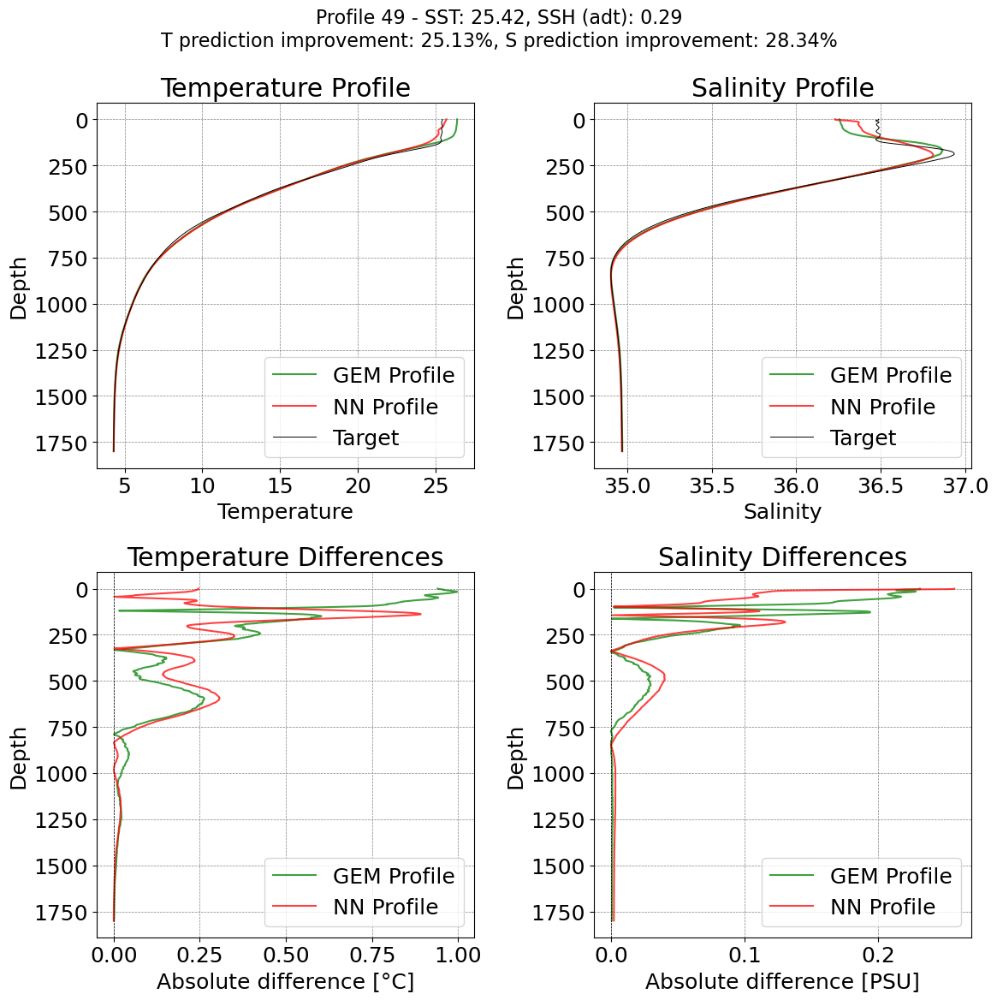

NN Average temperature RMSE: 0.389°C
NN Average salinity RMSE: 0.066 PSU
GEM Average temperature RMSE: 0.572°C
GEM Average salinity RMSE: 0.089 PSU

Number of profiles: 4145
Parameters used: timecos, timesin, latcos, latsin, loncos, lonsin, sat, sst, sss, ssh
Min depth: 0, Max depth: 1800
Number of components used: 15 x2
Batch size: 300
Learning rate: 0.001
Dropout probability: 0.2
Train/test/validation split: 0.7/0.15/0.15
Layer configuration: [512, 512]

Let's investigate how the method compares against vanilla GEM with in-situ SSH


/conda/jmiranda/miniconda/envs/aieoastorch/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/conda/jmiranda/miniconda/envs/aieoastorch/lib/python3.10/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


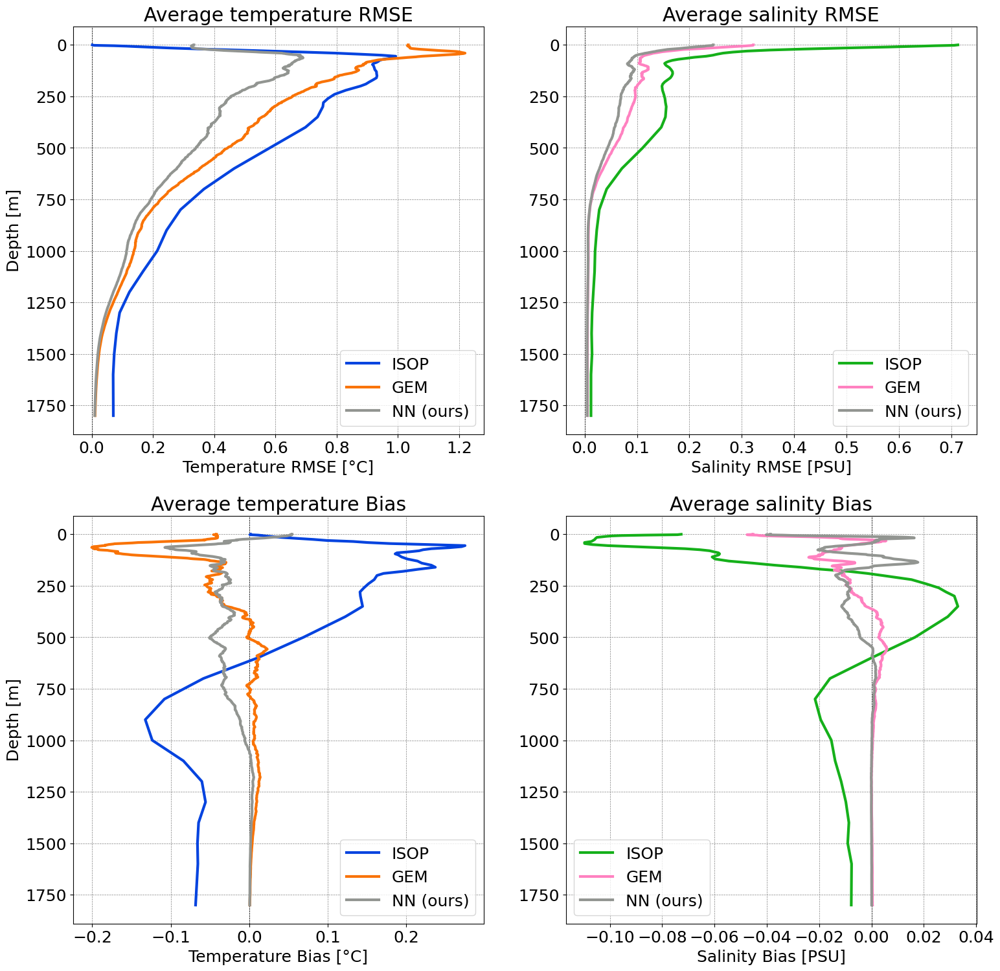

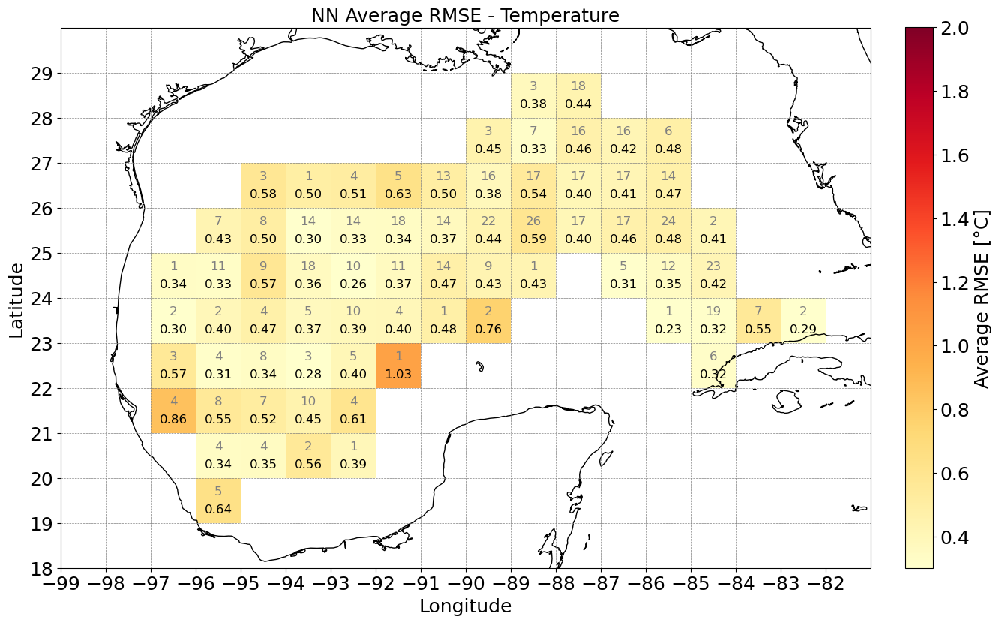

/conda/jmiranda/miniconda/envs/aieoastorch/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/conda/jmiranda/miniconda/envs/aieoastorch/lib/python3.10/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


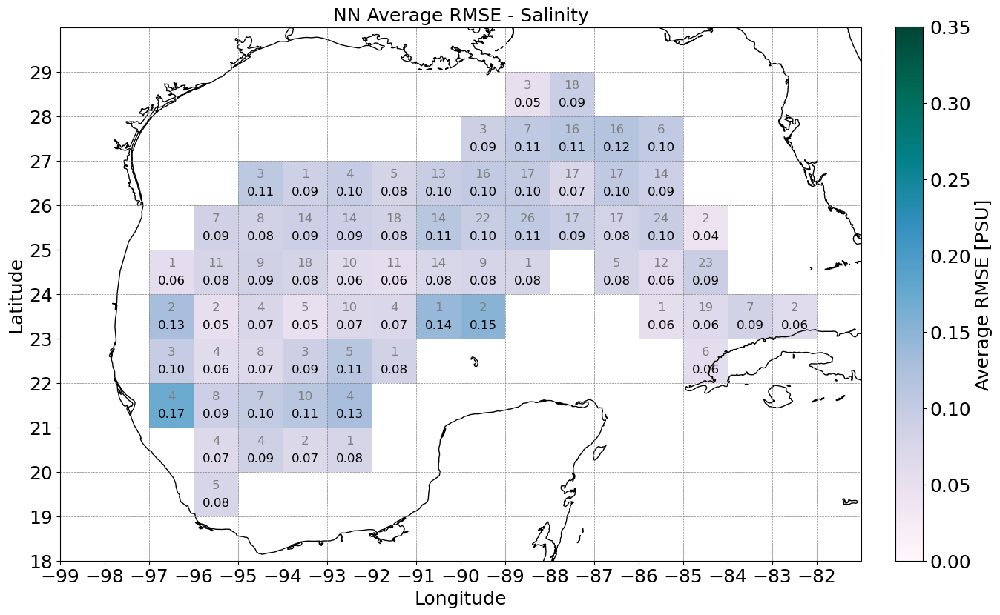

/conda/jmiranda/miniconda/envs/aieoastorch/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/conda/jmiranda/miniconda/envs/aieoastorch/lib/python3.10/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


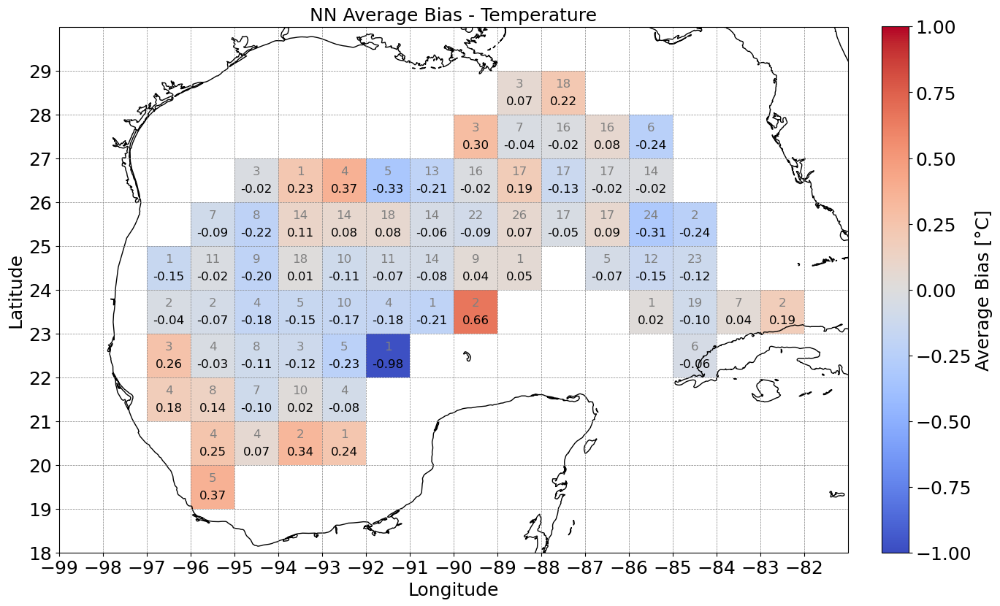

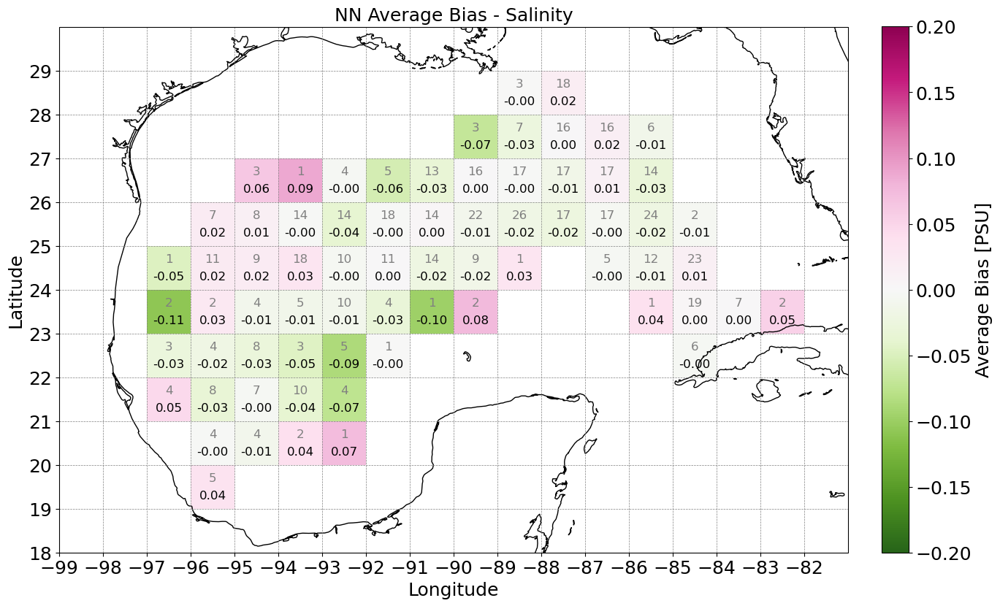

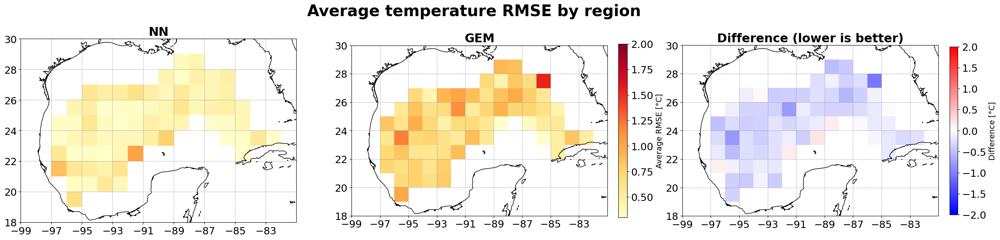

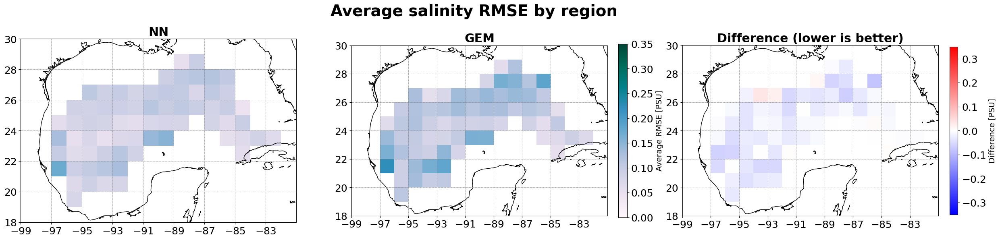

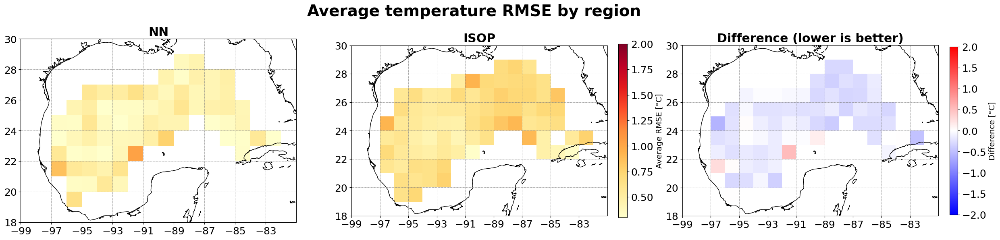

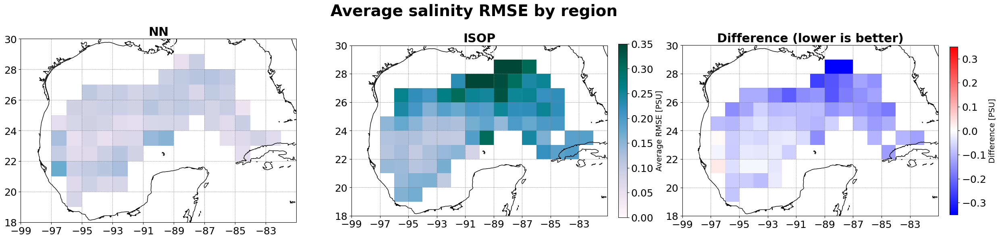

the following are bias plots


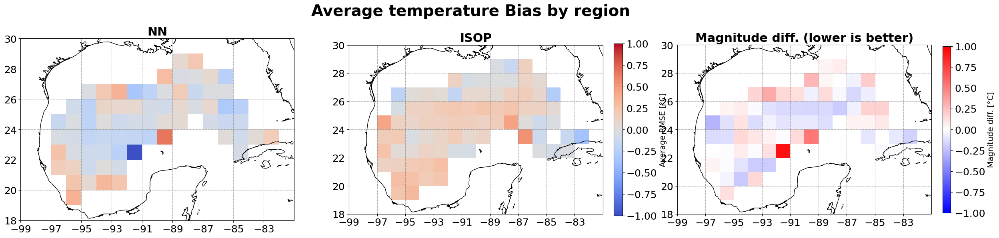

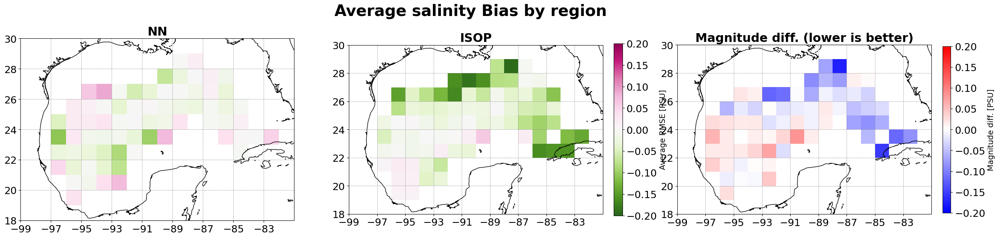

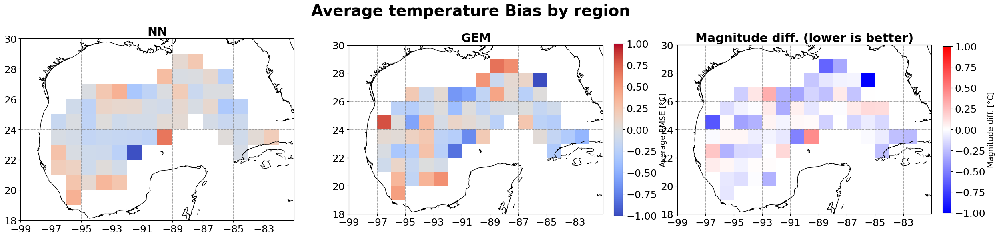

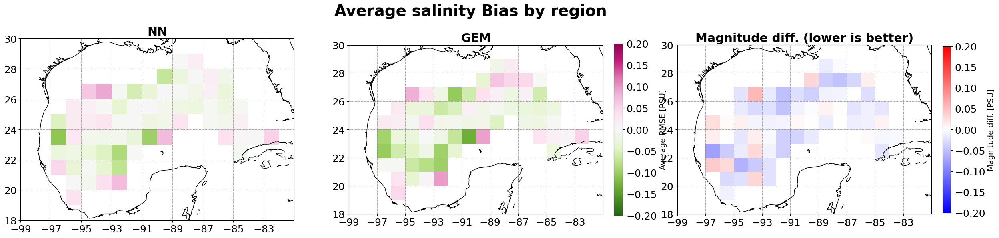

dict_keys(['__header__', '__version__', '__globals__', 'T1', 'S1', 'lon1', 'lat1', 't1', 'T2', 'S2', 'lon2', 'lat2', 't2', 'T3', 'S3', 'lon3', 'lat3', 't3', 'T4', 'S4', 'lon4', 'lat4', 't4', 'T1l', 'S1l', 'T2l', 'S2l', 'T3l', 'S3l', 'T4l', 'S4l', 't1l', 't2l', 't3l', 't4l'])


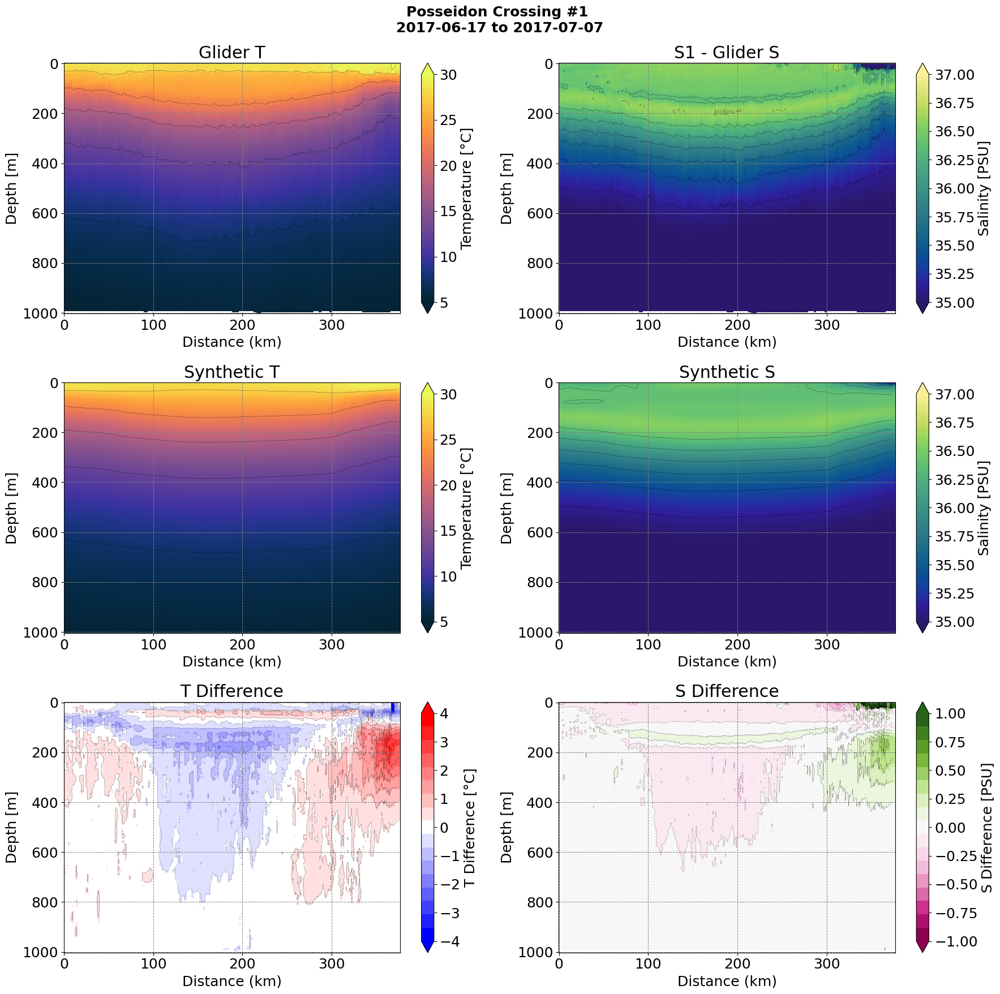

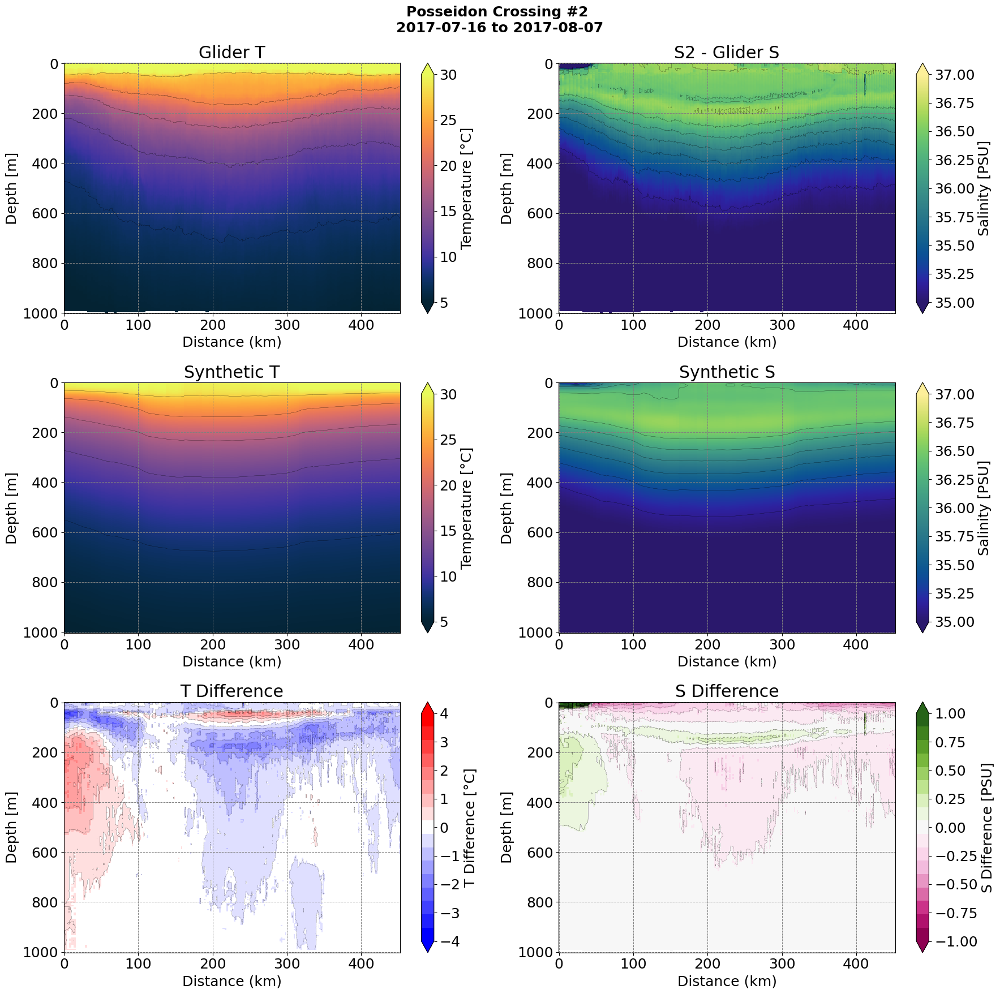

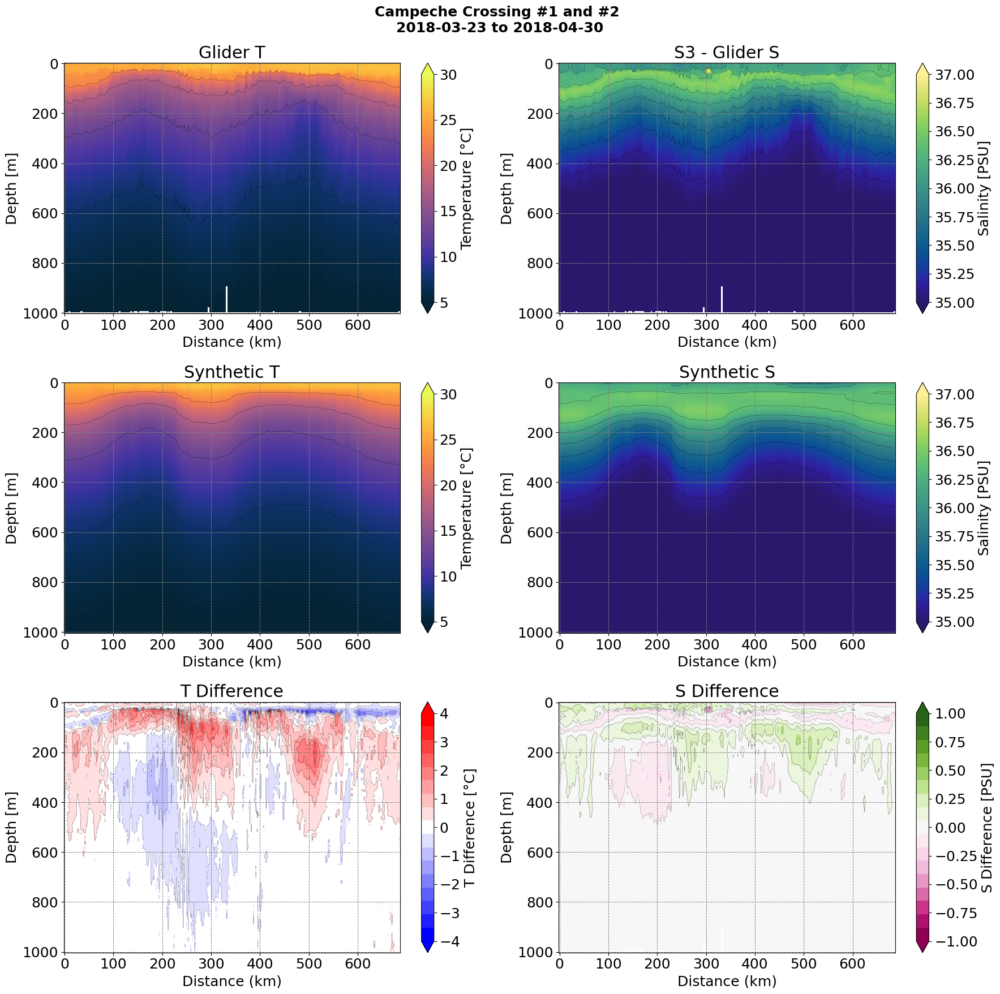

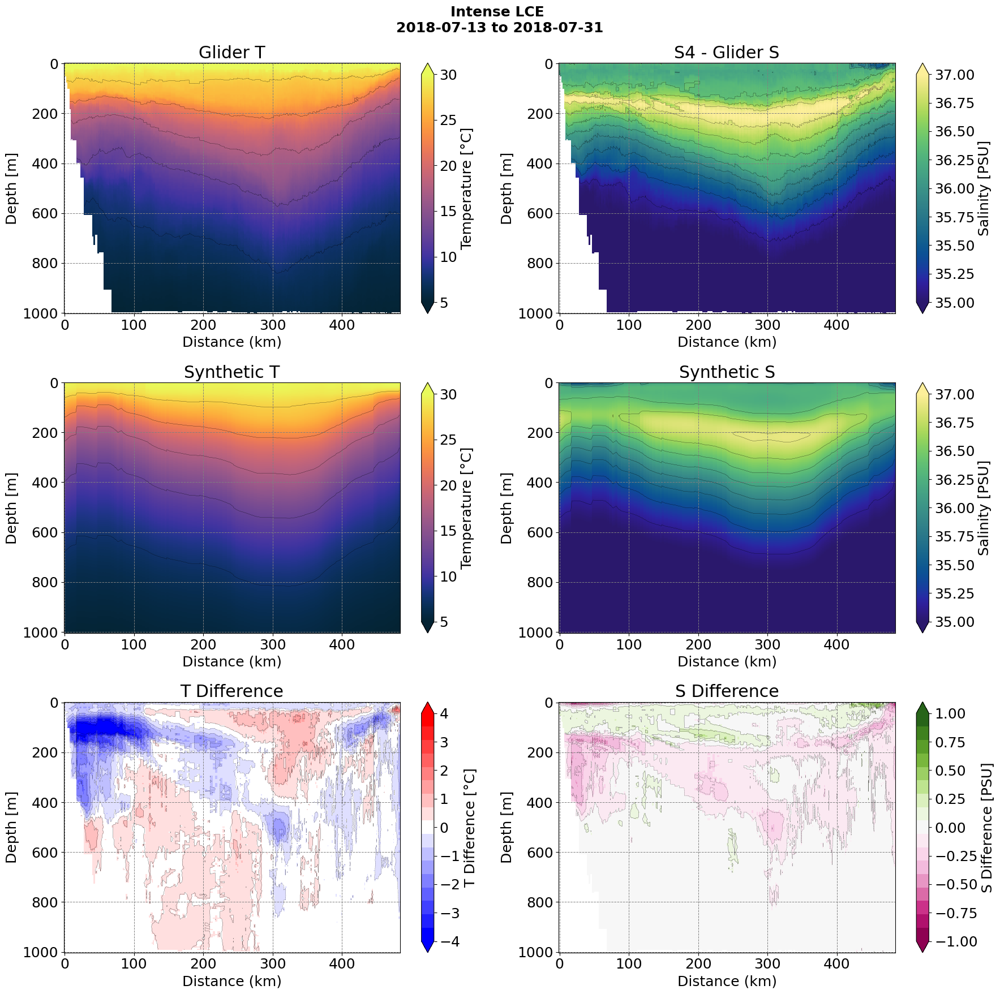

Crossing & T RMSE & T Bias & T R^2 & S RMSE & S Bias & S R^2
Posseidon #1 & 0.586 & 0.031 & 0.996 & 0.118 & -0.011 & 0.982\\
Posseidon #2 & 0.553 & -0.207 & 0.998 & 0.111 & -0.035 & 0.986\\
Campeche #1  & 0.524 & 0.079 & 0.996 & 0.069 & 0.017 & 0.992 \\
Intense LCE  & 0.730 & -0.133 & 0.996 & 0.105 & -0.047 & 0.991 \\


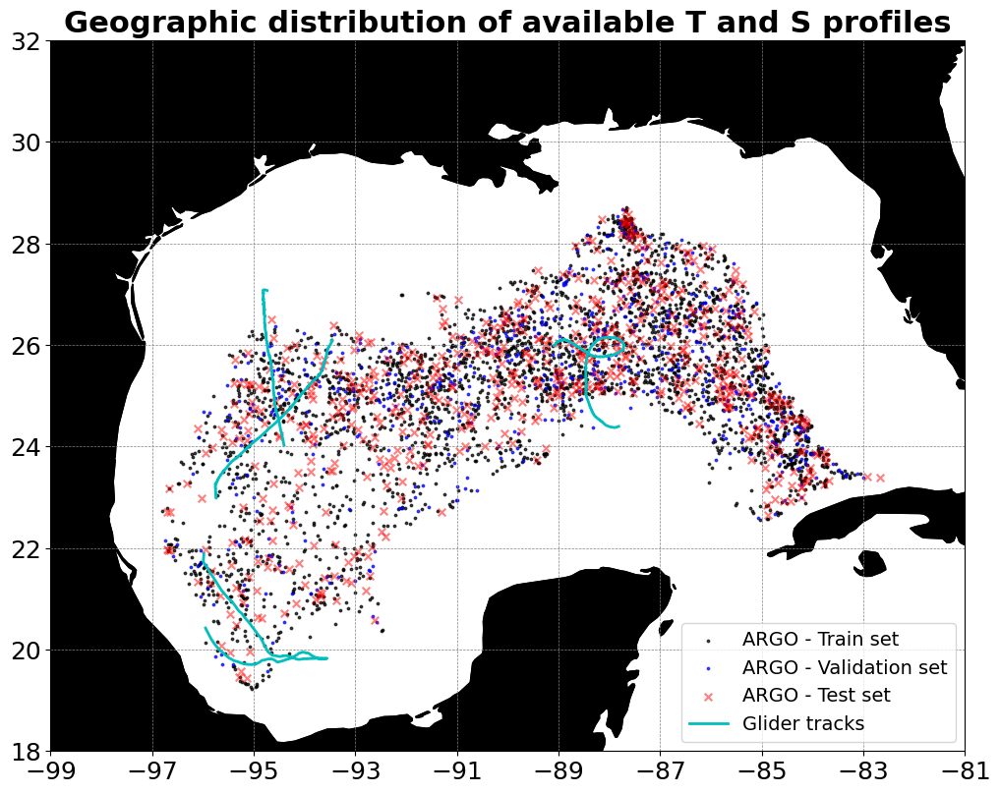

Slope: 0.009160879898569124
Intercept: -0.3499038584558701
Coefficient of determination (R²): 0.9218120649839159
P-value: 0.0
Standard error of the regression estimate: 4.145036894232866e-05


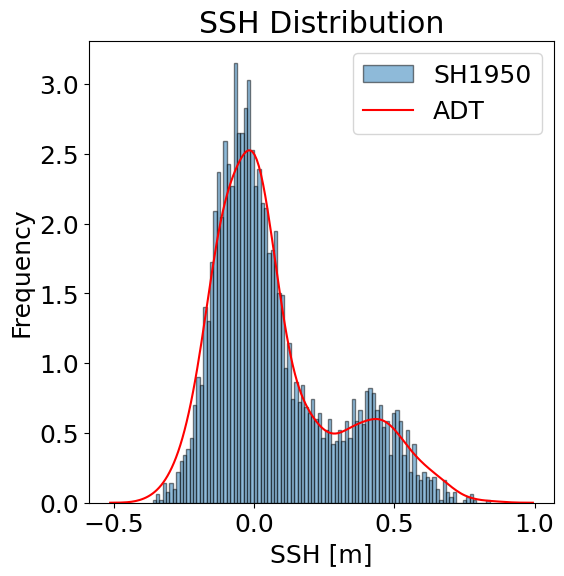

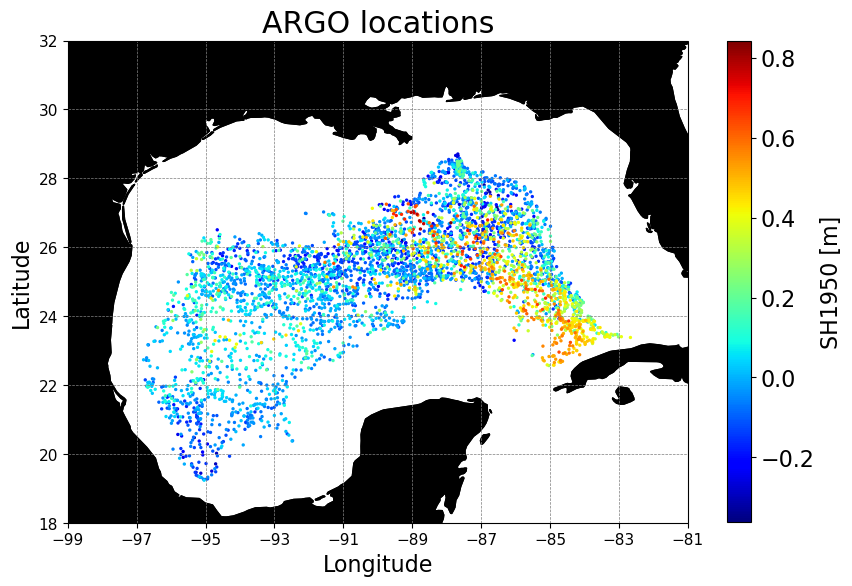

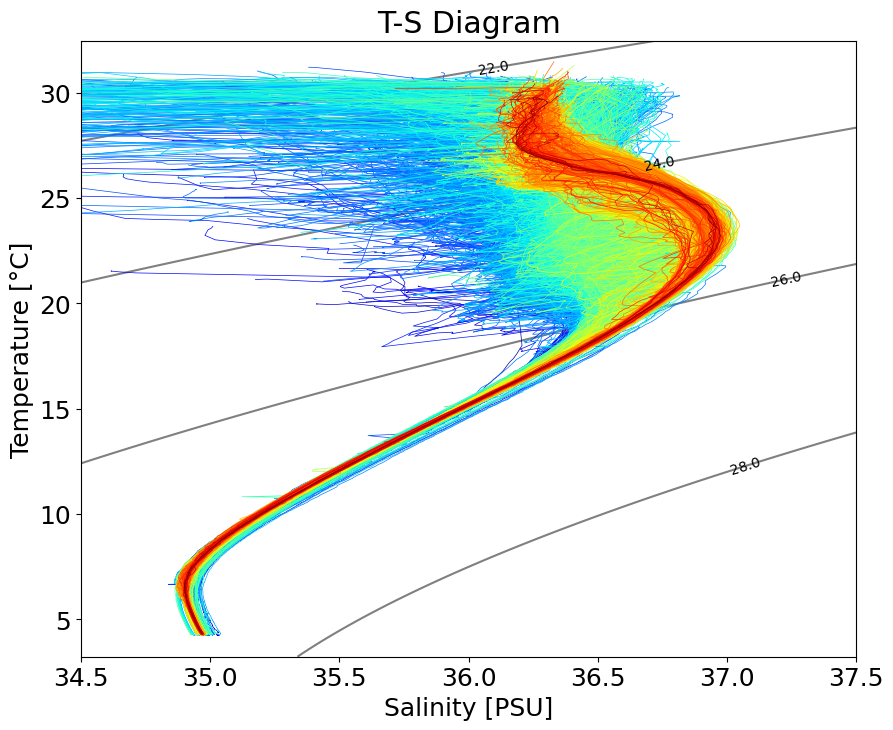

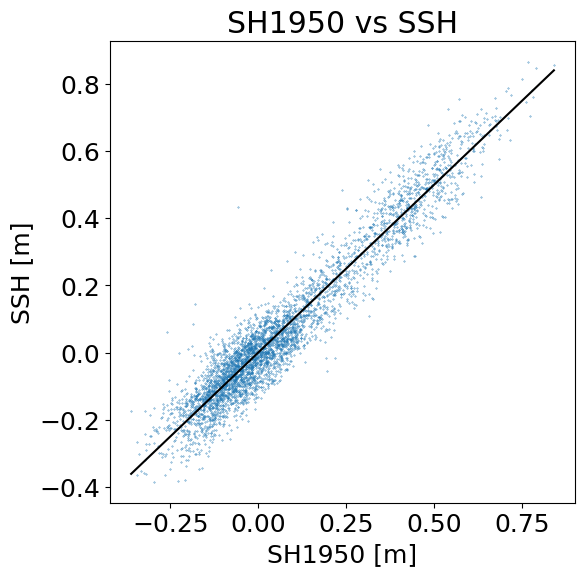

Depth range 	 NN T RMSE 	 GEM T RMSE 	 ISOP T RMSE 	 NN T Bias 	 GEM T Bias 	 ISOP T Bias 	 NN S RMSE 	 GEM S RMSE 	 ISOP S RMSE 	 NN S Bias 	 GEM S Bias 	 ISOP S Bias
[0-20] 	 0.439 	 1.461 	 0.140 	 0.042 	 -0.042 	 0.022 	 0.334 	 0.478 	 0.604 	 -0.018 	 -0.035 	 -0.092 	 0.982 	 0.775 	 0.748 	 0.337
[20-100] 	 0.846 	 1.416 	 0.835 	 -0.058 	 -0.151 	 0.186 	 0.151 	 0.193 	 0.229 	 -0.007 	 -0.010 	 -0.086 	 0.953 	 0.871 	 0.674 	 0.409
[100-200] 	 0.832 	 1.095 	 0.917 	 -0.040 	 -0.058 	 0.203 	 0.119 	 0.165 	 0.160 	 0.000 	 -0.014 	 -0.033 	 0.969 	 0.949 	 0.879 	 0.786
[200-500] 	 0.608 	 0.860 	 0.756 	 -0.034 	 -0.037 	 0.137 	 0.092 	 0.123 	 0.147 	 -0.009 	 -0.005 	 0.023 	 0.985 	 0.970 	 0.984 	 0.971
[500-1000] 	 0.313 	 0.396 	 0.360 	 -0.027 	 0.006 	 -0.057 	 0.034 	 0.046 	 0.049 	 -0.000 	 0.002 	 -0.009 	 0.986 	 0.977 	 0.976 	 0.957
[1000-1800] 	 0.084 	 0.127 	 0.111 	 0.001 	 0.006 	 -0.074 	 0.009 	 0.009 	 0.015 	 0.000 	 0.000 	 -0.010 	 0.972 	 0.94

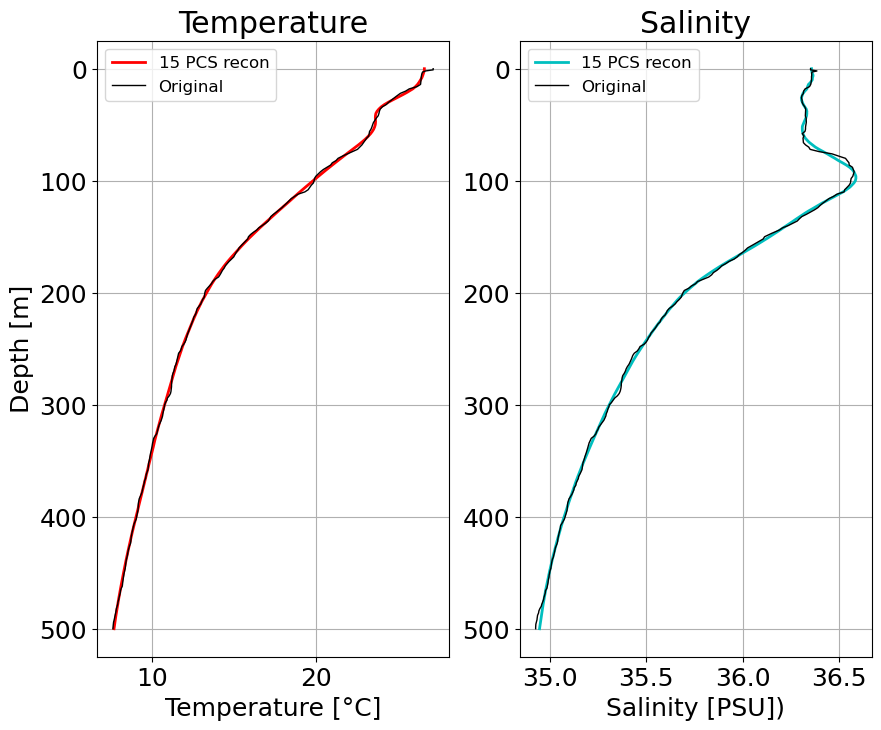

In [2]:
if __name__ == "__main__":
    # Configurable parameters
    
    bin_size = 1 # bin size in degrees
    n_components = 15
    n_runs = 1
    layers_config = [512, 512]
    batch_size = 300
    min_depth = 0
    max_depth = 1800
    dropout_prob = 0.2
    epochs = 8000
    patience = 500
    learning_rate = 0.001
    train_size = 0.7
    val_size = 0.15
    test_size = 0.15
    input_params = {
        "timecos": True,
        "timesin": True,
        "latcos":  True,
        "latsin":  True,
        "loncos":  True,
        "lonsin":  True,
        "sat": True,  # Use satellite data?
        "sst": True,  # First value of temperature if sat = false, OISST if sat = true
        "sss": True,  # similar to above
        "ssh": True   # similar to above
    }
    num_samples = 1 #profiles that will be plotted
    # Define the path of the pickle file
    dataset_pickle_file = '/unity/g2/jmiranda/SubsurfaceFields/GEM_SubsurfaceFields/config_dataset_full.pkl'

    if os.path.exists(dataset_pickle_file):
        # Load data from the pickle file
        with open(dataset_pickle_file, 'rb') as file:
            data = pickle.load(file)
            full_dataset = data['full_dataset']
            full_dataset.n_components = n_components
            full_dataset.min_depth = min_depth
            full_dataset.max_depth = max_depth
            full_dataset.input_params = input_params
            # full_dataset.argo_folder = data_path
            if not load_trained_model:
                full_dataset.reload()
    else:
        # Load and split data
        full_dataset = TemperatureSalinityDataset(n_components=n_components, input_params=input_params, min_depth=min_depth, max_depth=max_depth)

        # Save data to the pickle file
        with open(dataset_pickle_file, 'wb') as file:
            data = {
                'min_depth' : min_depth,
                'max_depth': max_depth,
                'epochs': epochs,
                'patience': patience,
                'n_components': n_components,
                'batch_size': batch_size,
                'learning_rate': learning_rate,
                'dropout_prob': dropout_prob,
                'layers_config': layers_config,
                'input_params': input_params,
                'train_size': train_size,
                'val_size': val_size,
                'test_size': test_size,
                'full_dataset': full_dataset
            }
            pickle.dump(data, file)
            
    train_dataset, val_dataset, test_dataset = split_dataset(full_dataset, train_size, val_size, test_size)

    # Dataloaders
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)
    
    subset_indices = val_loader.dataset.indices
    full_dataset.calc_gem(subset_indices)
    
    # # #If we can, we want to apply the PCA only to the Train and test set
    # train_indices = train_loader.dataset.indices
    # test_indices = test_loader.dataset.indices
    # train_indices.append(test_indices)
    
    # # full_dataset.temp_pcs[:,train_indices], full_dataset.pca_temp = full_dataset._apply_pca(full_dataset.TEMP[:,train_indices], n_components)
    # # full_dataset.sal_pcs[:,train_indices], full_dataset.pca_sal = full_dataset._apply_pca(full_dataset.SAL[:,train_indices], n_components)
    # temp_pcs_new, full_dataset.pca_temp = full_dataset._apply_pca(full_dataset.TEMP[:,train_indices], n_components)
    # sal_pcs_new, full_dataset.pca_sal = full_dataset._apply_pca(full_dataset.SAL[:,train_indices], n_components)
    # full_dataset.temp_pcs[:,train_indices] = temp_pcs_new
    # full_dataset.sal_pcs[:,train_indices] = sal_pcs_new
    # #check if i also need to update the dataloaders
    # print(f"IS THIS ENOUGH??? {train_dataset.dataset.pca_temp == full_dataset.pca_temp}") # YES' 
    # # HOWEVER, in the current implementation, we can't... y.y

    # Compute the input dimension dynamically
    input_dim = sum(val for val in input_params.values()) - 1*input_params['sat']
   
    # Check CUDA availability'
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    
    # Loss function using the variance of the PCA components as weights
    weights = full_dataset.get_pca_variance()
    
    print(f"Explained Variance - T: {(sum(full_dataset.pca_temp.explained_variance_ratio_)*100):.1f}% - S: {(100*sum(full_dataset.pca_sal.explained_variance_ratio_)):.1f}%")
    
    # Set the appropriate loss
    # criterion = genWeightedMSELoss(n_components, device, weights)
    # criterion = PCALoss(temp_pca=train_dataset.dataset, sal_pca=train_dataset.dataset, n_components=n_components)
    # criterion = maxPCALoss(temp_pca=train_dataset.dataset, sal_pca=train_dataset.dataset, n_components=n_components)
    criterion = CombinedPCALoss(temp_pca=train_dataset.dataset, 
                            sal_pca=train_dataset.dataset, 
                            n_components=n_components, 
                            weights=weights, 
                            device=device)
    
    # print parameters and dataset size
    true_params = [param for param, value in input_params.items() if value]
    def printParams():   
        print(f"\nNumber of profiles: {len(full_dataset)}")
        print("Parameters used:", ", ".join(true_params))
        print(f"Min depth: {min_depth}, Max depth: {max_depth}")
        print(f"Number of components used: {n_components} x2")
        print(f"Batch size: {batch_size}")
        print(f"Learning rate: {learning_rate}")
        print(f"Dropout probability: {dropout_prob}")
        print(f'Train/test/validation split: {train_size}/{test_size}/{val_size}')
        print(f"Layer configuration: {layers_config}\n")
    
    printParams()
    
    if load_trained_model:
        model_path = '/unity/g2/jmiranda/SubsurfaceFields/GEM_SubsurfaceFields/saved_models/model_Test Loss: 14.2710_2024-02-26 12:47:18_sat.pth'
        trained_model = torch.load(model_path)
    else:
        for run in enumerate(np.arange(n_runs)):
            print(f"Run {run[0]}/{n_runs}")
            # Model

            model = PredictionModel(input_dim=input_dim, layers_config=layers_config, output_dim=n_components*2, dropout_prob = dropout_prob)
            optimizer = optim.Adam(model.parameters(), lr=learning_rate)
            # Training
            trained_model = train_model(model, train_loader, val_loader, criterion, optimizer, device, epochs, patience)
            
            # Test evaluation
            test_loss = evaluate_model(trained_model, test_loader, criterion, device)
            print(f"Test Loss: {test_loss:.4f}")

            save_model_path = "/unity/g2/jmiranda/SubsurfaceFields/GEM_SubsurfaceFields/saved_models/model_"
            save_model_path += f"Test Loss: {test_loss:.4f}" + "_"
            suffix = ".pth"
            if input_params['sat']:
                suffix = "_sat.pth"
            
            now = datetime.now()
            now_str = now.strftime("%Y-%m-%d %H:%M:%S")
            save_model_path += now_str + suffix
            
            torch.save(trained_model, save_model_path)
            print(f"Saved model to {save_model_path}")
            
    print("Statistics from the last run:")
    
    # Get predictions for the validation dataset
    val_predictions_pcs = get_predictions(trained_model, val_loader, device)
    # Accessing the original dataset for inverse_transform
    val_predictions = val_dataset.dataset.inverse_transform(val_predictions_pcs)
    
    # load ISOP results
    file_path_new = '/unity/g2/jmiranda/SubsurfaceFields/Data/ISOP1_rmse_bias_1deg_maps.nc'
    data_ISOP = xr.open_dataset(file_path_new)

    # Create bins for longitude and latitude
    lon_bins = np.arange(np.min(data_ISOP.lon) - 0.5, np.max(data_ISOP.lon) + 1.5, 1)
    lat_bins = np.arange(np.min(data_ISOP.lat) - 0.5, np.max(data_ISOP.lat) + 1.5, 1)

    # Calculate centers of the bins
    lon_centers = lon_bins + bin_size/2
    lat_centers = lat_bins + bin_size/2

    # Initialize a NaN array for the number of profiles
    num_prof = np.full((len(lat_centers), len(lon_centers)), np.nan)

    # Extracting RMSE data and ensuring it matches the dimensions of the bins
    avg_rmse_isop_t = data_ISOP['t_rmse_syn']
    avg_rmse_isop_s = data_ISOP['s_rmse_syn']
    
    avg_rmse_gdem_t = data_ISOP['t_rmse_gdem']
    avg_rmse_gdem_s = data_ISOP['s_rmse_gdem']
    
    avg_bias_isop_t = data_ISOP['t_bias_syn']
    avg_bias_isop_s = data_ISOP['s_bias_syn']
    
    # # # # # # # # # # # 
    # def viz(): # if you want to visualize the results with just viz(), uncomment this and add a indent to the next lines
    # # # # # # # # # 
    subset_indices = val_loader.dataset.indices

    # For original profiles
    original_profiles = val_dataset.dataset.get_profiles(subset_indices, pca_approx=False)

    # For PCA approximated profiles
    pca_approx_profiles = val_dataset.dataset.get_profiles(subset_indices, pca_approx=True)
    
    pred_T = val_predictions[0]
    pred_S = val_predictions[1]
    orig_T = original_profiles[:, 0, :]
    orig_S = original_profiles[:, 1, :]
    gem_temp, gem_sal = val_dataset.dataset.get_gem_profiles(subset_indices)
    gems_T = gem_temp.T
    gems_S = gem_sal.T
    pred_T_resid = pred_T - orig_T
    pred_S_resid = pred_S - orig_S
    gems_T_resid = gems_T - orig_T
    gems_S_resid = gems_S - orig_S
    
    
    # # calculate average bias and rmse for depth ranges
    # print("Depth range \t NN T RMSE \t GEM T RMSE \t NN T Bias \t GEM T Bias \t NN S RMSE \t GEM S RMSE \t NN S Bias \t GEM S Bias")
    # intervals = [(0, 100), (100, 200), (200, 500), (500, 1000), (1000, max_depth)]    
    
    # for i in range(len(intervals)):
    #     min_d, max_d = intervals[i]
    #     mask = np.arange(min_d, max_d+1)
    #     print(f"[{min_d}-{max_d}] & {np.sqrt(np.mean(pred_T_resid[mask]**2)):0.3f} & {np.sqrt(np.mean(gems_T_resid[mask]**2)):0.3f} & {np.mean(pred_T_resid[mask]):0.4f} & {np.mean(gems_T_resid[mask]):0.4f} & {np.sqrt(np.mean(pred_S_resid[mask]**2)):0.4f} & {np.sqrt(np.mean(gems_S_resid[mask]**2)):0.4f} & {np.mean(pred_S_resid[mask]):0.4f} & {np.mean(gems_S_resid[mask]):0.4f} \\\\")
    #     print("\\hline")
        
    
    # #Load GEM polyfits to benchmark
    # with open("pca_temp.pkl", "wb") as f:
    #     pickle.dump(full_dataset.pca_temp, f)

    # with open("pca_sal.pkl", "wb") as f:
    #     pickle.dump(full_dataset.pca_sal, f)
        
    sst_inputs, ssh_inputs = val_dataset.dataset.get_inputs(subset_indices)
    
    gem_temp, gem_sal = val_dataset.dataset.get_gem_profiles(subset_indices)
    
    lat_val, lon_val, dates_val = val_dataset.dataset.get_lat_lon_date(subset_indices)
    lat_val = np.floor(lat_val)+bin_size/2
    lon_val = np.floor(lon_val)+bin_size/2
    
    visualize_combined_results(pca_approx_profiles, gem_temp, gem_sal, val_predictions, sst_inputs, ssh_inputs, min_depth=min_depth, max_depth = max_depth, num_samples=num_samples)
        
    printParams()
    
    print("Let's investigate how the method compares against vanilla GEM with in-situ SSH")
    
    # RMSE Calculations and Accuracy Gain !!!
    # pred_T_resid
    # pred_S_resid
    # gems_T_resid
    # gems_S_resid
    # gem_temp_errors = (gem_temp.T - original_profiles[:, 0, :]) ** 2
    # gem_sal_errors = (gem_sal.T - original_profiles[:, 1, :]) ** 2

    # nn_temp_errors = (val_predictions[0][:, :] - original_profiles[:, 0, :]) ** 2
    # nn_sal_errors = (val_predictions[1][:, :] - original_profiles[:, 1, :]) ** 2

    gem_temp_rmse = np.sqrt(gems_T_resid**2)
    gem_sal_rmse = np.sqrt(gems_S_resid**2)

    nn_temp_rmse = np.sqrt(pred_T_resid**2)
    nn_sal_rmse = np.sqrt(pred_S_resid**2)
    
    # plot_relative_errors(original_profiles, gem_temp, gem_sal, val_predictions, min_depth=min_depth, max_depth = 1800)
    
    # !!! remaking rmse and bias plots !!!

    ist = xr.open_dataset('/unity/g2/jmiranda/SubsurfaceFields/Data/isop1_stats_temp.nc')
    iss = xr.open_dataset('/unity/g2/jmiranda/SubsurfaceFields/Data/isop1_stats_salt.nc')

    our_depths = np.arange(0,1801)
    isop_depths = ist.depth.values
    avg_gem_temp_rmse = np.mean(gem_temp_rmse, axis = 1)
    gem_temp_rmse_mad = mad(gem_temp_rmse)
    avg_nn_temp_rmse = np.mean(nn_temp_rmse, axis = 1)
    nn_temp_rmse_mad = mad(nn_temp_rmse)

    avg_gem_sal_rmse = np.mean(gem_sal_rmse, axis = 1)
    gem_sal_rmse_mad = mad(gem_sal_rmse)
    avg_nn_sal_rmse = np.mean(nn_sal_rmse, axis = 1)
    nn_sal_rmse_mad = mad(nn_sal_rmse)

    avg_gem_temp_bias = np.mean(gems_T_resid, axis = 1)
    gem_temp_bias_mad = mad(gems_T_resid)
    avg_nn_temp_bias = np.mean(pred_T_resid, axis = 1)
    nn_temp_bias_mad = mad(pred_T_resid)

    avg_gem_sal_bias = np.mean(gems_S_resid, axis = 1)
    gem_sal_bias_mad = mad(gems_S_resid)
    avg_nn_sal_bias = np.mean(pred_S_resid, axis = 1)
    nn_sal_bias_mad = mad(pred_S_resid)

    fig = plt.figure(figsize=(18,18))
    ax = fig.add_subplot(2,2,1)
    ax.axvline(0, color='k', linestyle='--', linewidth=0.5)
    ax.grid(color='gray', linestyle='--', linewidth=0.5)
    #     axs[0,0].fill_betweenx(depth_levels, nn_temp_rmse_depth - nn_temp_std_depth, nn_temp_rmse_depth + nn_temp_std_depth, color='xkcd:dark red', alpha=0.1, label='Avg T RMSE ± 1 std: NN')
    plt.plot(ist.rmse.values, ist.depth.values, linewidth = 3, label = 'ISOP', color='xkcd:blue')
    # ax.fill_betweenx(ist.depth.values, ist.rmse.values - ist.mad.values, ist.rmse.values + ist.mad.values, color='xkcd:blue', alpha=0.1, label='± mad')
    plt.plot(np.mean(gem_temp_rmse, axis = 1), np.arange(0,1801), linewidth = 3, label = 'GEM', color='xkcd:orange')
    # ax.fill_betweenx(our_depths, avg_gem_temp_rmse - gem_temp_rmse_mad, avg_gem_temp_rmse + gem_temp_rmse_mad, color='xkcd:orange', alpha=0.1, label='± mad')
    plt.plot(np.mean(nn_temp_rmse, axis = 1), np.arange(0,1801), linewidth = 3, label = 'NN (ours)', color='xkcd:gray')
    # ax.fill_betweenx(our_depths, avg_nn_temp_rmse - nn_temp_rmse_mad, avg_nn_temp_rmse + nn_temp_rmse_mad, color='xkcd:gray', alpha=0.1, label='± mad')
    ax.invert_yaxis()
    plt.legend()
    plt.xlabel("Temperature RMSE [°C]")
    plt.ylabel("Depth [m]")
    plt.title("Average temperature RMSE")

    ax = fig.add_subplot(2,2,2)
    ax.axvline(0, color='k', linestyle='--', linewidth=0.5)
    ax.grid(color='gray', linestyle='--', linewidth=0.5)
    plt.plot(iss.rmse.values, iss.depth.values, linewidth = 3, label = 'ISOP', color='xkcd:green')
    # ax.fill_betweenx(iss.depth.values, iss.rmse.values - iss.mad.values, iss.rmse.values + iss.mad.values, color='xkcd:green', alpha=0.1, label='± mad')
    plt.plot(np.mean(gem_sal_rmse, axis = 1), np.arange(0,1801), linewidth = 3, label = 'GEM', color='xkcd:pink')
    # ax.fill_betweenx(our_depths, avg_gem_sal_rmse - gem_sal_rmse_mad, avg_gem_sal_rmse + gem_sal_rmse_mad, color='xkcd:pink', alpha=0.1, label='± mad')
    plt.plot(np.mean(nn_sal_rmse, axis = 1), np.arange(0,1801), linewidth = 3, label = 'NN (ours)', color='xkcd:gray')
    # ax.fill_betweenx(our_depths, avg_nn_sal_rmse - nn_sal_rmse_mad, avg_nn_sal_rmse + nn_sal_rmse_mad, color='xkcd:gray', alpha=0.1, label='± mad')
    ax.invert_yaxis()
    plt.legend()
    plt.xlabel("Salinity RMSE [PSU]")
    plt.title("Average salinity RMSE")

    ax = fig.add_subplot(2,2,3)
    ax.axvline(0, color='k', linestyle='--', linewidth=0.5)
    ax.grid(color='gray', linestyle='--', linewidth=0.5)
    plt.plot(ist.bias.values, ist.depth.values, linewidth = 3, label = 'ISOP', color='xkcd:blue')
    # ax.fill_betweenx(ist.depth.values, ist.bias.values - ist.mad.values, ist.bias.values + ist.mad.values, color='xkcd:blue', alpha=0.1, label='± mad')
    plt.plot(np.mean(gems_T_resid, axis = 1), np.arange(0,1801), linewidth = 3, label = 'GEM', color='xkcd:orange')
    # ax.fill_betweenx(our_depths, avg_gem_temp_bias - gem_temp_bias_mad, avg_gem_temp_bias + gem_temp_bias_mad, color='xkcd:orange', alpha=0.1, label='± mad')
    plt.plot(np.mean(pred_T_resid, axis = 1), np.arange(0,1801), linewidth = 3, label = 'NN (ours)', color='xkcd:gray')
    # ax.fill_betweenx(our_depths, avg_nn_temp_bias - nn_temp_bias_mad, avg_nn_temp_bias + nn_temp_bias_mad, color='xkcd:gray', alpha=0.1, label='± mad')
    ax.invert_yaxis()
    plt.legend()
    plt.xlabel("Temperature Bias [°C]")
    plt.ylabel("Depth [m]")
    plt.title("Average temperature Bias")

    ax = fig.add_subplot(2,2,4)
    ax.axvline(0, color='k', linestyle='--', linewidth=0.5)
    ax.grid(color='gray', linestyle='--', linewidth=0.5)
    plt.plot(iss.bias.values, iss.depth.values, linewidth = 3, label = 'ISOP', color='xkcd:green')
    # ax.fill_betweenx(iss.depth.values, iss.bias.values - iss.mad.values, iss.bias.values + iss.mad.values, color='xkcd:green', alpha=0.1, label='± mad')
    plt.plot(np.mean(gems_S_resid, axis = 1), np.arange(0,1801), linewidth = 3, label = 'GEM', color='xkcd:pink')
    # ax.fill_betweenx(our_depths, avg_gem_sal_bias - gem_sal_bias_mad, avg_gem_sal_bias + gem_sal_bias_mad, color='xkcd:pink', alpha=0.1, label='± mad')
    plt.plot(np.mean(pred_S_resid, axis = 1), np.arange(0,1801), linewidth = 3, label = 'NN (ours)', color='xkcd:gray')
    # ax.fill_betweenx(our_depths, avg_nn_sal_bias - nn_sal_bias_mad, avg_nn_sal_bias + nn_sal_bias_mad, color='xkcd:gray', alpha=0.1, label='± mad')
    ax.invert_yaxis()
    plt.legend()
    plt.xlabel("Salinity Bias [PSU]")
    plt.title("Average salinity Bias")

#     # Temperature RMSE
#     axs[0,0].plot(nn_temp_rmse_depth, depth_levels, 'xkcd:dark red', linestyle='-', linewidth = 2.5, label='Avg T RMSE: NN')
#     axs[0,0].fill_betweenx(depth_levels, nn_temp_rmse_depth - nn_temp_std_depth, nn_temp_rmse_depth + nn_temp_std_depth, color='xkcd:dark red', alpha=0.1, label='Avg T RMSE ± 1 std: NN')
#     axs[0,0].plot(gem_temp_rmse_depth, depth_levels, 'xkcd:blue', linestyle='-', linewidth = 2.5, label='Avg T RMSE: GEM')
#     axs[0,0].fill_betweenx(depth_levels, gem_temp_rmse_depth - gem_temp_std_depth, gem_temp_rmse_depth + gem_temp_std_depth, color='xkcd:blue', alpha=0.1, label='Avg T RMSE ± 1 std: GEM')
#     axs[0,0].invert_yaxis()
#     axs[0,0].legend(loc='lower right', fontsize=14)
#     axs[0,0].set_title("Temperature RMSE by Depth", fontsize=24)
#     axs[0,0].set_ylabel("Depth")
#     axs[0,0].set_xlabel("RMSE")
#     #grid on
    
    # Heatmaps of the RMSE
    # dpt_range = np.arange(0,201)
    dpt_range = isop_depths[isop_depths<=1800].astype(int)

    # Calculate average temperature RMSE for NN and GEM !
    avg_temp_rmse_nn, num_prof_nn = calculate_average_rmse_per_bin(lon_centers, lat_centers, lon_val, lat_val, nn_temp_rmse, dpt_range)  # Replace nn_rmse with your RMSE values for NN
    avg_temp_rmse_gem, num_prof_gem = calculate_average_rmse_per_bin(lon_centers, lat_centers, lon_val, lat_val, gem_temp_rmse, dpt_range)  # Replace gem_rmse with your RMSE values for GEM
    avg_temp_rmse_gain = avg_temp_rmse_nn - avg_temp_rmse_gem

    plot_rmse_maps(lon_bins, lat_bins, avg_temp_rmse_nn, num_prof_nn, "Temperature", "RMSE")
    
    #now let's do the same for salinity
    # Calculate average temperature RMSE for NN and GEM
    avg_sal_rmse_nn, num_prof_nn = calculate_average_rmse_per_bin(lon_centers, lat_centers, lon_val, lat_val, nn_sal_rmse, dpt_range)  # Replace nn_rmse with your RMSE values for NN
    avg_sal_rmse_gem, num_prof_gem = calculate_average_rmse_per_bin(lon_centers, lat_centers, lon_val, lat_val, gem_sal_rmse, dpt_range)  # Replace gem_rmse with your RMSE values for GEM
    avg_sal_rmse_gain = avg_sal_rmse_nn - avg_sal_rmse_gem


    plot_rmse_maps(lon_bins, lat_bins, avg_sal_rmse_nn, num_prof_nn, "Salinity", "RMSE")
    
    # same maps, but bias    
    # Calculate average temperature bias for NN, GEM and ISOP
    # nn_t_bias = np.mean(val_predictions[0][:, :] - original_profiles[:, 0, :], axis = 0)
    # nn_s_bias = np.mean(val_predictions[1][:, :] - original_profiles[:, 1, :], axis = 0)
    # gem_t_bias = np.mean(gem_temp.T - original_profiles[:, 0, :], axis = 0)
    # gem_s_bias = np.mean(gem_sal.T - original_profiles[:, 1, :], axis = 0)
    
    avg_nn_t_bias, num_prof_nn = calculate_average_rmse_per_bin(  lon_centers, lat_centers, lon_val, lat_val, pred_T_resid, dpt_range)
    avg_nn_s_bias, num_prof_nn = calculate_average_rmse_per_bin(  lon_centers, lat_centers, lon_val, lat_val, pred_S_resid, dpt_range)
    avg_gem_t_bias, num_prof_gem = calculate_average_rmse_per_bin(lon_centers, lat_centers, lon_val, lat_val, gems_T_resid, dpt_range)
    avg_gem_s_bias, num_prof_gem = calculate_average_rmse_per_bin(lon_centers, lat_centers, lon_val, lat_val, gems_S_resid, dpt_range)
    
    #TODO: fix the bias color scale (negative values are not being shown properly)
    plot_rmse_maps(lon_bins, lat_bins, avg_nn_t_bias, num_prof_nn, "Temperature", "Bias")
    plot_rmse_maps(lon_bins, lat_bins, avg_nn_s_bias, num_prof_nn, "Salinity", "Bias")
    
    
    # Create an empty array for the difference with the same shape as the ISOP data
    # avg_rmse_nn_t = np.full(avg_rmse_isop_t.shape, np.nan)
    # avg_rmse_nn_s = np.full(avg_rmse_isop_s.shape, np.nan)
    # avg_bias_nn_t = np.full(avg_rmse_isop_t.shape, np.nan)
    # avg_bias_nn_s = np.full(avg_rmse_isop_s.shape, np.nan)
    # avg_rmse_gem_t = np.full(avg_rmse_isop_t.shape, np.nan)
    # avg_rmse_gem_s = np.full(avg_rmse_isop_s.shape, np.nan)
    # avg_bias_gem_t = np.full(avg_rmse_isop_t.shape, np.nan)
    # avg_bias_gem_s = np.full(avg_rmse_isop_s.shape, np.nan)

    # tolerance = 1e-12  # A small tolerance value for floating-point comparison

    # # Iterate over each cell in the ISOP data
    # for i, lat in enumerate(lat_centers - 0.5):
    #     for j, lon in enumerate(lon_centers - 0.5):
    #         # Find the corresponding cell in the NN data
    #         nn_lat_idx = np.argmin(np.abs(lat - lat_bins))
    #         nn_lon_idx = np.argmin(np.abs(lon - lon_bins))

    #         # Assign values to corresponding cells using a tolerance for comparison
    #         if np.abs(lat - lat_bins[nn_lat_idx]) < tolerance and np.abs(lon - lon_bins[nn_lon_idx]) < tolerance:
    #             if nn_lat_idx < avg_temp_rmse_nn.shape[0] and nn_lon_idx < avg_temp_rmse_nn.shape[1]:
    #                 avg_rmse_nn_t[i, j] = avg_temp_rmse_nn[nn_lat_idx, nn_lon_idx]
    #                 avg_rmse_gem_t[i, j] = avg_temp_rmse_gem[nn_lat_idx, nn_lon_idx]
    #                 avg_bias_gem_t[i, j] = avg_gem_t_bias[nn_lat_idx, nn_lon_idx]
    #                 avg_bias_nn_t[i, j] = avg_nn_t_bias[nn_lat_idx, nn_lon_idx]
    #             if nn_lat_idx < avg_sal_rmse_nn.shape[0] and nn_lon_idx < avg_sal_rmse_nn.shape[1]:
    #                 avg_rmse_nn_s[i, j] = avg_sal_rmse_nn[nn_lat_idx, nn_lon_idx]             
    #                 avg_rmse_gem_s[i, j] = avg_sal_rmse_gem[nn_lat_idx, nn_lon_idx]
    #                 avg_bias_gem_s[i, j] = avg_gem_s_bias[nn_lat_idx, nn_lon_idx]
    #                 avg_bias_nn_s[i, j] = avg_nn_s_bias[nn_lat_idx, nn_lon_idx]
    
    avg_rmse_nn_t  = avg_temp_rmse_nn
    avg_rmse_nn_s  = avg_sal_rmse_nn
    avg_bias_nn_t  = avg_nn_t_bias
    avg_bias_nn_s  = avg_nn_s_bias
    avg_rmse_gem_t = avg_temp_rmse_gem
    avg_rmse_gem_s = avg_sal_rmse_gem
    avg_bias_gem_t = avg_gem_t_bias
    avg_bias_gem_s = avg_gem_s_bias
    
    lon_centr = lon_centers[:-1]
    lat_centr = lat_centers[:-1]
        
    #GEM
    plot_comparison_maps(lon_centr, lat_centr, avg_rmse_nn_t, avg_rmse_gem_t, "temperature", "GEM")
    plot_comparison_maps(lon_centr, lat_centr, avg_rmse_nn_s, avg_rmse_gem_s, "salinity", "GEM")
    
    #ISOP
    plot_comparison_maps(lon_centr, lat_centr, avg_rmse_nn_t, avg_rmse_isop_t, "temperature", "ISOP")
    plot_comparison_maps(lon_centr, lat_centr, avg_rmse_nn_s, avg_rmse_isop_s, "salinity", "ISOP")
    
    print("the following are bias plots")
    plot_comparison_maps(lon_centr, lat_centr, avg_bias_nn_t, avg_bias_isop_t, "temperature", "ISOP", "Bias")
    plot_comparison_maps(lon_centr, lat_centr, avg_bias_nn_s, avg_bias_isop_s, "salinity", "ISOP", "Bias")
    
    plot_comparison_maps(lon_centr, lat_centr, avg_bias_nn_t, avg_bias_gem_t, "temperature", "GEM", "Bias")
    plot_comparison_maps(lon_centr, lat_centr, avg_bias_nn_s, avg_bias_gem_s, "salinity", "GEM", "Bias")
    
    
    # #GDEM
    # plot_comparison_maps(lon_centers, lat_centers, avg_rmse_nn_t, avg_rmse_gdem_t, "temperature", "GDEM")
    # plot_comparison_maps(lon_centers, lat_centers, avg_rmse_nn_s, avg_rmse_gdem_s, "salinity", "GDEM")
    
    # Residual calculations
    nn_temp_residuals = val_predictions[0][:, :] - original_profiles[:, 0, :]
    nn_sal_residuals = val_predictions[1][:, :] - original_profiles[:, 1, :]
    
    # print(f'shape of residuals is: {len(nn_temp_residuals)} - {nn_temp_residuals[0].shape}')

    # Call the plot function for temperature residuals
    # plot_residual_profiles_for_top_bins(lon_bins, lat_bins, lon_val, lat_val, nn_temp_residuals, avg_temp_rmse_nn, num_prof_nn, 'Temperature', min_depth=min_depth, max_depth=max_depth, top_n=9)

    # # Call the plot function for salinity residuals
    # plot_residual_profiles_for_top_bins(lon_bins, lat_bins, lon_val, lat_val, nn_sal_residuals, avg_sal_rmse_nn, num_prof_nn, 'Salinity', min_depth=min_depth, max_depth=max_depth, top_n=9)
    
    # viz() uncomment this and add a indent to the previous lines to visualize the results with viz()
    if gen_paula_profiles:
        def prepare_inputs_paula(data, input_params):
            """
            Transforms the data from the pickle file into the format expected by the model.

            Args:
            - data (dict): Data loaded from the pickle file.
            - input_params (dict): Dictionary indicating which features to include.

            Returns:
            - torch.Tensor: Tensor of transformed input data.
            """
            num_samples = len(data['time'])  # Assuming all arrays in 'data' have the same length
            inputs = []

            # Iterate over each sample and create input features
            for i in range(num_samples):
                sample_inputs = []
                
                if input_params.get("timecos", False):
                    sample_inputs.append(np.cos(2 * np.pi * (data['time'][i] % 365) / 365))
                
                if input_params.get("timesin", False):
                    sample_inputs.append(np.sin(2 * np.pi * (data['time'][i] % 365) / 365))
                
                if input_params.get("latcos", False):
                    sample_inputs.append(np.cos(2 * np.pi * (data['lat'][i] / 180)))
                
                if input_params.get("latsin", False):
                    sample_inputs.append(np.sin(2 * np.pi * (data['lat'][i] / 180)))
                
                if input_params.get("loncos", False):
                    sample_inputs.append(np.cos(2 * np.pi * (data['lon'][i] / 360)))
                
                if input_params.get("lonsin", False):
                    sample_inputs.append(np.sin(2 * np.pi * (data['lon'][i] / 360)))

                if input_params.get("sat", False):
                    if input_params.get("sss", False):
                        sample_inputs.append(data['sss'][i])
                    if input_params.get("sst", False):
                        sample_inputs.append(data['sst'][i])
                    if input_params.get("ssh", False):
                        sample_inputs.append(data['ssh'][i])
                        
                # Convert the list of inputs for this sample to a tensor and add to the main list
                inputs.append(torch.tensor(sample_inputs, dtype=torch.float32))

            # Convert the list of tensors to a single tensor
            inputs_tensor = torch.stack(inputs)

            return inputs_tensor
        
        # Load data from pickle file
        with open('/unity/g2/jmiranda/SubsurfaceFields/GEM_SubsurfaceFields/paula_inputs.pkl', 'rb') as file:
            data_paula = pickle.load(file)
            
        # Prepare the inputs
        inputs_tensor = prepare_inputs_paula(data_paula, input_params)
        # Move the inputs tensor to the same device as the model
        inputs_tensor = inputs_tensor.to(device)

        # Get predictions
        model.eval()
        with torch.no_grad():
            paula_predictions_pcs = model(inputs_tensor)
            paula_predictions_pcs_cpu = paula_predictions_pcs.cpu().numpy()
            paula_predictions = val_dataset.dataset.inverse_transform(paula_predictions_pcs_cpu)
        
        # Specify the filename to save to
        filename = '/unity/g2/jmiranda/SubsurfaceFields/GEM_SubsurfaceFields/paula_predictions_20140130_sst_sss.pkl'

        # Open the file in write mode and save the dictionary
        with open(filename, 'wb') as file:
            pickle.dump(paula_predictions, file)

        print(f"Data has been saved to {filename}")
    
    # # use the entire dataset
    
    # # Entire dataset:
    # print("Now let's see how it performs on the entire dataset")
    # val_predictions_bkp = val_predictions
    # val_dataset_bkp = val_dataset
    # val_predictions_pcs_bkp = val_predictions_pcs
    # val_loader_bkp = val_loader
    
    # # Get predictions for the entire dataset
    # train_dataset_0, val_dataset, test_dataset_0 = split_dataset(full_dataset, 0, 1, 0)
    # val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
    # val_predictions_pcs = get_predictions(trained_model, val_loader, device)
    # val_predictions = val_dataset.dataset.inverse_transform(val_predictions_pcs)
    
    # viz()
    
    # if n_runs > 1:
    #     #load and aggregate all models
    #     model_directory = "/unity/g2/jmiranda/SubsurfaceFields/GEM_SubsurfaceFields/saved_models/"
    #     if not input_params['sat']:
    #         suffix = "_sat.pth"
    #         model_files = [f for f in os.listdir(model_directory) if not f.endswith(suffix)]
    #     else:
    #         model_files = [f for f in os.listdir(model_directory) if f.endswith(suffix)]
            
    #     models = []
    #     for file in model_files:
    #         model_path = os.path.join(model_directory, file)
    #         model = torch.load(model_path)
    #         models.append(model)

    #     # Collect predictions from all models
    #     ensemble_temp_val_predictions = np.zeros_like(val_predictions[0])
    #     ensemble_sal_val_predictions = np.zeros_like(val_predictions[1])
    #     ct = 0
    #     for model in models:
    #         predictions_pcs = get_predictions(model, val_loader, device)
    #         predictions = val_dataset.dataset.inverse_transform(predictions_pcs)        
    #         ensemble_temp_val_predictions += predictions[0]
    #         ensemble_sal_val_predictions += predictions[1]
    #         ct += 1

    #     # Averaging the predictions
    #     ensemble_temp_val_predictions /= ct
    #     ensemble_sal_val_predictions /= ct

    #     val_predictions = (ensemble_temp_val_predictions, ensemble_sal_val_predictions)
        
    #     viz()

    # GLIDER: Load the MATLAB file
    file_path = '/unity/g2/jmiranda/SubsurfaceFields/Data/Glider_binned_data_for_heat_content_IA_mission_lowpass_LCE_Campeche_cyclone.mat'
    gl_data = scipy.io.loadmat(file_path)

    # Display the keys to understand the structure of the data
    print(gl_data.keys())

    # Variable	Shape   	nan_min	    nan_max	    nan_avg	    nan_count
    # T1	    (201,240)	5.043881	40.509893	12.093195	387
    # S1	    (201,240)	32.740974	36.657226	35.476389	387
    # lon1	    (1,	240)	-94.817717	-94.405167	-94.690244	0
    # lat1	    (1,	240)	24.02255	27.0873	    25.840945	0
    # t1	    (1,	240)	736863.0151	736883.0033	736873.3337	0
    # T2	    (201,238)	4.708326	32.524226	12.129467	426
    # S2	    (201,238)	30.45545	36.783535	35.478705	426
    # lon2	    (1,	238)	-95.757333	-93.456633	-94.694365	0
    # lat2	    (1,	238)	22.9795	    26.09425	24.404746	0
    # t2	    (1,	238)	736892.9703	736914.0272	736902.8855	0
    # T3	    (201,223)	4.648858	27.38052	10.070962	271
    # S3	    (201,223)	34.902126	36.851436	35.290017	271
    # lon3	    (1,	223)	-95.99222	-93.557308	-94.752642	0
    # lat3	    (1,	223)	19.702925	21.887858	20.131646	0
    # t3	    (1,	223)	737142.9568	737180.9581	737161.8109	0
    # T4	    (201,301)	5.099238	31.526334	13.782459	4914
    # S4	    (201,301)	34.867155	37.01149	35.656481	4914
    # lon4	    (1,	301)	-89.085857	-87.716895	-88.320707	0
    # lat4	    (1,	301)	24.371618	26.146342	25.573801	0
    # t4	    (1,	301)	737254.5333	737272.0137	737263.1334	0
    # T1l	    (201,240)	4.971843	29.91509	12.041973	0
    # S1l	    (201,240)	32.886428	41.790276	35.479336	0
    # T2l	    (201,238)	4.70553	    30.756818	12.094563	0
    # S2l	    (201,238)	29.426921	36.761195	35.464176	0
    # T3l	    (201,223)	4.753081	27.064557	10.053855	223
    # S3l	    (201,223)	34.903059	36.599977	35.288714	223
    # T4l	    (201,301)	5.125582	31.045829	13.877145	4914
    # S4l	    (201,301)	34.92949	37.019112	35.665196	4914
    # t1l	    (1,	240)	736863.0151	736883.0033	736873.0092	0
    # t2l	    (1,	238)	736892.9703	736914.0272	736903.4988	0
    # t3l	    (1,	223)	737142.9568	737180.9581	737161.9574	0
    # t4l	    (1,	301)	737254.5333	737272.0137	737263.2735	0


    def haversine(lat1, lon1, lat2, lon2):
        """
        Calculate the great circle distance in kilometers between two points 
        on the earth (specified in decimal degrees)
        """
        # Convert decimal degrees to radians 
        lon1, lat1, lon2, lat2 = map(np.radians, [lon1, lat1, lon2, lat2])

        # Haversine formula 
        dlon = lon2 - lon1 
        dlat = lat2 - lat1 
        a = np.sin(dlat/2)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2)**2
        c = 2 * np.arcsin(np.sqrt(a)) 
        r = 6371  # Radius of earth in kilometers. Use 3956 for miles
        return c * r

    def calculate_distances(latitudes, longitudes):
        """ Calculate the cumulative distance between successive lat/long pairs. """
        n = len(latitudes)
        distances = np.zeros(n)
        for i in range(1, n):
            distances[i] = distances[i-1] + haversine(latitudes[i-1], longitudes[i-1], latitudes[i], longitudes[i])
        return distances

    def load_satellite_data(TIME, LAT, LON):
        """
        New method to load SST and SSH data
        """
        aviso_folder = "/unity/f1/ozavala/DATA/GOFFISH/AVISO/GoM/"
        sst_folder = "/unity/f1/ozavala/DATA/GOFFISH/SST/OISST"
        sss_folder = "/Net/work/ozavala/DATA/GOFFISH/SSS/SMAP_Global/"
        min_lat = 18.0
        max_lat = 31.0
        min_lon = -98.0
        max_lon = -81.0
        ex_lon = -88.0
        ex_lat = 23.0
        unique_dates = sorted(list(set(TIME)))
        sss_data = np.nan * np.ones(len(TIME))
        sst_data = np.nan * np.ones(len(TIME))
        aviso_data = np.nan * np.ones(len(TIME))
        bbox=(min_lat, max_lat, min_lon, max_lon)
        
        # # Convert serialized date numbers to date objects
        # base_date = datetime(1, 1, 1)

        # for idx, serialized_date in enumerate(unique_dates):
        for idx, c_date in enumerate(unique_dates):
            # c_date = base_date + timedelta(days=float(serialized_date))
            date_idx = np.array([date_obj == c_date for date_obj in TIME])  # Ensure both sides of the comparison are datetime objects
            coordinates = np.array([LAT[date_idx], LON[date_idx]]).T
            
            # TODO: get errors
            
            try:
                sss_datapoint, lats, lons = get_sss_by_date(sss_folder, c_date, bbox)
                interpolator = RegularGridInterpolator((lats, lons), sss_datapoint.sss_smap_40km.values, bounds_error=False, fill_value=None)
                sss_data[date_idx] = interpolator(coordinates)
                if (sss_data[date_idx] < 0).any() or (sss_data[date_idx] > 45).any():
                    sss_data[date_idx] = np.nan
                    print(f"Invalid SSS on date {c_date}, value: {sss_data[date_idx]}, coordinates: {coordinates}, lats: {lats}, lons: {lons}")
            except Exception as e:
                print(f"SSS not found on date {c_date}. Error: {e}")
            
            try:
                aviso_adt, aviso_lats, aviso_lons = get_aviso_by_date(aviso_folder, c_date, bbox)
                # Generate 2D arrays of latitudes and longitudes for each point in the grid
                lons, lats = np.meshgrid(aviso_lons, aviso_lats)

                # Create the mask based on inclusion criteria (bbox) and exclusion criteria
                inclusion_mask = (lats >= min_lat) & (lats <= max_lat) & (lons >= min_lon) & (lons <= max_lon)
                exclusion_mask = (lats < ex_lat) & (lons > ex_lon)

                # Combine masks to exclude the specified area
                combined_mask = inclusion_mask & ~exclusion_mask

                # Apply the combined mask to filter the data before calculating the mean
                daily_avg = np.nanmean(aviso_adt.adt.values[combined_mask])
                            
                interpolator_ssh = RegularGridInterpolator((aviso_lats, aviso_lons), aviso_adt.adt.values, bounds_error=False, fill_value=None)
                aviso_data[date_idx] = interpolator_ssh(coordinates) - daily_avg
                
            except Exception as e:
                print("AVISO not found for date ", c_date, "Error: ", str(e))
                continue

            try:
                sst_date, sst_lats, sst_lons = get_sst_by_date(sst_folder, c_date, bbox)
                interpolator_sst = RegularGridInterpolator((sst_lats, sst_lons), sst_date.analysed_sst.values[0], bounds_error=False, fill_value=None)
                sst_data[date_idx] = interpolator_sst(coordinates)
            except Exception as e:
                print("SST not found for date ", c_date, "Error: ", str(e))
                continue

    # Check if data was actually filled
            if np.isnan(aviso_data[date_idx]).all():
                print(f"No AVISO data for date {c_date}")
            if np.isnan(sst_data[date_idx]).all():
                print(f"No SST data for date {c_date}")

        return sss_data, sst_data, aviso_data

    def datenums_to_datetimes(matlab_datenums):
        """
        Convert an array of MATLAB datenum values to Python datetime objects.

        Parameters:
        matlab_datenums (np.array): Array of MATLAB datenum values

        Returns:
        list: List of Python datetime objects
        """
        python_datetimes = [datenum_to_datetime(datenum) for datenum in matlab_datenums]
        return python_datetimes

    def plot_field(data, distances, depths, variable_name, title):
        """
        Plot the temperature or salinity field over distance.
        
        Parameters:
        data (np.array): 2D array of temperature or salinity data
        distances (np.array): 1D array of distances corresponding to the data
        variable_name (str): Name of the variable ('Temperature' or 'Salinity')
        title (str): Title of the plot
        """
        if variable_name == 'Temperature':
            vmin = 0
            vmax = 40
            step = 5
            cmap = ccm.thermal
        elif variable_name == 'Salinity':
            vmin = 34
            vmax = 37
            step = 1
            cmap = ccm.haline
        elif variable_name == "T Differences":
            vmin = -4
            vmax = 4
            step = 0.2
            cmap = 'coolwarm'
        elif variable_name == "S Differences":
            vmin = -1
            vmax = 1
            step = 0.1
            cmap = 'PiYG'
        else:
            raise ValueError(f"Invalid variable name: {variable_name}")
        
        num_levels = int((vmax - vmin) / step + 1)
        cmap = plt.get_cmap(cmap, num_levels)
        
        plt.figure(figsize=(12, 6))
        plt.contour(distances, depths, data, levels=np.arange(vmin, np.ceil(vmax)+1, step), colors='black', linewidths=0.1)
        plt.pcolormesh(distances, depths, data, shading='nearest', cmap=cmap, vmin = vmin, vmax = vmax)
        plt.colorbar(label=f'{variable_name} [{variable_name[0]}]', extend='both')
        plt.xlabel('Distance (km)')
        plt.ylabel('Depth (index)')
        plt.title(title)
        ax = plt.gca()
        ax.invert_yaxis()
        plt.show()

    # Extract locations and distance
    latitudes_T1 = gl_data['lat1'][0]
    longitudes_T1 = gl_data['lon1'][0]
    latitudes_T2 = gl_data['lat2'][0]
    longitudes_T2 = gl_data['lon2'][0]
    latitudes_T3 = gl_data['lat3'][0]
    longitudes_T3 = gl_data['lon3'][0]
    latitudes_T4 = gl_data['lat4'][0]
    longitudes_T4 = gl_data['lon4'][0]
    d1 = calculate_distances(latitudes_T1, longitudes_T1)
    d2 = calculate_distances(latitudes_T2, longitudes_T2)
    d3 = calculate_distances(latitudes_T3, longitudes_T3)
    d4 = calculate_distances(latitudes_T4, longitudes_T4)

    #times
    tt1 = gl_data['t1'][0]
    tt2 = gl_data['t2'][0]
    tt3 = gl_data['t3'][0]
    tt4 = gl_data['t4'][0]
    t1 = datenums_to_datetimes(tt1)
    t2 = datenums_to_datetimes(tt2)
    t3 = datenums_to_datetimes(tt3)
    t4 = datenums_to_datetimes(tt4)

    # Extract temperature and salinity
    T1 = gl_data['T1']
    S1 = gl_data['S1']
    T2 = gl_data['T2']
    S2 = gl_data['S2']
    T3 = gl_data['T3']
    S3 = gl_data['S3']
    T4 = gl_data['T4']
    S4 = gl_data['S4']
    
    if 'sss1' in data:
        # with open(dataset_pickle_file, 'rb') as file:
        #     data = pickle.load(file)
        
        sss1 = data['sss1']
        sss2 = data['sss2']
        sss3 = data['sss3']
        sss4 = data['sss4']
        sst1 = data['sst1']
        sst2 = data['sst2']
        sst3 = data['sst3']
        sst4 = data['sst4']
        aviso1 = data['aviso1']
        aviso2 = data['aviso2']
        aviso3 = data['aviso3']
        aviso4 = data['aviso4']
        
    else:    
        # Extract aviso, sst, sss
        sss1, sst1, aviso1 = load_satellite_data(t1, latitudes_T1, longitudes_T1)
        sss2, sst2, aviso2 = load_satellite_data(t2, latitudes_T2, longitudes_T2)
        sss3, sst3, aviso3 = load_satellite_data(t3, latitudes_T3, longitudes_T3)
        sss4, sst4, aviso4 = load_satellite_data(t4, latitudes_T4, longitudes_T4)
        
        data['sss1'], data['sst1'], data['aviso1'] = sss1, sst1, aviso1
        data['sss2'], data['sst2'], data['aviso2'] = sss2, sst2, aviso2
        data['sss3'], data['sst3'], data['aviso3'] = sss3, sst3, aviso3
        data['sss4'], data['sst4'], data['aviso4'] = sss4, sst4, aviso4
        
        with open(dataset_pickle_file, 'wb') as file:
            data = {
                'min_depth' : min_depth,
                'max_depth': max_depth,
                'epochs': epochs,
                'patience': patience,
                'n_components': n_components,
                'batch_size': batch_size,
                'learning_rate': learning_rate,
                'dropout_prob': dropout_prob,
                'layers_config': layers_config,
                'input_params': input_params,
                'train_size': train_size,
                'val_size': val_size,
                'test_size': test_size,
                'full_dataset': full_dataset,
                'sss1': sss1,
                'sss2': sss2,
                'sss3': sss3,
                'sss4': sss4,
                'sst1': sst1,
                'sst2': sst2,
                'sst3': sst3,
                'sst4': sst4,
                'aviso1': aviso1,
                'aviso2': aviso2,
                'aviso3': aviso3,
                'aviso4': aviso4
            }
            pickle.dump(data, file)
        

    def prepare_inputs(time, lat, lon, sss, sst, ssh, input_params):
        """
        Transforms the individual data arrays into the format expected by the model.

        Args:
        - time (array): Time data.
        - lat (array): Latitude data.
        - lon (array): Longitude data.
        - sss (array): Sea Surface Salinity data.
        - sst (array): Sea Surface Temperature data.
        - ssh (array): Sea Surface Height data.
        - input_params (dict): Dictionary indicating which features to include.

        Returns:
        - torch.Tensor: Tensor of transformed input data.
        """
        num_samples = len(time)  # Assuming all arrays have the same length
        inputs = []

        # Iterate over each sample and create input features
        for i in range(num_samples):
            sample_inputs = []
            
            if input_params.get("timecos", False):
                sample_inputs.append(np.cos(2 * np.pi * (time[i] % 365) / 365))
            
            if input_params.get("timesin", False):
                sample_inputs.append(np.sin(2 * np.pi * (time[i] % 365) / 365))
            
            if input_params.get("latcos", False):
                sample_inputs.append(np.cos(2 * np.pi * (lat[i] / 180)))
            
            if input_params.get("latsin", False):
                sample_inputs.append(np.sin(2 * np.pi * (lat[i] / 180)))
            
            if input_params.get("loncos", False):
                sample_inputs.append(np.cos(2 * np.pi * (lon[i] / 360)))
            
            if input_params.get("lonsin", False):
                sample_inputs.append(np.sin(2 * np.pi * (lon[i] / 360)))

            if input_params.get("sat", False):
                if input_params.get("sss", False):
                    sample_inputs.append(sss[i])
                if input_params.get("sst", False):
                    sample_inputs.append(sst[i] - 273.15)
                if input_params.get("ssh", False):
                    sample_inputs.append(ssh[i])
                    
            # Convert the list of inputs for this sample to a tensor and add to the main list
            inputs.append(torch.tensor(sample_inputs, dtype=torch.float32))

        # Convert the list of tensors to a single tensor
        inputs_tensor = torch.stack(inputs)

        return inputs_tensor

    # Prepare the inputs
    gld_tensor1 = prepare_inputs(tt1, latitudes_T1, longitudes_T1, sss1, sst1, aviso1, input_params)
    gld_tensor2 = prepare_inputs(tt2, latitudes_T2, longitudes_T2, sss2, sst2, aviso2, input_params)
    gld_tensor3 = prepare_inputs(tt3, latitudes_T3, longitudes_T3, sss3, sst3, aviso3, input_params)
    gld_tensor4 = prepare_inputs(tt4, latitudes_T4, longitudes_T4, sss4, sst4, aviso4, input_params)

    # depth vector
    gld_depths = np.arange(0, 201*5, 5)

    pred_max_depth = 1004

    def get_glider_predictions(model, loader, tensor, device, max_depth=pred_max_depth, min_depth=0):
        tensor = tensor.to(device)

        # Get predictions
        trained_model.eval()
        with torch.no_grad():
            gld_predictions_pcs = trained_model(tensor)
            gld_predictions_pcs_cpu = gld_predictions_pcs.cpu().numpy()
            gld_predictions = val_dataset.dataset.inverse_transform(gld_predictions_pcs_cpu)
        
        #crop at max depth
        T_predictions = gld_predictions[0][min_depth : max_depth+1, :]
        S_predictions = gld_predictions[1][min_depth : max_depth+1, :]
        return T_predictions, S_predictions

    T_pred1, S_pred1 = get_glider_predictions(trained_model, val_loader, gld_tensor1, device)
    T_pred2, S_pred2 = get_glider_predictions(trained_model, val_loader, gld_tensor2, device)
    T_pred3, S_pred3 = get_glider_predictions(trained_model, val_loader, gld_tensor3, device)
    T_pred4, S_pred4 = get_glider_predictions(trained_model, val_loader, gld_tensor4, device)

    pred_depths = np.arange(0, pred_max_depth+1, 1)

    def bin_data(data, bin_size):
        """
        Bin data vertically to a given bin size.

        Args:
        - data (np.array): Data to be binned.
        - bin_size (int): Size of each bin.

        Returns:
        - np.array: Binned data.
        """
        n_rows = data.shape[0] // bin_size
        binned_data = np.mean(data[:n_rows * bin_size].reshape(n_rows, bin_size, -1), axis=1)
        return binned_data

    # Define the bin size
    bin_size = 5

    # Bin the predicted data
    T_pred1_binned = bin_data(T_pred1, bin_size)
    T_pred2_binned = bin_data(T_pred2, bin_size)
    T_pred3_binned = bin_data(T_pred3, bin_size)
    T_pred4_binned = bin_data(T_pred4, bin_size)

    S_pred1_binned = bin_data(S_pred1, bin_size)
    S_pred2_binned = bin_data(S_pred2, bin_size)
    S_pred3_binned = bin_data(S_pred3, bin_size)
    S_pred4_binned = bin_data(S_pred4, bin_size)

    # Calculate the differences
    T_diff1 = T_pred1_binned - T1
    T_diff2 = T_pred2_binned - T2
    T_diff3 = T_pred3_binned - T3
    T_diff4 = T_pred4_binned - T4
    S_diff1 = S_pred1_binned - S1
    S_diff2 = S_pred2_binned - S2
    S_diff3 = S_pred3_binned - S3
    S_diff4 = S_pred4_binned - S4

    # # Plot for Temperature
    # plot_field(T1, d1, gld_depths, "Temperature", "T1 - Original")
    # plot_field(T_pred1, d1, pred_depths, "Temperature", "T1 - Predicted")
    # plot_field(T_diff1, d1, gld_depths, "T Differences", "T1 - Difference")

    # plot_field(T2, d2, gld_depths, "Temperature", "T2 - Original")
    # plot_field(T_pred2, d2, pred_depths, "Temperature", "T2 - Predicted")
    # plot_field(T_diff2, d2, gld_depths, "T Differences", "T2 - Difference")

    # plot_field(T3, d3, gld_depths, "Temperature", "T3 - Original")
    # plot_field(T_pred3, d3, pred_depths, "Temperature", "T3 - Predicted")
    # plot_field(T_diff3, d3, gld_depths, "T Differences", "T3 - Difference")

    # plot_field(T4, d4, gld_depths, "Temperature", "T4 - Original")
    # plot_field(T_pred4, d4, pred_depths, "Temperature", "T4 - Predicted")
    # plot_field(T_diff4, d4, gld_depths, "T Differences", "T4 - Difference")

    # plot_field(S1, d1, gld_depths, "Salinity", "S1 - Original")
    # plot_field(S_pred1, d1, pred_depths, "Salinity", "S1 - Predicted")
    # plot_field(S_diff1, d1, gld_depths, "S Differences", "S1 - Difference")

    # plot_field(S2, d2, gld_depths, "Salinity", "S2 - Original")
    # plot_field(S_pred2, d2, pred_depths, "Salinity", "S2 - Predicted")
    # plot_field(S_diff2, d2, gld_depths, "S Differences", "S2 - Difference")

    # plot_field(S3, d3, gld_depths, "Salinity", "S3 - Original")
    # plot_field(S_pred3, d3, pred_depths, "Salinity", "S3 - Predicted")

    # plot_field(S4, d4, gld_depths, "Salinity", "S4 - Original")
    # plot_field(S_pred4, d4, pred_depths, "Salinity", "S4 - Predicted")
    # plot_field(S_diff4, d4, gld_depths, "S Differences", "S4 - Difference")

    def plot_field_subplot(data, distances, depths, variable_name, title, subplot_pos, fig):
        """
        Plot a field as a subplot.
        
        Parameters:
        data (np.array): 2D array of temperature or salinity data
        distances (np.array): 1D array of distances corresponding to the data
        depths (np.array): 1D array of depths corresponding to the data
        variable_name (str): Name of the variable ('Temperature', 'Salinity', etc.)
        title (str): Title of the subplot
        subplot_pos (int): Position of the subplot in the figure
        fig (matplotlib.figure.Figure): Figure object to plot on
        """
        ax = fig.add_subplot(subplot_pos)

        if variable_name == 'Temperature':
            vmin = 5
            vmax = 30
            step = 5
            cmap = ccm.thermal
            unit = '°C'
        elif variable_name == 'Salinity':
            vmin = 35
            vmax = 37
            step = 0.25
            cmap = ccm.haline
            unit = 'PSU'
        elif variable_name == "T Difference":
            vmin = -4
            vmax = 4
            step = 0.5
            cmap = 'bwr'
            unit = '°C'
        elif variable_name == "S Difference":
            vmin = -1
            vmax = 1
            step = 0.125
            cmap = 'PiYG'
            unit = 'PSU'
        else:
            raise ValueError(f"Invalid variable name: {variable_name}")
        
        num_levels = int((vmax - vmin) / step + 1)
        cmap = plt.get_cmap(cmap, num_levels)
        
        # rows = subplot_pos//100
        # cols = (subplot_pos%100)//10
        # id = subplot_pos%10
        # isFirstColumn = id%rows == 1
        # isLastRow = idcols == 1
        
        contour = ax.contour(distances, depths, data, levels=np.arange(vmin + step/2, np.ceil(vmax+step)+1, step), colors='black', linewidths=0.2)
        pcm = ax.pcolormesh(distances, depths, data, shading='nearest', cmap=cmap, vmin=vmin, vmax=vmax)
        # if isFirstColumn:
        ax.set_ylabel('Depth [m]')
        # else:
        fig.colorbar(pcm, ax=ax, label=f'{variable_name} [{unit}]', extend='both')
        # if isLastRow:
        ax.set_xlabel('Distance (km)')
        ax.grid(color='gray', linestyle='--', linewidth=0.7)
        ax.set_title(title)
        ax.invert_yaxis()

    # Create a figure for the combined plots
    fig = plt.figure(figsize=(18, 18))  # Adjust size as needed
    plot_field_subplot(T1, d1, gld_depths, "Temperature", "Glider T", 321, fig)
    plot_field_subplot(T_pred1, d1, pred_depths, "Temperature", "Synthetic T", 323, fig)
    plot_field_subplot(T_diff1, d1, gld_depths, "T Difference", "T Difference", 325, fig)
    plot_field_subplot(S1, d1, gld_depths, "Salinity", "S1 - Glider S", 322, fig)
    plot_field_subplot(S_pred1, d1, pred_depths, "Salinity", "Synthetic S", 324, fig)
    plot_field_subplot(S_diff1, d1, gld_depths, "S Difference", "S Difference", 326, fig)
    plt.suptitle(f"Posseidon Crossing #1 \n{t1[0].strftime('%Y-%m-%d')} to {t1[-1].strftime('%Y-%m-%d')}", fontsize=18, fontweight="bold")
    plt.tight_layout()  # Adjusts subplot params so that subplots fit into the figure area
    plt.show()

    #2
    fig = plt.figure(figsize=(18, 18))  # Adjust size as needed
    plot_field_subplot(T2, d2, gld_depths, "Temperature", "Glider T", 321, fig)
    plot_field_subplot(T_pred2, d2, pred_depths, "Temperature", "Synthetic T", 323, fig)
    plot_field_subplot(T_diff2, d2, gld_depths, "T Difference", "T Difference", 325, fig)
    plot_field_subplot(S2, d2, gld_depths, "Salinity", "S2 - Glider S", 322, fig)
    plot_field_subplot(S_pred2, d2, pred_depths, "Salinity", "Synthetic S", 324, fig)
    plot_field_subplot(S_diff2, d2, gld_depths, "S Difference", "S Difference", 326, fig)
    plt.suptitle(f"Posseidon Crossing #2 \n{t2[0].strftime('%Y-%m-%d')} to {t2[-1].strftime('%Y-%m-%d')}", fontsize=18, fontweight="bold")
    plt.tight_layout()  # Adjusts subplot params so that subplots fit into the figure area
    plt.show()

    #3
    fig = plt.figure(figsize=(18, 18))  # Adjust size as needed
    plot_field_subplot(T3, d3, gld_depths, "Temperature", "Glider T", 321, fig)
    plot_field_subplot(T_pred3, d3, pred_depths, "Temperature", "Synthetic T", 323, fig)
    plot_field_subplot(T_diff3, d3, gld_depths, "T Difference", "T Difference", 325, fig)
    plot_field_subplot(S3, d3, gld_depths, "Salinity", "S3 - Glider S", 322, fig)
    plot_field_subplot(S_pred3, d3, pred_depths, "Salinity", "Synthetic S", 324, fig)
    plot_field_subplot(S_diff3, d3, gld_depths, "S Difference", "S Difference", 326, fig)
    plt.suptitle(f"Campeche Crossing #1 and #2 \n{t3[0].strftime('%Y-%m-%d')} to {t3[-1].strftime('%Y-%m-%d')}", fontsize=18, fontweight="bold")
    plt.tight_layout()  # Adjusts subplot params so that subplots fit into the figure area
    plt.show()

    #4
    fig = plt.figure(figsize=(18, 18))  # Adjust size as needed
    plot_field_subplot(T4, d4, gld_depths, "Temperature", "Glider T", 321, fig)
    plot_field_subplot(T_pred4, d4, pred_depths, "Temperature", "Synthetic T", 323, fig)
    plot_field_subplot(T_diff4, d4, gld_depths, "T Difference", "T Difference", 325, fig)
    plot_field_subplot(S4, d4, gld_depths, "Salinity", "S4 - Glider S", 322, fig)
    plot_field_subplot(S_pred4, d4, pred_depths, "Salinity", "Synthetic S", 324, fig)
    plot_field_subplot(S_diff4, d4, gld_depths, "S Difference", "S Difference", 326, fig)
    plt.suptitle(f"Intense LCE \n{t4[0].strftime('%Y-%m-%d')} to {t4[-1].strftime('%Y-%m-%d')}", fontsize=18, fontweight="bold")
    plt.tight_layout()  # Adjusts subplot params so that subplots fit into the figure area
    plt.show()
    
    from scipy.stats import pearsonr

    def calculate_correlation(observation, prediction):
        """
        Calculate the Pearson correlation coefficient between two 2D matrices,
        ignoring positions with NaNs in the observation matrix.

        Args:
        - observation (np.array): 2D array of observed data with NaNs for missing values.
        - prediction (np.array): 2D array of predicted data.

        Returns:
        - float: Pearson correlation coefficient, or NaN if it cannot be calculated.
        """
        # Flatten the arrays to 1D
        obs_flat = observation.flatten()
        pred_flat = prediction.flatten()

        # Create a mask for non-NaN values
        valid_mask = ~np.isnan(obs_flat)

        # Filter both arrays to include only the valid (non-NaN) values
        valid_obs = obs_flat[valid_mask]
        valid_pred = pred_flat[valid_mask]

        # Calculate the Pearson correlation coefficient on the non-NaN values
        if valid_obs.size == 0:
            return np.nan  # Return NaN if no valid observations
        correlation, _ = pearsonr(valid_obs, valid_pred)

        return correlation
    
    def average_depth(targets, depths):
        return np.nansum(targets.T * depths) / np.nansum(targets)
    
    def histogram_available_depths(targets):
        # counts all the available depths from all profiles
        return np.sum(-1*(np.isnan(targets)-1), axis=1)
    
    def equivalent_average_statistic(predictions, targets, count, depths, function):
        '''
        Adjusts the calculation of an average statistic (e.g., RMSE or bias) to account for the 
        depth binning of the primary dataset and uses the histogram of valid measurements to weight 
        these statistics.
        
        :param predictions: 2D array of predictions (profiles x depth) with 1m depth resolution.
        :param targets: 2D array of targets (profiles x depth) with 1m depth resolution.
        :param histogram: Array of counts of valid measurements at each 5m depth bin.
        :param depth_bins: The depth bins corresponding to the histogram (e.g., every 5 meters).
        :param function: The statistical function to use (e.g., rmse or bias).
        :return: The weighted average statistic across the depth bins.
        '''
        # Initialize an array to hold the statistic for each 5m bin
        stats_per_bin = np.zeros(len(depths))
        step = depths[1] - depths[0]
        
        # Iterate over each 5m bin
        for i in range(len(depths) - 1):
            # Indices of 1m data that fall into the current 5m bin
            indices = np.arange(depths[i], depths[i] + step, 1)
            
            bin_predictions = predictions[indices, :]
            bin_targets = targets[indices, :]
            stats_per_bin[i] = function(bin_predictions, bin_targets)

        # Calculate the weighted average statistic
        # Use histogram as weights, ensuring alignment in length
        weighted_stat = np.nansum(stats_per_bin * count) / np.sum(count)
        
        corr_stat = calculate_correlation(targets, predictions)
        
        return weighted_stat, corr_stat
    
    avg_d1 = int(np.round(average_depth(T1, gld_depths))) + 1
    avg_d2 = int(np.round(average_depth(T2, gld_depths))) + 1
    avg_d3 = int(np.round(average_depth(T3, gld_depths))) + 1
    avg_d4 = int(np.round(average_depth(T4, gld_depths))) + 1
    
    h1 = histogram_available_depths(T1)
    h2 = histogram_available_depths(T2)
    h3 = histogram_available_depths(T3) 
    h4 = histogram_available_depths(T4)
    
    eq_rmse_T1, eq_corr_T1 = equivalent_average_statistic(val_predictions[0], original_profiles[:,0,:], h1, gld_depths, rmse)
    eq_bias_T1, eq_corr_T1 = equivalent_average_statistic(val_predictions[0], original_profiles[:,0,:], h1, gld_depths, bias)
    eq_rmse_S1, eq_corr_S1 = equivalent_average_statistic(val_predictions[1], original_profiles[:,1,:], h1, gld_depths, rmse)
    eq_bias_S1, eq_corr_S1 = equivalent_average_statistic(val_predictions[1], original_profiles[:,1,:], h1, gld_depths, bias)
    eq_rmse_T2, eq_corr_T2 = equivalent_average_statistic(val_predictions[0], original_profiles[:,0,:], h2, gld_depths, rmse)
    eq_bias_T2, eq_corr_T2 = equivalent_average_statistic(val_predictions[0], original_profiles[:,0,:], h2, gld_depths, bias)
    eq_rmse_S2, eq_corr_S2 = equivalent_average_statistic(val_predictions[1], original_profiles[:,1,:], h2, gld_depths, rmse)
    eq_bias_S2, eq_corr_S2 = equivalent_average_statistic(val_predictions[1], original_profiles[:,1,:], h2, gld_depths, bias)
    eq_rmse_T3, eq_corr_T3 = equivalent_average_statistic(val_predictions[0], original_profiles[:,0,:], h3, gld_depths, rmse)
    eq_bias_T3, eq_corr_T3 = equivalent_average_statistic(val_predictions[0], original_profiles[:,0,:], h3, gld_depths, bias)
    eq_rmse_S3, eq_corr_S3 = equivalent_average_statistic(val_predictions[1], original_profiles[:,1,:], h3, gld_depths, rmse)
    eq_bias_S3, eq_corr_S3 = equivalent_average_statistic(val_predictions[1], original_profiles[:,1,:], h3, gld_depths, bias)
    eq_rmse_T4, eq_corr_T4 = equivalent_average_statistic(val_predictions[0], original_profiles[:,0,:], h4, gld_depths, rmse)
    eq_bias_T4, eq_corr_T4 = equivalent_average_statistic(val_predictions[0], original_profiles[:,0,:], h4, gld_depths, bias)
    eq_rmse_S4, eq_corr_S4 = equivalent_average_statistic(val_predictions[1], original_profiles[:,1,:], h4, gld_depths, rmse)
    eq_bias_S4, eq_corr_S4 = equivalent_average_statistic(val_predictions[1], original_profiles[:,1,:], h4, gld_depths, bias)    
    
    correlation_T1 = calculate_correlation(T1, T_pred1_binned)
    correlation_S1 = calculate_correlation(S1, S_pred1_binned)
    correlation_T2 = calculate_correlation(T2, T_pred2_binned)
    correlation_S2 = calculate_correlation(S2, S_pred2_binned)
    correlation_T3 = calculate_correlation(T3, T_pred3_binned)
    correlation_S3 = calculate_correlation(S3, S_pred3_binned)
    correlation_T4 = calculate_correlation(T4, T_pred4_binned)
    correlation_S4 = calculate_correlation(S4, S_pred4_binned)
    
    print("Crossing & T RMSE & T Bias & T R^2 & S RMSE & S Bias & S R^2")
    print(f"Posseidon #1 & {rmse(T_pred1_binned, T1):.3f} & {bias(T_pred1_binned, T1):.3f} & {correlation_T1:.3f} & {rmse(S_pred1_binned, S1):.3f} & {bias(S_pred1_binned, S1):.3f} & {correlation_S1:.3f}\\\\")
    print(f"Posseidon #2 & {rmse(T_pred2_binned, T2):.3f} & {bias(T_pred2_binned, T2):.3f} & {correlation_T2:.3f} & {rmse(S_pred2_binned, S2):.3f} & {bias(S_pred2_binned, S2):.3f} & {correlation_S2:.3f}\\\\")
    print(f"Campeche #1  & {rmse(T_pred3_binned, T3):.3f} & {bias(T_pred3_binned, T3):.3f} & {correlation_T3:.3f} & {rmse(S_pred3_binned, S3):.3f} & {bias(S_pred3_binned, S3):.3f} & {correlation_S3:.3f} \\\\")
    print(f"Intense LCE  & {rmse(T_pred4_binned, T4):.3f} & {bias(T_pred4_binned, T4):.3f} & {correlation_T4:.3f} & {rmse(S_pred4_binned, S4):.3f} & {bias(S_pred4_binned, S4):.3f} & {correlation_S4:.3f} \\\\")          
    
    lat_all = full_dataset.LAT
    lon_all = full_dataset.LON

    # Identify indices for the training, validation, and testing datasets
    train_indices = train_dataset.indices
    val_indices = val_dataset.indices
    test_indices = test_dataset.indices
    
    # Initialize lists for latitudes and longitudes of each dataset
    lat_train, lon_train = lat_all[train_indices], lon_all[train_indices]
    lat_val, lon_val = lat_all[val_indices], lon_all[val_indices]
    lat_test, lon_test = lat_all[test_indices], lon_all[test_indices]

    # Create a plot with cartopy
    fig = plt.figure(figsize=(12, 12))
    ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
    ax.add_feature(cfeature.LAND.with_scale('50m'), color='black')
    ax.coastlines(resolution='50m')

    # Plot points for each dataset in one go
    ax.scatter(lon_train, lat_train, s=3, color='k', alpha=0.7, label='ARGO - Train set', transform=ccrs.Geodetic())
    ax.scatter(lon_test, lat_test, s=3, color='b', alpha=0.7, label='ARGO - Validation set', transform=ccrs.Geodetic())
    ax.scatter(lon_val, lat_val, s=30, color='r', marker='x', alpha=0.5, label='ARGO - Test set', transform=ccrs.Geodetic())
    ax.scatter(lon_train, lat_train, s=3, color='k', alpha=0.04, transform=ccrs.Geodetic())
    ax.scatter(lon_test, lat_test, s=3, color='b', alpha=0.04, transform=ccrs.Geodetic())    # Set x and y ticks, 
    ax.plot(longitudes_T1, latitudes_T1, color='c', linewidth=2, transform=ccrs.Geodetic(), label='Glider tracks')
    ax.plot(longitudes_T2, latitudes_T2, color='c', linewidth=2, transform=ccrs.Geodetic())
    ax.plot(longitudes_T3, latitudes_T3, color='c', linewidth=2, transform=ccrs.Geodetic())
    ax.plot(longitudes_T4, latitudes_T4, color='c', linewidth=2, transform=ccrs.Geodetic())
    ax.set_xticks(np.arange(-99, -79, 2))
    ax.set_yticks(np.arange(18, 34, 2))
    #add grid
    ax.grid(color='gray', linestyle='--', linewidth=0.5)
    # Add a legend
    plt.legend(loc='lower right',fontsize=14)

    plt.title("Geographic distribution of available T and S profiles", fontsize=22, fontweight="bold")
    plt.show()
    
    # Meunier data plots



    # Perform linear regression
    slope, intercept, r_value, p_value, std_err = linregress(full_dataset.SH1950, full_dataset.AVISO_ADT)

    # Print the results
    print(f"Slope: {slope}")
    print(f"Intercept: {intercept}")
    print(f"Coefficient of determination (R²): {r_value**2}")
    print(f"P-value: {p_value}")
    print(f"Standard error of the regression estimate: {std_err}")

    # Normalize ADT values for comparison
    ADT_normalized = full_dataset.SH1950*slope + intercept

    # Plot histograms
    plt.figure(figsize=(6, 6))

    # Histogram of ADT
    plt.hist(ADT_normalized, bins=100, alpha=0.5, density=True, label='SH1950', edgecolor='k')

    # Generate a KDE plot for SSH
    sns.kdeplot(full_dataset.AVISO_ADT, color="r", label='ADT')

    plt.xlabel('SSH [m]')
    plt.ylabel('Frequency')
    plt.title('SSH Distribution')
    plt.legend(loc='upper right')

    plt.show()
    
    # create a plot of the location and SH of the profiles:
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
    ax.add_feature(cfeature.LAND.with_scale('50m'), color='black')
    # ax.add_feature(cfeature.OCEAN.with_scale('110m'))  # Adds ocean feature, might include basic bathymetry
    ax.coastlines(resolution='50m')

    # Plot points for each dataset in one go
    scatter = ax.scatter(full_dataset.LON, full_dataset.LAT, c = ADT_normalized, transform=ccrs.Geodetic(), s=2, cmap='jet')
    ax.set_xticks(np.arange(-99, -79, 2))
    ax.set_yticks(np.arange(18, 34, 2))
    plt.xticks(fontsize=11)  # Adjust the font size as needed
    plt.yticks(fontsize=11)  # Adjust the font size as needed
    ax.grid(color='gray', linestyle='--', linewidth=0.51)
    cbar = plt.colorbar(scatter, label='SH1950', shrink=0.78)
    cbar.set_label('SH1950 [m]', fontsize=16)
    cbar.ax.tick_params(labelsize=16)
    plt.xlabel('Longitude', fontsize=16)
    plt.ylabel('Latitude', fontsize=16)
    plt.title('ARGO locations')
    plt.show()
    
    # T-S diagram
        
    tempL=np.linspace(np.min(full_dataset.TEMP)-1,np.max(full_dataset.TEMP)+1,156)

    salL=np.linspace(np.min(full_dataset.SAL)-1,np.max(full_dataset.SAL)+1,156)

    Tg, Sg = np.meshgrid(tempL,salL)
    sigma_theta = gsw.sigma0(Sg, Tg)
    cnt = np.linspace(sigma_theta.min(), sigma_theta.max(),156)
    
    # Normalize the ADT values for color mapping
    norm = mcolors.Normalize(vmin=ADT_normalized.min(), vmax=ADT_normalized.max())
    cmap = plt.cm.jet  # Choose a colormap

    # Create the T-S plot
    fig, ax = plt.subplots(figsize=(10, 8))
    cs = ax.contour(Sg, Tg, sigma_theta, colors='grey', zorder=1)
    
    # Plot each line
    for i in range(full_dataset.TEMP.shape[1]):  # Assuming TEMP and SAL have the same second dimension
        # TEMP[:, i] and SAL[:, i] form the x and y coordinates of the ith line
        color = cmap(norm(ADT_normalized[i]))  # Map the ADT value to a color
        ax.plot(full_dataset.SAL[:, i], full_dataset.TEMP[:, i], color=color, linewidth=0.5)

    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])  # This line is necessary for ScalarMappable to work with colorbar

    # cbar = fig.colorbar(sm, ax=ax, orientation='vertical', fraction=0.036, pad=0.04)
    # cbar.set_label('SH1950', fontsize=12)
    # cbar.ax.tick_params(labelsize=11)
    # set x lims to 34.5 to 37.5
    ax.set_xlim(34.5, 37.5)
    cl=plt.clabel(cs,fontsize=10,inline=False,fmt='%.1f',colors='k')
    plt.xlabel('Salinity [PSU]')
    plt.ylabel('Temperature [°C]')
    plt.title('T-S Diagram')
    
    # ax.set_xticks(np.arange(34.5, 37.5, 0.5))

    plt.show()
    
    fig = plt.figure(figsize=(6, 6))
    plt.plot(ADT_normalized, full_dataset.AVISO_ADT, '.', markersize=0.6)
    # add a trend line
    plt.plot([ADT_normalized.min(), ADT_normalized.max()], [ADT_normalized.min(), ADT_normalized.max()], 'k')
    plt.xlabel('SH1950 [m]')
    plt.ylabel('SSH [m]')
    plt.title('SH1950 vs SSH')
    plt.show()
    
    # compare T and S profile against PCA reconstruction
    prof_number = 300
    prof_number = np.atleast_1d(prof_number)
    depths = np.arange(0, 501, 1)
    pca_prof = full_dataset.get_profiles(prof_number,True)
    pca_T = pca_prof[depths,0,:]
    pca_S = pca_prof[depths,1,:]
    ori_prof = full_dataset.get_profiles(prof_number,False)
    ori_T = ori_prof[depths,0,:]
    ori_S = ori_prof[depths,1,:]
    
    
    fig = plt.figure(figsize=(10, 8))
    ax1 = fig.add_subplot(1, 2, 1)
    ax1.plot(pca_T, depths, label='15 PCS recon', color='r', linewidth=2)
    ax1.plot(ori_T, depths, label='Original', color='k', linewidth=1)
    ax1.set_xlabel('Temperature [°C]')
    ax1.set_ylabel('Depth [m]')
    ax1.set_title('Temperature')
    ax1.grid()
    #invert y axis
    ax1.invert_yaxis()
    ax1.legend(fontsize=12)
    
    ax2 = fig.add_subplot(1, 2, 2)
    ax2.plot(pca_S, depths, label='15 PCS recon', color='c', linewidth=2)
    ax2.plot(ori_S, depths, label='Original', color='k', linewidth=1)
    ax2.set_xlabel('Salinity [PSU])')
    # ax2.set_ylabel('Depth [m]')
    ax2.set_title('Salinity')
    ax2.grid()
    #invert y axis
    ax2.invert_yaxis()
    ax2.legend(fontsize=12)
    
    # calculate average bias and rmse for depth ranges
    print("Depth range \t NN T RMSE \t GEM T RMSE \t ISOP T RMSE \t NN T Bias \t GEM T Bias \t ISOP T Bias \t NN S RMSE \t GEM S RMSE \t ISOP S RMSE \t NN S Bias \t GEM S Bias \t ISOP S Bias")
    intervals = [(min_depth, 20), (20, 100), (100, 200), (200, 500), (500, 1000), (1000, max_depth), (0, 1000), (min_depth, max_depth)]    
    
    for i in range(len(intervals)):
        min_d, max_d = intervals[i]
        i_isop_dpt = np.where((isop_depths >= min_d) & (isop_depths <= max_d))[0]
        calc_depths = isop_depths[i_isop_dpt].astype(int)
        # NN
            # gem_temp_errors = (gem_temp.T - original_profiles[:, 0, :]) ** 2
            # gem_sal_errors = (gem_sal.T - original_profiles[:, 1, :]) ** 2

            # nn_temp_errors = (val_predictions[0][:, :] - original_profiles[:, 0, :]) ** 2
            # nn_sal_errors = (val_predictions[1][:, :] - original_profiles[:, 1, :]) ** 2
        ori_t = original_profiles[calc_depths, 0, :]
        ori_s = original_profiles[calc_depths, 1, :]
        nn_t = val_predictions[0][calc_depths, :]
        nn_s = val_predictions[1][calc_depths, :]
        gem_t = gem_temp[:,calc_depths].T
        gem_s = gem_sal[:,calc_depths].T
        nn_t_rmse = rmse(nn_t, ori_t)
        gem_t_rmse = rmse(gem_t, ori_t)
        nn_t_bias = bias(nn_t, ori_t)
        gem_t_bias = bias(gem_t, ori_t)
        nn_s_rmse = rmse(nn_s, ori_s)
        gem_s_rmse = rmse(gem_s, ori_s)
        nn_s_bias = bias(nn_s, ori_s)
        gem_s_bias = bias(gem_s, ori_s)
        
        isop_avg_t_rmse = np.mean(ist.rmse.values[i_isop_dpt])
        isop_avg_t_bias = np.mean(ist.bias.values[i_isop_dpt])
        isop_avg_s_rmse = np.mean(iss.rmse.values[i_isop_dpt])
        isop_avg_s_bias = np.mean(iss.bias.values[i_isop_dpt])
        
        nn_T_corr = calculate_correlation(nn_t, ori_t)
        gem_T_corr = calculate_correlation(gem_t, ori_t)
        nn_S_corr = calculate_correlation(nn_s, ori_s)
        gem_S_corr = calculate_correlation(gem_s, ori_s)
                
        print(f"[{min_d}-{max_d}] \t {nn_t_rmse:.3f} \t {gem_t_rmse:.3f} \t {isop_avg_t_rmse:.3f} \t {nn_t_bias:.3f} \t {gem_t_bias:.3f} \t {isop_avg_t_bias:.3f} \t {nn_s_rmse:.3f} \t {gem_s_rmse:.3f} \t {isop_avg_s_rmse:.3f} \t {nn_s_bias:.3f} \t {gem_s_bias:.3f} \t {isop_avg_s_bias:.3f} \t {nn_T_corr:.3f} \t {gem_T_corr:.3f} \t {nn_S_corr:.3f} \t {gem_S_corr:.3f}")
        # print(f"[{min_d}-{max_d}] & {nn_t_rmse:.3f} & {gem_t_rmse:.3f} & {isop_avg_t_rmse:.3f} & {nn_t_bias:.3f} & {gem_t_bias:.3f} & {isop_avg_t_bias:.3f} & {nn_s_rmse:.3f} & {gem_s_rmse:.3f} & {isop_avg_s_rmse:.3f} & {nn_s_bias:.3f} & {gem_s_bias:.3f} & {isop_avg_s_bias:.3f} \\\\")
        # print("\hline")
        
        
    #create a netcdf file with the validation dataset
    sst_val = get_inputs(val_loader, device)[:,-2]
    lat_val = val_dataset.dataset.LAT[val_indices]
    lon_val = val_dataset.dataset.LON[val_indices]
    date_val = datenums_to_datetimes(val_dataset.dataset.TIME[val_indices])
    T_profiles_val = original_profiles[:,0,:]
    S_profiles_val = original_profiles[:,1,:]
    depth = np.arange(0,1801)

    sst_val.shape, lat_val.shape, lon_val.shape, type(date_val), type(date_val[0]), len(date_val), T_profiles_val.shape, S_profiles_val.shape, depth.shape

    from netCDF4 import Dataset
    import numpy as np
    from datetime import datetime, timedelta

    def create_netcdf(filename, sst_val, lat_val, lon_val, date_val, T_profiles_val, S_profiles_val, depth):
        with Dataset(filename, 'w', format='NETCDF4') as nc:
            # Dimensions
            nc.createDimension('time', len(date_val))
            nc.createDimension('lat', len(lat_val))
            nc.createDimension('lon', len(lon_val))
            nc.createDimension('depth', len(depth))
            
            # Variables
            times = nc.createVariable('time', 'f8', ('time',))
            lats = nc.createVariable('lat', 'f4', ('lat',))
            lons = nc.createVariable('lon', 'f4', ('lon',))
            depths = nc.createVariable('depth', 'f4', ('depth',))
            sst = nc.createVariable('sst', 'f4', ('time',))
            T_profiles = nc.createVariable('T_profiles', 'f4', ('depth', 'time'))
            S_profiles = nc.createVariable('S_profiles', 'f4', ('depth', 'time'))
            
            # Convert datetime to numeric time values
            ref_date = datetime(1900, 1, 1)
            numeric_dates = [(d - ref_date).total_seconds() for d in date_val]
            times[:] = numeric_dates
            
            # Assign data
            lats[:] = lat_val
            lons[:] = lon_val
            depths[:] = depth
            sst[:] = sst_val
            T_profiles[:, :] = T_profiles_val
            S_profiles[:, :] = S_profiles_val
            
            # Add attributes
            nc.description = 'Dataset used for acquiring statistics for ISOP, GEM and NN methods. Contains SST, latitude, longitude, date, temperature profiles, salinity profiles, and depth.'
            sst.units = 'Celsius'
            lats.units = 'degrees'
            lons.units = 'degrees'
            depths.units = 'meter'
            times.units = 'seconds since 1900-01-01 00:00:00'
            T_profiles.units = 'Celsius'
            S_profiles.units = 'PSU'
            
            print(f"NetCDF file '{filename}' created successfully.")
            
    # filename = "/unity/g2/jmiranda/SubsurfaceFields/GEM_SubsurfaceFields/Test_dataset.nc"
    # # Creating the NetCDF file
    # create_netcdf(filename, sst_val, lat_val, lon_val, date_val, T_profiles_val, S_profiles_val, depth)

    # xr.open_dataset(filename).depth

In [3]:
#     def calculate_sound_speed_NPL(T, S, Z, Phi=45):
#     """
#     Calculate sound speed (in m/s) using the NPL equation.
#     T: Temperature in degrees Celsius
#     S: Salinity in PSU
#     Z: Depth in meters
#     Phi: Latitude in degrees (default 45)
#     """
#     c = (1402.5 + 5 * T - 5.44e-2 * T**2 + 2.1e-4 * T**3 
#          + 1.33 * S - 1.23e-2 * S * T + 8.7e-5 * S * T**2 
#          + 1.56e-2 * Z + 2.55e-7 * Z**2 - 7.3e-12 * Z**3 
#          + 1.2e-6 * Z * (Phi - 45) - 9.5e-13 * T * Z**3 
#          + 3e-7 * T**2 * Z + 1.43e-5 * S * Z)
#     return c

# # Recalculate sound speed at each depth using the NPL equation
# sound_speed_profile_NPL = np.array([calculate_sound_speed_NPL(T, S, z) for T, S, z in zip(temperature_profile, salinity_profile, depths)])

# # Finding the Sonic Layer Depth (SLD) using the NPL equation
# max_sound_speed_index_NPL = np.argmax(sound_speed_profile_NPL)
# SLD_NPL = depths[max_sound_speed_index_NPL]
# # Conversion factor from meters to feet
# meters_to_feet = 3.28084

# # Conversion factor for the gradient from per feet to per 100 meters
# conversion_factor = meters_to_feet / 100

# # Calculating the Below Layer Gradient (BLG) using the NPL equation
# gradient_NPL = np.gradient(sound_speed_profile_NPL, depths_feet)
# # Average gradient below MLD in m/s per 100 feet using the NPL equation
# BLG_NPL = np.mean(gradient_NPL[MLD_index:]) * conversion_factor